<a href="https://colab.research.google.com/github/guimalcantara/-Estrategia_Trading_NLP_e_Analise_De_Sentimento/blob/main/ARTIGO_Analise_De_Sentimento_ROBERT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NLP e Estratégia de Negociação Baseada em Análise de Sentimento


> Adicionar aspas



Neste estudo de caso, usamos NLP para construir uma estratégia de negociação combinando alguns dos conceitos que abordamos em alguns dos capítulos anteriores.




<a id='1'></a>
# 2. Introdução - Carregando os dados e pacotes python


<a id='2.1'></a>
## 2.1. Carregando os pacotes python

Como primeiro passo, verificamos se os pacotes adicionais necessários estão presentes, caso contrário, instalamos. Eles são verificados separadamente, pois não estão incluídos em requirement.txt, pois não são usados para todos os estudos de caso.

In [1]:
import pkg_resources
import pip
installedPackages = {pkg.key for pkg in pkg_resources.working_set}
required = {'nltk', 'spacy', 'textblob', 'backtrader'}
missing = required - installedPackages
if missing:
    !pip install --upgrade pip #The line should be indented
    !pip install nltk==3.9.1  #The line should be indented
    !pip install textblob==0.17.1 #The line should be indented
    !pip install spacy==3.7.2 #The line should be indented
    !pip install backtrader==1.9.74.123 #The line should be indented
    !pip install tensorflow
    !pip install keras
    !pip install yfinance --upgrade

In [2]:
# Baixa os modelos de linguagem SpaCy necessários para NLP
!python -m spacy download pt_core_news_lg
!python -m spacy download pt_core_news_sm
!python -m spacy download en_core_web_lg


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 27.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 77.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 45.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [3]:

# DOWNLOADS E CONFIGURAÇÃO DO AMBIENTE NLP

import nltk
import spacy
import nltk.data
from textblob import TextBlob

# Download de recursos do NLTK
nltk.download('punkt')
nltk.download('vader_lexicon')

# Dicionário para armazenar os modelos carregados
spacy_models = {}

# Função segura para carregar modelos do spaCy
def carregar_modelo_spacy(nome_modelo):
    try:
        return spacy.load(nome_modelo)
    except OSError:
        print(f"Modelo {nome_modelo} não encontrado. Instale com:")
        print(f"!python -m spacy download {nome_modelo}")
        return None

# Carrega os modelos em português
spacy_models["pt"] = carregar_modelo_spacy("pt_core_news_lg") or carregar_modelo_spacy("pt_core_news_sm")

# Carrega o modelo em inglês (obrigatório para headlines internacionais)
spacy_models["en"] = carregar_modelo_spacy("en_core_web_lg")

# Verifica se os modelos foram carregados corretamente
assert spacy_models["pt"] is not None, "Modelo SpaCy para português não carregado."
assert spacy_models["en"] is not None, "Modelo SpaCy para inglês não carregado."

# ========================================
# TESTES DE FUNCIONAMENTO DOS MODELOS
# ========================================

# Testa com uma frase em português
doc_pt = spacy_models["pt"]("Esta é uma frase de exemplo.")
print("Modelo PT:", [(w.text, w.pos_) for w in doc_pt])

# Testa com uma frase em inglês
doc_en = spacy_models["en"]("This is a sample sentence.")
print("Modelo EN:", [(w.text, w.pos_) for w in doc_en])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Modelo PT: [('Esta', 'PRON'), ('é', 'AUX'), ('uma', 'DET'), ('frase', 'NOUN'), ('de', 'ADP'), ('exemplo', 'NOUN'), ('.', 'PUNCT')]
Modelo EN: [('This', 'PRON'), ('is', 'AUX'), ('a', 'DET'), ('sample', 'NOUN'), ('sentence', 'NOUN'), ('.', 'PUNCT')]


Vamos carregar as bibliotecas

As bibliotecas **`scikit-learn`** (como `MLPClassifier`, `RandomForestClassifier`, `LogisticRegression`, etc.) são compatíveis com qualquer idioma, incluindo o **português brasileiro**. Isso ocorre porque os modelos de aprendizado de máquina da `scikit-learn` não são sensíveis ao idioma, mas sim às características dos dados (números, textos, etc.).

### Como funciona a compatibilidade com o português:

1. **Modelos de classificação**:

   * Os classificadores como **`MLPClassifier`**, **`RandomForestClassifier`**, **`LogisticRegression`**, etc., funcionam com **qualquer tipo de dado**, incluindo textos em português. No caso de textos, o que importa são as **features (características)** extraídas do texto, como a contagem de palavras, a frequência de termos, ou a presença de palavras específicas.
   * O modelo não "entende" diretamente o idioma, mas trabalha com **representações numéricas dos dados**, como as que você extrai ao usar técnicas como **TF-IDF** ou **Word Embeddings** (como **Word2Vec**, **GloVe**, ou **FastText**).

2. **Extração de características do texto**:
   Para usar esses classificadores com texto em português, é necessário representar as palavras ou frases em uma forma que o modelo consiga entender. As técnicas comuns incluem:

   * **Tokenização**: Dividir o texto em palavras ou unidades menores.
   * **Vetorização**: Transformar essas palavras em números, utilizando métodos como:

     * **Contagem de palavras** (`CountVectorizer`)
     * **TF-IDF** (`TfidfVectorizer`)
     * **Word Embeddings** (como **Word2Vec**, **GloVe**, ou **FastText**).

3. **Análise de Sentimentos**:

   * Quando você usa **análise de sentimentos** ou **classificação de texto** com essas bibliotecas, você geralmente treina o modelo com **exemplos de textos rotulados** (por exemplo, tweets ou resenhas em português). O modelo aprenderá padrões, mas o treinamento depende de como você prepara os dados de entrada.

4. **Resultados e Avaliação**:

   * As métricas como **`classification_report`**, **`confusion_matrix`**, e **`accuracy_score`** também são independentes do idioma. Elas avaliam a performance do modelo com base nos dados de entrada (no caso, textos em português) e as classes preditivas.
   * Essas métricas funcionam para qualquer conjunto de dados, independentemente de estar em inglês, português ou outro idioma.

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Conjunto de manchetes sintéticas simulando notícias financeiras
texts = [
    "Ibovespa sobe com otimismo sobre corte de juros",
    "Dólar recua após anúncio do Banco Central",
    "Petrobras tem lucro recorde no segundo trimestre",
    "Mercado reage mal à nova política fiscal",
    "Ações da Vale despencam após queda no minério"
]

# Criando um Tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(texts)

# Convertendo os textos para sequências de números
sequences = tokenizer.texts_to_sequences(texts)
print("Sequências:", sequences)

# Visualizando o vocabulário gerado pelo Tokenizer
print("Vocabulário:", tokenizer.word_index)



## 1. Bibliotecas para Processamento de Linguagem Natural (PLN)

* **`nltk` (Natural Language Toolkit):** É uma das bibliotecas mais populares para PLN em Python.
    * **`nltk.sentiment.vader.SentimentIntensityAnalyzer`**: Esta é uma ferramenta poderosa para análise de sentimentos baseada em léxicos e regras. O VADER (Valence Aware Dictionary and sEntiment Reasoner) é especialmente útil para textos de mídias sociais, mas funciona bem para identificar sentimentos em diversos contextos, fornecendo pontuações de polaridade (negativa, neutra, positiva) e uma pontuação composta.
    * `nltk.download('vader_lexicon')`: Baixa o dicionário (léxico) que o VADER usa para analisar o sentimento das palavras.
* **`spacy` (`pt_core_news_lg`, `en_core_web_lg`):** Uma biblioteca de PLN de alto desempenho para Python.
    * **Modelos de Linguagem (`pt_core_news_lg` para português, `en_core_web_lg` para inglês):** Eles são pré-treinados para realizar diversas tarefas de PLN, como:
        * **Tokenização:** Dividir o texto em palavras ou frases.
        * **Lematização:** Reduzir as palavras à sua forma base (ex: "correndo" -> "correr").
        * **Part-of-Speech Tagging (POS):** Identificar a classe gramatical de cada palavra (substantivo, verbo, adjetivo, etc.).
        * **Named Entity Recognition (NER):** Identificar e classificar entidades nomeadas (como nomes de pessoas, organizações, locais, datas, valores monetários) no texto. Isso é crucial para identificar as empresas ou pessoas chave mencionadas nas notícias.
* **`textblob`:** Fornece uma API simples para explorar tarefas comuns de PLN, como análise de sentimento e tokenização. Pode ser uma alternativa mais simples para análises básicas de sentimento.

## 2. Bibliotecas para Processar Manchetes e Dados de Notícias

* **`lxml`, `json`, `io`, `os`, `os.path`:** Já utilizados em seu código anterior, são essenciais para leitura e manipulação de arquivos (especialmente JSON) e navegação no sistema de arquivos, o que é fundamental para carregar os dados de notícias que você salvou.
* **`pandas.tseries.offsets.BDay`:** Útil para trabalhar com datas de dias úteis, o que é relevante para análise de mercado, onde eventos só ocorrem em dias de negociação.
* **`scipy.stats.mstats.winsorize`:** Uma ferramenta estatística para lidar com *outliers* (valores extremos) em seus dados. Se você transformar o sentimento em uma métrica numérica, a winsorização pode ajudar a "aparar" os valores extremos para uma análise mais robusta.
* **`copy`:** Para criar cópias de objetos, útil para não modificar os dados originais enquanto faz transformações.

## 3. Bibliotecas para Classificação e Modelagem de Sentimentos (Machine Learning / Deep Learning)

Este é um conjunto avançado de ferramentas que permite construir modelos personalizados para classificar o sentimento das notícias, se você tiver dados rotulados (notícias com sentimento pré-definido como "positivo", "negativo" ou "neutro").

* **Modelos de Machine Learning (`sklearn`):**
    * **`MLPClassifier` (Redes Neurais Multilayer Perceptron):** Um tipo de rede neural simples, mas eficaz, para classificação.
    * **`RandomForestClassifier` (Floresta Aleatória):** Um algoritmo de aprendizado de conjunto que constrói várias árvores de decisão e combina suas previsões para melhorar a precisão.
    * **`LogisticRegression` (Regressão Logística):** Um algoritmo de classificação linear amplamente utilizado e interpretabilidade.
    * **`DecisionTreeClassifier` (Árvore de Decisão):** Um modelo intuitivo que toma decisões baseadas em regras em formato de árvore.
    * **`KNeighborsClassifier` (K-Vizinhos Mais Próximos):** Um classificador não-paramétrico que classifica pontos de dados com base na maioria de seus vizinhos mais próximos.
    * **`SVC` (Support Vector Machines - Máquinas de Vetores de Suporte):** Poderosos para classificação e regressão, buscando um hiperplano que melhor separe as classes.
    * **`sklearn.metrics`:** Funções para avaliar o desempenho dos seus modelos (precisão, recall, F1-score, matriz de confusão, etc.).
* **Bibliotecas para Redes Neurais Profundas (`tensorflow.keras`):**
    * **`Tokenizer`, `pad_sequences`:** Ferramentas para preparar o texto para redes neurais, convertendo palavras em números e garantindo que todas as sequências de entrada tenham o mesmo comprimento.
    * **`Sequential`, `Dense`, `Flatten`, `LSTM`, `Dropout`, `Activation`, `Embedding`:** Camadas para construir arquiteturas de redes neurais.
        * **`Embedding`:** Essencial para PLN em redes neurais, transforma palavras em vetores densos que capturam suas relações semânticas.
        * **`LSTM` (Long Short-Term Memory):** Um tipo de camada de rede neural recorrente (RNN) que é excelente para processar sequências de dados, como texto, e capturar dependências de longo prazo.


In [4]:
# Bibliotecas para Processamento de Linguagem Natural (PLN)
from textblob import TextBlob
import spacy
import nltk
import warnings
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')  # Baixa o léxico necessário para análise de sentimentos
import csv
import pandas as pd

# Carregue o modelo de linguagem
import pt_core_news_lg
nlp = pt_core_news_lg.load()
import en_core_web_lg
nlp_en = en_core_web_lg.load()
# Bibliotecas para processar manchetes de notícias
from lxml import etree
import json
from io import StringIO
from os import listdir
from os.path import isfile, join
from pandas.tseries.offsets import BDay  # Offset de negócios (útil para datas)
from scipy.stats.mstats import winsorize  # Método de Winsorização (para lidar com valores extremos)
from copy import copy  # Criação de cópias superficiais de objetos

# Bibliotecas para classificação e modelagem de sentimentos
from sklearn.neural_network import MLPClassifier  # Classificador de redes neurais
from sklearn.ensemble import RandomForestClassifier  # Classificador de floresta aleatória
from sklearn.linear_model import LogisticRegression  # Regressão logística
from sklearn.tree import DecisionTreeClassifier  # Classificador de árvore de decisão
from sklearn.neighbors import KNeighborsClassifier  # K-vizinhos mais próximos
from sklearn.svm import SVC  # Máquinas de vetores de suporte (SVM)
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score  # Métricas de avaliação

# Bibliotecas para modelagem de sentimento com redes neurais (Deep Learning)
#from keras.preprocessing.text import Tokenizer  # Tokenização de texto para redes neurais - Commented out keras import
from tensorflow.keras.preprocessing.text import Tokenizer  # Usando tensorflow.keras ao invés de keras
from tensorflow.keras.preprocessing.sequence import pad_sequences  # Preenchimento de sequências de texto
from tensorflow.keras.models import Sequential  # Modelo sequencial de redes neurais
from tensorflow.keras.layers import Dense, Flatten, LSTM, Dropout, Activation, Embedding  # Camadas de redes neurais, incluindo a camada de embedding
from tensorflow.keras.layers import Embedding  # Camada de embedding para palavras

# Bibliotecas para análise estatística e visualização
import statsmodels.api as sm  # Análise estatística
import seaborn as sns  # Visualização de dados
import pandas as pd  # Manipulação de dados
import numpy as np  # Funções matemáticas e de álgebra linear
import datetime  # Manipulação de datas e horas
from datetime import date  # Trabalhando com datas
import matplotlib.pyplot as plt  # Visualização de gráficos
import yfinance as yf  # Para obter dados financeiros de ações

# Bibliotecas adicionais
import json  # Manipulação de dados em formato JSON
import zipfile  # Trabalhar com arquivos ZIP
import os.path  # Manipulação de caminhos de arquivos
import sys  # Funções do sistema operacional



[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [5]:
#Diable the warnings
import warnings
warnings.filterwarnings('ignore')

<a id='2.2'></a>
## 2.2. Carregando os dados de preços das ações

 Este script Python foi desenvolvido para realizar o download, processamento e exportação de dados históricos de ações brasileiras. Utiliza a biblioteca `yfinance` e é totalmente compatível com o ambiente **Google Colab**.

---

## Funcionalidades

### 1. Download de Dados
- Realiza o download de cotações diárias de ações listadas na B3.
- **Tickers considerados**: `VALE3.SA`, `PETR4.SA`, `ITUB4.SA`, `BBAS3.SA`.
- **Período**: de `2022-01-01` até `2024-12-31`.

### 2. Processamento de Dados
- Conversão da coluna de data para o formato padrão **YYYY-MM-DD**.
- Extração da **hora da operação** e formatação adequada.
- Tradução do **dia da semana para o português**.
- Inclusão de uma coluna indicando o **ticker** da ação para cada linha.

### 3. Estruturação
- Consolidação dos dados de todos os tickers em um único **DataFrame** Pandas.

### 4. Exportação de Arquivos
- Exportação para dois formatos:
  - `.csv`, utilizando o separador `|` (pipe).
  - `.xlsx` (Excel).
- Os arquivos são salvos em um diretório chamado **`data/`**.

### 5. Visualização Interativa no Google Colab
- O DataFrame final é preparado para **visualização interativa** diretamente no Google Colab, facilitando a análise exploratória dos dados.

---

> **Observação Técnica:** O script exige as bibliotecas `yfinance`, `pandas`, `openpyxl` e `IPython.display` para plena funcionalidade. Recomenda-se executá-lo em ambiente compatível com essas dependências, como o Google Colab.


In [7]:
import yfinance as yf
import pandas as pd
import os

# Mapeamento manual de dias da semana em português
dias_semana_pt = {
    'Monday': 'Segunda-feira',
    'Tuesday': 'Terça-feira',
    'Wednesday': 'Quarta-feira',
    'Thursday': 'Quinta-feira',
    'Friday': 'Sexta-feira',
    'Saturday': 'Sábado',
    'Sunday': 'Domingo'
}

# Lista de tickers brasileiros
tickers = ['VALE3.SA', 'PETR4.SA', 'ITUB4.SA', 'BBAS3.SA']

# Período de análise
start = '2022-01-01'
end = '2024-12-31'

# Lista para acumular DataFrames
dados_completos = []

for ticker in tickers:
    ticker_yf = yf.Ticker(ticker)
    dados = ticker_yf.history(start=start, end=end)

    # Garante que o índice seja convertido em coluna
    dados = dados.reset_index()

    # Criação das colunas formatadas
    dados['Data'] = dados['Date'].dt.date.astype(str)
    dados['Hora'] = dados['Date'].dt.time.astype(str)
    dados['Dia_da_semana'] = dados['Date'].dt.day_name().map(dias_semana_pt)

    dados['Ticker'] = ticker

    # Seleciona e reordena colunas
    dados_formatado = dados[[
        'Data', 'Dia_da_semana',
        'Open', 'High', 'Low', 'Close',
        'Volume', 'Dividends', 'Stock Splits', 'Ticker'
    ]]

    dados_completos.append(dados_formatado)

# Concatenação final
df_final = pd.concat(dados_completos, ignore_index=True)

# Criação de diretório
os.makedirs("data", exist_ok=True)

# Caminhos dos arquivos
caminho_csv = "data/ReturnData.csv"
caminho_excel = "data/ReturnData.xlsx"

# Salvamento dos arquivos
df_final.to_csv(caminho_csv, sep='|', index=False)
df_final.to_excel(caminho_excel, index=False, engine='openpyxl')

# Exibição interativa (Google Colab)
from google.colab import data_table
data_table.enable_dataframe_formatter()
data_table.DataTable(df_final)

,Data,Dia_da_semana,Open,High,Low,Close,Volume,Dividends,Stock Splits,Ticker
0,2022-01-03,Segunda-feira,58.507006,59.225384,57.766411,57.766411,18557200,0.0,0.0,VALE3.SA
1,2022-01-04,Terça-feira,58.144127,58.558858,56.951768,57.085075,18178700,0.0,0.0,VALE3.SA
2,2022-01-05,Quarta-feira,57.299836,58.270014,57.122089,57.625694,22039000,0.0,0.0,VALE3.SA
3,2022-01-06,Quinta-feira,58.240394,59.506811,57.995997,58.788433,22044100,0.0,0.0,VALE3.SA
4,2022-01-07,Sexta-feira,59.543850,62.209991,59.092087,62.209991,35213100,0.0,0.0,VALE3.SA
...,...,...,...,...,...,...,...,...,...,...
2991,2024-12-20,Sexta-feira,23.827066,24.046211,23.777261,23.986444,49200400,0.0,0.0,BBAS3.SA
2992,2024-12-23,Segunda-feira,23.976483,24.036250,23.787221,23.827066,12708100,0.0,0.0,BBAS3.SA
2993,2024-12-26,Quinta-feira,23.856949,24.305200,23.837027,24.105978,15208900,0.0,0.0,BBAS3.SA
2994,2024-12-27,Sexta-feira,24.245435,24.275319,24.016329,24.016329,10465000,0.0,0.0,BBAS3.SA


Os dados contêm os tickers e seus retornos. Na próxima etapa, limpamos os dados e garantimos que o ponto de partida seja 2022 e que os NAs nos dados sejam removidos.

<a id='3'></a>

# 3. Preparação dos Dados

Dividimos a preparação dos dados em algumas etapas da seguinte forma:
* Carregando e pré-processando os dados das notícias
* Preparando os dados combinados

<a id='3.1'></a>

## 3.1  Carregando e pré-processando os dados das notícias

Os dados das notícias são baixados do feed de notícias RSS e o arquivo é baixado no formato json e os arquivos json para diferentes datas são mantidos em uma pasta compactada.

## 3.1.1  Coleta Automatizada de Notícias Financeiras via RSS
## Coleta Automatizada de Notícias Financeiras via RSS

O script desenvolvido tem como objetivo central coletar notícias publicadas na internet relacionadas a ações brasileiras listadas na B3, utilizando a API RSS do Google News como canal de extração. Para tanto, emprega uma arquitetura em Python composta por módulos consagrados como `requests`, `pandas`, `BeautifulSoup` e `dateutil`, integrando técnicas de *web scraping*, manipulação de dados e limpeza textual.

### 1. Definição do Escopo Temporal e Semântico

Inicialmente, define-se um dicionário com os termos de busca associados a cada **ticker** de interesse (como `'VALE3.SA'`), permitindo múltiplas variações nomenclaturais relevantes para mecanismos de busca. O intervalo de coleta abrange um período fixo entre 1º de janeiro de 2022 e 31 de dezembro de 2024.

A seguir, o código gera **janelas temporais de 6 dias** consecutivos para modular a busca. Esta divisão busca contornar limitações de resposta dos serviços RSS e assegurar granularidade temporal adequada para análise posterior.

### 2. Consulta ao Google News RSS

Para cada janela de tempo e para cada ticker, é construída uma URL parametrizada com uma *query* em linguagem booleana — incluindo todos os termos relacionados ao ativo — e delimitadores temporais `after` e `before`. A requisição HTTP é feita com cabeçalho que simula um navegador, e os resultados são processados com o **BeautifulSoup**, que permite extrair título, descrição, data, horário e URL de cada notícia.

Além disso, a biblioteca `langdetect` é utilizada para inferir o idioma da manchete, o que é uma prática comum para filtrar ruídos em bases multilinguísticas. Todo esse processo é encapsulado em uma função robusta com tratamento de exceções para garantir continuidade da execução mesmo em casos de falha de rede ou estrutura HTML malformada.

### 3. Estruturação dos Dados

As notícias coletadas são armazenadas como dicionários em uma lista principal. Ao final, esse material é convertido em um `DataFrame` do pandas para facilitar operações de tratamento e análise.

#### Deduplicação e Limpeza

A deduplicação se dá com base em manchetes normalizadas (`headline_clean`), onde caracteres não alfanuméricos são removidos e o texto é transformado em minúsculas. A contagem de repetições é calculada por data e título, permitindo a ordenação por relevância.

### 4. Exportação dos Dados

Os dados únicos, organizados e limpos, são exportados em formato JSON, com codificação UTF-8 preservada (`force_ascii=False`) e estrutura orientada a registros. O arquivo final é salvo localmente na pasta `dados`.

### 5. Feedback ao Usuário

A aplicação fornece um resumo estatístico ao final da execução, indicando o número total de notícias únicas coletadas, o caminho do arquivo salvo e a distribuição de notícias por ticker.

---

## Considerações Técnicas

A abordagem é eficiente, modular e robusta. Utiliza técnicas idiomáticas de Python e boas práticas como:

* Modularização por funções;
* Uso de `try/except` para tolerância a falhas;
* Normalização textual para comparação semântica;
* Aplicação de `tqdm` para *feedback visual* com barra de progresso;
* Estrutura de dados bem organizada para exportação e uso posterior em análises de NLP ou modelagem financeira.

---



## *Coleta* de notícias

Você acabou de **instalar ou atualizar algumas bibliotecas Python** que são comumente usadas para tarefas de raspagem de dados (web scraping), manipulação de dados e processamento de texto.

* **`beautifulsoup4`**: Uma biblioteca para extrair dados de arquivos HTML e XML. É excelente para web scraping.
* **`pandas`**: Uma biblioteca fundamental para análise e manipulação de dados. Ela oferece estruturas de dados como DataFrames, que são ideais para trabalhar com dados tabulares.
* **`python-dateutil`**: Uma extensão poderosa para o módulo `datetime` padrão do Python, facilitando a manipulação de datas e horas.
* **`langdetect`**: Uma biblioteca para detectar o idioma de um texto.
* **`tqdm`**: Uma biblioteca que cria barras de progresso rápidas e extensíveis para loops, tornando o acompanhamento de processos longos mais visual e informativo.

Em resumo, preparamos o ambiente para trabalhar com tarefas que envolvem **extração de dados da web, manipulação de conjuntos de dados, trabalho com datas e detecção de idiomas**, tudo isso com a conveniência de **barras de progresso** para acompanhar o andamento.



In [8]:
!pip install -q beautifulsoup4 pandas python-dateutil langdetect tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 33.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'langdetect' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'langdetect'. Discussion can be found at https://github.com/pypa/pip/issues/6334


---

# Coletor de Notícias de Ativos Brasileiros

Este script Python foi projetado para **coletar notícias financeiras** sobre ativos específicos da bolsa brasileira (`VALE3.SA`, `PETR4.SA`, `ITUB4.SA`, `BBAS3.SA`) utilizando o RSS do Google Notícias. Ele organiza os dados, remove duplicatas e os salva em um arquivo JSON.

## Como o Código Funciona

O script opera em três etapas principais:

### 1. Definição de Parâmetros
Define os **tickers** de interesse, os **termos de busca** associados a cada um (para garantir que notícias relevantes sejam capturadas) e o **período de tempo** para a coleta de notícias (de 2022-01-01 a 2024-12-31). Ele também gera períodos mensais para otimizar as requisições ao Google Notícias.

### 2. Coleta e Salvamento de Notícias
Para cada ticker e para cada mês dentro do período definido, o script faz requisições ao **RSS do Google Notícias**. Ele extrai o título, link, data de publicação e um resumo da notícia. As notícias são filtradas para garantir que contenham os termos de busca definidos. Cada conjunto de notícias por ticker é salvo em um arquivo JSON separado na pasta `noticias_json`.

### 3. Consolidação e Deduplicação
Após coletar todas as notícias por ticker, o script **lê todos os arquivos JSON** gerados. Ele consolida essas informações em um único DataFrame Pandas, **remove notícias duplicadas** (baseado no título e resumo) e adiciona uma coluna `repetitions` para indicar quantas vezes uma notícia duplicada foi encontrada. O DataFrame final, limpo e consolidado, é salvo em um arquivo JSON chamado `noticias_ativos_brasileiros.json` dentro da pasta `dados`.

---

In [9]:
import os
import json
import requests
import pandas as pd
from bs4 import BeautifulSoup
from datetime import datetime
from dateutil.relativedelta import relativedelta
from tqdm.notebook import tqdm

# ===============================================================
# 1. DEFINIÇÃO DE TICKERS, TERMOS E PERÍODOS DE COLETA
# ===============================================================

termos_de_busca = {
    'VALE3.SA': ['VALE3', 'VALE3.SA', 'BVMF:VALE3'],
    'PETR4.SA': ['PETR4', 'PETR4.SA', 'BVMF:PETR4'],
    'ITUB4.SA': ['ITUB4', 'ITUB4.SA', 'BVMF:ITUB4'],
    'BBAS3.SA': ['BBAS3', 'BBAS3.SA', 'BVMF:BBAS3']
}

inicio_coleta = datetime.strptime('2022-01-01', '%Y-%m-%d')
fim_coleta    = datetime.strptime('2024-12-31', '%Y-%m-%d')

def gerar_periodos_mensais(start, end):
    periodos = []
    atual = start
    while atual < end:
        fim_mes = atual + relativedelta(months=1) - relativedelta(days=1)
        if fim_mes > end:
            fim_mes = end
        periodos.append((atual, fim_mes))
        atual = fim_mes + relativedelta(days=1)
    return periodos

periodos = gerar_periodos_mensais(inicio_coleta, fim_coleta)

# ===============================================================
# 2. COLETA E SALVAMENTO DE JSONS POR TICKER
# ===============================================================

os.makedirs("noticias_json", exist_ok=True)

def coletar_rss_google(ticker, termos, dt_inicio, dt_fim):
    query = "(" + " OR ".join([f'"{t}"' if ' ' in t else t for t in termos]) + ")"
    url = (
        'https://news.google.com/rss/search'
        f'?q={query}+after:{dt_inicio:%Y-%m-%d}+before:{dt_fim:%Y-%m-%d}'
        '&hl=pt-BR&gl=BR&ceid=BR:pt-419'
    )
    noticias = []
    try:
        resp = requests.get(url, headers={'User-Agent':'Mozilla/5.0'}, timeout=10)
        soup = BeautifulSoup(resp.content, 'xml')
        for item in soup.find_all('item'):
            pub = datetime.strptime(item.pubDate.text, '%a, %d %b %Y %H:%M:%S %Z')
            if not (dt_inicio <= pub <= dt_fim):
                continue
            titulo = item.title.text
            link   = item.link.text
            resumo = BeautifulSoup(item.description.text, 'html.parser').get_text()
            if any(term.lower() in (titulo + link).lower() for term in termos):
                noticias.append({
                    'ticker': ticker,
                    'date': pub.strftime('%Y-%m-%d'),
                    'time': pub.strftime('%H:%M'),
                    'headline': titulo,
                    'summary': resumo,
                    'source': 'Google News RSS',
                    'url': link,
                    'language': 'pt',
                    'scraped_at': datetime.utcnow().strftime('%Y-%m-%d %H:%M:%S')
                })
    except Exception as e:
        print(f"[ERRO] {ticker} {dt_inicio:%Y-%m-%d}–{dt_fim:%Y-%m-%d}: {e}")
    return noticias

for ticker, termos in tqdm(termos_de_busca.items(), desc="Coletando ticker", unit="ticker"):
    todas = []
    for dt_i, dt_f in tqdm(periodos, desc=f"{ticker}", unit="mês", leave=False):
        lote = coletar_rss_google(ticker, termos, dt_i, dt_f)
        todas.extend(lote)
    if todas:
        path = os.path.join("noticias_json", f"{ticker}.json")
        with open(path, "w", encoding="utf-8") as f:
            json.dump(todas, f, ensure_ascii=False, indent=2)

# ===============================================================
# 3. CONSOLIDAÇÃO, DEDUPLICAÇÃO E ANOTAÇÃO DE REPETIÇÕES
# ===============================================================

os.makedirs("dados", exist_ok=True)

todas_noticias = []
for fname in tqdm(os.listdir("noticias_json"), desc="Lendo JSON", unit="arquivo"):
    if fname.endswith(".json"):
        with open(os.path.join("noticias_json", fname), "r", encoding="utf-8") as f:
            todas_noticias.extend(json.load(f))

df = pd.DataFrame(todas_noticias)
df_dedup = df.drop_duplicates(subset=['headline','summary'])
contagem = df.groupby(['headline','summary']).size().reset_index(name='repetitions')
df_final = pd.merge(df_dedup, contagem, on=['headline','summary'], how='left')

cols = ['date','time','ticker','headline','summary','repetitions',
        'source','url','language','scraped_at']
df_final = df_final[cols]

saida = os.path.join("dados", "noticias_ativos_brasileiros.json")
df_final.to_json(saida, orient='records', indent=2, force_ascii=False)

print(f"[OK] Consolidado salvo em {saida}")
print(f"[OK] Total de notícias únicas: {len(df_final)}")


Coletando ticker:   0%|          | 0/4 [00:00<?, ?ticker/s]

VALE3.SA:   0%|          | 0/36 [00:00<?, ?mês/s]

PETR4.SA:   0%|          | 0/36 [00:00<?, ?mês/s]

ITUB4.SA:   0%|          | 0/36 [00:00<?, ?mês/s]

BBAS3.SA:   0%|          | 0/36 [00:00<?, ?mês/s]

Lendo JSON:   0%|          | 0/4 [00:00<?, ?arquivo/s]

[OK] Consolidado salvo em dados/noticias_ativos_brasileiros.json
[OK] Total de notícias únicas: 2726


In [11]:
# ===============================================================
# 4. TABELA DE CONTAGEM DE NOTÍCIAS POR TICKER
# ===============================================================

tabela_counts = (
    df_final['ticker']
    .value_counts()
    .reset_index()
    .rename(columns={'index':'ticker', 'ticker':'news_count'})
)
print("\nNúmero de notícias por ticker:")
print(tabela_counts.to_string(index=False))

print(f"\n[OK] Consolidado salvo em {saida}")
print(f"[OK] Total de notícias únicas: {len(df_final)}")


Número de notícias por ticker:
news_count  count
  PETR4.SA   1008
  VALE3.SA    843
  BBAS3.SA    495
  ITUB4.SA    380

[OK] Consolidado salvo em dados/noticias_ativos_brasileiros.json
[OK] Total de notícias únicas: 2726


### Vamos ver o conteúdo do arquivo json
Nesta etapa, realiza-se a leitura de um arquivo no formato JSON estruturado contendo notícias financeiras previamente coletadas via Google News RSS. O objetivo é carregar o conteúdo para análise exploratória e manipulação dentro do ambiente Python, utilizando a biblioteca `pandas` .

In [12]:
# ===============================================================
# IMPORTAÇÃO DE BIBLIOTECAS NECESSÁRIAS
# ===============================================================

import os
import json
import pandas as pd
from datetime import datetime
import google.colab.data_table as data_table

# ===============================================================
# 1. DEFINIÇÃO DO CAMINHO DO ARQUIVO JSON CONSOLIDADO
# ===============================================================
# Caminho relativo no ambiente Colab
caminho_json = "dados/noticias_ativos_brasileiros.json"

# ===============================================================
# 2. CARREGAMENTO BRUTO DO JSON
# ===============================================================
# Arquivo é aberto e desserializado em lista de dicionários
with open(caminho_json, "r", encoding="utf-8") as f:
    noticias_raw = json.load(f)

# Exibe primeira entrada para inspeção da estrutura inicial
print("Exemplo de registro bruto:")
print(noticias_raw[0])

# ===============================================================
# 3. CRIAÇÃO DO DATAFRAME E CONVERSÃO DE DATAS
# ===============================================================
# DataFrame é construído a partir do JSON, com parse automático das colunas de data
df_news = pd.read_json(caminho_json, convert_dates=["date", "scraped_at"])

# Coluna 'date' é convertida para tipo datetime.date (descarta hora)
df_news['date'] = df_news['date'].dt.date

# ===============================================================
# 4. PADRONIZAÇÃO DAS COLUNAS E REMOÇÃO DE REGISTROS INVÁLIDOS
# ===============================================================
# Seleção das colunas de interesse na ordem desejada
df_news = df_news[[
    'ticker',
    'date',
    'time',
    'headline',
    'summary',
    'source',
    'url',
    'language',
    'scraped_at'
]]

# Remoção de linhas sem título ('headline') ou sem data
df_news.dropna(subset=['headline', 'date'], inplace=True)

# ===============================================================
# 5. VISUALIZAÇÃO DE ESTATÍSTICAS BÁSICAS
# ===============================================================
# Número total de registros válidos
print(f"Número total de notícias válidas: {len(df_news)}")

# Exibição de tipos de dados e primeiras entradas
print("\nTipos das colunas:")
print(df_news.dtypes)
print("\nPrimeiras 5 linhas do DataFrame:")
print(df_news.head(5))

# Contagem de notícias por ticker
contagem_ticker = df_news['ticker'].value_counts().reset_index()
contagem_ticker.columns = ['ticker', 'news_count']
print("\nNúmero de notícias por ticker:")
print(contagem_ticker.to_string(index=False))

# ===============================================================
# 6. ATRIBUIÇÃO E VISUALIZAÇÃO INTERATIVA (Colab DataTable)
# ===============================================================
# DataFrame resultante é atribuído a variável de saída
data_df_news = df_news

# Apresenta tabela interativa no Colab
data_table.DataTable(data_df_news)


Exemplo de registro bruto:
{'date': '2022-01-27', 'time': '08:00', 'ticker': 'ITUB4.SA', 'headline': 'Itaú (ITUB4) é único brasileiro entre 500 marcas globais mais valiosas - InfoMoney', 'summary': 'Itaú (ITUB4) é único brasileiro entre 500 marcas globais mais valiosas\xa0\xa0InfoMoney', 'repetitions': 1, 'source': 'Google News RSS', 'url': 'https://news.google.com/rss/articles/CBMiqwFBVV95cUxOZHJuZnZmalFCdmdnUW14UllFYWtOMFdERWM4TmkwdXdlb3dnRjVxX2hKVUhzMF8taWxZcXZZcWMySFEwQnd4eEVqV0MyR2hwZnpvUThCWjFXOWRKcXhyenNDa19oOXFKcWR6dmxTTzZGdDUteFowMUZKbS12VmJyUDdnV0RXTmJoQ2U0VHVIVUh5UFBGRFZMYjdQOEFHQktqclk4dUVJNjNFcFXSAbABQVVfeXFMTWVRN1VrRzJaSkxtUldadFc1c05pcmxvRzA1UEdGNjAxdDk3d3BTQmR0VzNsUGYzeUZVQ1lvelN4TXpzNkc4WWRFNjBWd3dMTnBVUEtENWNSNGxScVpxWTFFQ2JwYzVhcGdQY0lMRXVNdDFNN2R4ZnlBZEoxUV9JTUVBVzZVLUJ4Ym4wZnowMTRxZXJPSm1IS0lLa3JWRmp2M293V01UUzk3dDliT2pwSEc?oc=5', 'language': 'pt', 'scraped_at': '2025-06-17 13:02:43'}
Número total de notícias válidas: 2726

Tipos das colunas:
ticker                

,ticker,date,time,headline,summary,source,url,language,scraped_at
0,ITUB4.SA,2022-01-27,08:00,Itaú (ITUB4) é único brasileiro entre 500 marc...,Itaú (ITUB4) é único brasileiro entre 500 marc...,Google News RSS,https://news.google.com/rss/articles/CBMiqwFBV...,pt,2025-06-17 13:02:43
1,ITUB4.SA,2022-01-13,08:00,Itaú (ITUB4) não planeja comprar operação do C...,Itaú (ITUB4) não planeja comprar operação do C...,Google News RSS,https://news.google.com/rss/articles/CBMickFVX...,pt,2025-06-17 13:02:43
2,ITUB4.SA,2022-01-13,08:00,"Itaú (ITUB4) lidera investimento na Liqi, star...","Itaú (ITUB4) lidera investimento na Liqi, star...",Google News RSS,https://news.google.com/rss/articles/CBMiekFVX...,pt,2025-06-17 13:02:43
3,ITUB4.SA,2022-01-13,08:00,"Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...","Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...",Google News RSS,https://news.google.com/rss/articles/CBMingFBV...,pt,2025-06-17 13:02:43
4,ITUB4.SA,2022-02-10,08:00,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Google News RSS,https://news.google.com/rss/articles/CBMimgFBV...,pt,2025-06-17 13:02:44
...,...,...,...,...,...,...,...,...,...
2721,PETR4.SA,2024-12-30,08:00,Petrobras (PETR4): ‘Estamos fazendo dinheiro d...,Petrobras (PETR4): ‘Estamos fazendo dinheiro d...,Google News RSS,https://news.google.com/rss/articles/CBMi1gFBV...,pt,2025-06-17 13:02:43
2722,PETR4.SA,2024-12-05,08:00,"Após dia de pressão no mercado, ação da Petrob...","Após dia de pressão no mercado, ação da Petrob...",Google News RSS,https://news.google.com/rss/articles/CBMinAJBV...,pt,2025-06-17 13:02:43
2723,PETR4.SA,2024-12-16,08:00,Petrobras (PETR4) retorna ao Índice Dow Jones ...,Petrobras (PETR4) retorna ao Índice Dow Jones ...,Google News RSS,https://news.google.com/rss/articles/CBMivAFBV...,pt,2025-06-17 13:02:43
2724,PETR4.SA,2024-12-05,08:00,Petrobras (PETR4) confirma maior descoberta de...,Petrobras (PETR4) confirma maior descoberta de...,Google News RSS,https://news.google.com/rss/articles/CBMitgFBV...,pt,2025-06-17 13:02:43


<a id='3.2'></a>

## 3.2 Preparando os dados combinados

Nesta etapa, extraímos o retorno de evento, que é o retorno que corresponde ao evento. Fazemos isso porque, às vezes, as notícias são reportadas tardiamente e, outras vezes, são reportadas após o fechamento do mercado. Ter uma janela um pouco mais ampla garante que capturemos a essência do evento. O retorno de evento é definido da seguinte forma: $ R_{t-1} + R_t + R_{t+1} $

Onde, $ R_{t-1} $, $ R_{t+1} $ são o retorno antes e depois dos dados da notícia e $ R_{t} $  é o retorno no dia da notícia (ou seja, tempo $t$ )




In [13]:
!pip install openpyxl --quiet

# Cálculo de Retornos de Ativos

Este script Python lê dados históricos de preços de ações de um arquivo Excel, calcula os retornos diários e, mais importante, o **retorno do evento** ($R_{t-1} + R_t + R_{t+1}$), que é a soma dos retornos do dia anterior, do dia do evento e do dia seguinte. Esta métrica é útil para capturar o impacto de notícias ou eventos que podem se manifestar ao longo de uma janela de três dias no mercado.

## Funcionalidades

-   **Instalação de Dependência:** Garante que a biblioteca `openpyxl` esteja instalada, que é necessária para ler arquivos `.xlsx` com o Pandas.
-   **Leitura de Dados:** Carrega dados históricos de preços de ações (assumindo que contenham `Data`, `Close` e `Ticker`) de um arquivo Excel chamado `ReturnData.xlsx`.
-   **Cálculo de Retorno Diário (`ret_curr`):** Calcula o retorno percentual diário de fechamento (`Close`) para cada ativo.
    $$R_t = \frac{Close_t - Close_{t-1}}{Close_{t-1}}$$
-   **Cálculo de Retorno de Evento (`eventRet`):** Soma o retorno diário (`ret_curr`) do dia anterior (`t-1`), do dia atual (`t`) e do dia seguinte (`t+1`). Esta janela mais ampla ajuda a capturar o impacto total de um evento, especialmente se as notícias forem divulgadas fora do horário de mercado ou com algum atraso.
    $$EventReturn = R_{t-1} + R_t + R_{t+1}$$
-   **Normalização de Data:** Converte a coluna `Data` para o formato `datetime.date` para facilitar futuras operações de junção ou análise temporal.
-   **Padronização de Nomes de Colunas:** Renomeia a coluna `Ticker` para `ticker`, garantindo consistência com outros conjuntos de dados (como os dados de notícias que você coletou anteriormente).

## Como Usar

1.  **Pré-requisito:** Certifique-se de ter um arquivo Excel nomeado `ReturnData.xlsx` localizado no caminho `/content/data/`. Este arquivo deve conter, no mínimo, as colunas `Data`, `Close` e `Ticker`.
2.  **Execução:** Basta executar o script Python. Ele processará o arquivo, calculará os retornos e exibirá as primeiras linhas do DataFrame resultante com as novas colunas.
3.  **Saída:** O script modificará o DataFrame `df_ticker_return` adicionando as colunas `ret_curr`, `eventRet` e `date`. Ele também renomeará `Ticker` para `ticker`. No final, ele exibirá um `.head()` do DataFrame com as colunas relevantes para uma verificação rápida.

Foi desenvolvido um código específico para ajustar o cálculo do retorno de evento aplicado a notícias que são divulgadas fora do horário de pregão ou durante fins de semana. Esta adaptação é fundamental para aumentar a precisão da análise do impacto informacional sobre os preços dos ativos. Considerando que a B3 não opera aos finais de semana, é necessário redirecionar o impacto da notícia para o próximo pregão útil (tipicamente a segunda-feira).

# Adaptação para Retorno de Evento com Horário de Notícia

Esta modificação no script visa refinar o cálculo do "retorno de evento" ($R_{t-1} + R_t + R_{t+1}$) para cada notícia, levando em consideração o dia e horário de sua publicação. Para notícias divulgadas no final de semana ou após o fechamento do mercado na sexta-feira (17:00h), o impacto é transferido para o primeiro dia útil seguinte (a segunda-feira). Isso garante que o retorno do evento capture a reação do mercado de forma mais precisa.

## Modificações Implementadas

1.  **Carregamento de Dados:**
    * Carrega o DataFrame de notícias (que já contém a data e hora da notícia, e o `ticker`).
    * Carrega o DataFrame de retornos diários (`ReturnData.xlsx`).
2.  **Preparação de Dados:**
    * Converte as colunas de data e hora em ambos os DataFrames para formatos adequados (`datetime.date` e `datetime.time`).
    * Cria um `MultiIndex` no DataFrame de retornos (`df_ticker_return`) usando `ticker` e `date` para permitir buscas rápidas e eficientes de retornos por ativo e data.
3.  **Determinação do Dia de Impacto no Mercado:**
    * Para cada notícia, uma nova coluna `market_impact_date` é calculada.
    * Se a notícia foi publicada em uma **sexta-feira a partir das 17:00h**, ou em um **sábado** ou **domingo**, o `market_impact_date` será a **próxima segunda-feira**.
    * Caso contrário (notícia em dia útil antes das 17:00h), o `market_impact_date` será a própria data da notícia.
4.  **Cálculo do Novo Retorno de Evento (`news_eventRet`):**
    * Para cada notícia, usando o `market_impact_date` (e o `ticker` da notícia), o script busca os retornos diários (`ret_curr`) correspondentes a:
        * O dia útil anterior ao `market_impact_date`.
        * O próprio `market_impact_date`.
        * O dia útil seguinte ao `market_impact_date`.
    * A soma desses três retornos (se disponíveis) define o `news_eventRet` para aquela notícia específica.
    * Valores ausentes (se não houver dados de retorno para um dos dias da janela) são tratados como zero.

## Saída Esperada

A principal saída será o seu DataFrame de notícias (`df_noticias`) original, mas agora com uma **nova coluna chamada `news_eventRet`**. Esta coluna conterá o retorno de evento calculado com a lógica aprimorada que você solicitou.
*Note que as linhas para notícias publicadas na sexta-feira após as 17:00h, sábado ou domingo (`2023-03-16 18:15` e `2023-03-18 09:00`, `2023-03-19 14:00` no exemplo acima) terão seu `news_eventRet` calculado com base nos retornos da segunda-feira seguinte e seus dias úteis adjacentes (sexta anterior e terça seguinte).*

Esta adaptação é um passo crucial para uma análise mais robusta do impacto das notícias nos preços dos ativos, pois alinha a janela de retorno com a verdadeira janela de exposição do mercado à informação.


obs:


O trecho de código dentro da função `calculate_adjusted_event_return` implementa exatamente as regras que você especificou para determinar o `market_impact_date`:

```python
        # Determine o dia da semana (0=Segunda, 6=Domingo)
        day_of_week = news_datetime.weekday()
        hour = news_datetime.hour

        # Lógica para determinar o market_impact_date
        market_impact_date = news_datetime.date() # Default: o dia da notícia

        # Se for sexta-feira depois das 17h, sábado ou domingo
        if (day_of_week == 4 and hour >= 17) or (day_of_week == 5) or (day_of_week == 6):
            # Encontra a próxima segunda-feira
            days_until_monday = (0 - day_of_week + 7) % 7 # Dias até a próxima segunda
            if days_until_monday == 0: # Se já é segunda e a condição acima não foi atendida
                pass # Mantém o dia atual
            else:
                market_impact_date = (news_datetime + pd.Timedelta(days=days_until_monday)).date()
```

### Como ele lê o domingo/sábado

A chave para entender como o código lida com fins de semana e a leitura do dia da semana está em:

* **`news_datetime.weekday()`:** Este método de objetos `datetime` do Python retorna um número inteiro para o dia da semana, onde:
    * **0 = Segunda-feira**
    * 1 = Terça-feira
    * 2 = Quarta-feira
    * 3 = Quinta-feira
    * **4 = Sexta-feira**
    * **5 = Sábado**
    * **6 = Domingo**

* **`if (day_of_week == 4 and hour >= 17) or (day_of_week == 5) or (day_of_week == 6):`**
    Esta condição verifica explicitamente se o dia da semana é:
    * `4` (Sexta-feira) E a hora é `igual ou maior que 17` (ou seja, 17:00h ou depois).
    * OU `5` (Sábado).
    * OU `6` (Domingo).

    Se qualquer uma dessas condições for verdadeira, significa que a notícia foi divulgada em um momento fora do pregão regular que exige o ajuste.

* **`days_until_monday = (0 - day_of_week + 7) % 7`:** Esta linha é um truque inteligente para calcular quantos dias faltam até a próxima segunda-feira (representada por `0` no `weekday()`):
    * Se for sexta (4): `(0 - 4 + 7) % 7 = 3 % 7 = 3` (3 dias para segunda-feira).
    * Se for sábado (5): `(0 - 5 + 7) % 7 = 2 % 7 = 2` (2 dias para segunda-feira).
    * Se for domingo (6): `(0 - 6 + 7) % 7 = 1 % 7 = 1` (1 dia para segunda-feira).

    Esses dias são então adicionados à data da notícia (`news_datetime + pd.Timedelta(days=days_until_monday)`), movendo a `market_impact_date` para a próxima segunda-feira.

Portanto, o código está lendo corretamente sábados e domingos (e sextas-feiras após 17h) e ajustando a data de impacto para a próxima segunda-feira, exatamente como você desejava.

Alem disso, código que desenvolvemos **já considera corretamente** que o $R_{t-1}$ será o resultado do fechamento da sexta-feira (ou o último dia útil anterior) para notícias que tiveram seu impacto redirecionado para uma segunda-feira.

Vamos detalhar como isso acontece:

---

### Como o $R_{t-1}$ é Calculado para Notícias de Fim de Semana/Sexta-feira Tarde

Quando uma notícia é publicada na **sexta-feira depois das 17:00h, no sábado ou no domingo**, sua lógica de adaptação identifica a **próxima segunda-feira** como o `market_impact_date_bday`.

Dada essa `market_impact_date_bday` (que é uma segunda-feira), o cálculo de $R_{t-1}$ é feito da seguinte forma:

```python
r_t_minus_1 = df_ticker_return_indexed.loc[(ticker, market_impact_date_bday - BDay(1)), 'ret_curr']
```

Aqui está o ponto crucial:

* **`market_impact_date_bday - BDay(1)`:** O `BDay(1)` representa um dia útil. Ao subtrair um `BDay` de uma data que é uma segunda-feira, o Pandas `BDay` automaticamente retrocede para o **último dia útil anterior**, que é a **sexta-feira**.

Portanto, para uma notícia com impacto na segunda-feira, o $R_{t-1}$ obtido será, de fato, o retorno da sexta-feira anterior, capturando o fechamento da sexta para a abertura da segunda (ou, mais precisamente, o retorno de sexta-feira, que é o último retorno disponível antes da abertura da segunda-feira, onde o impacto da notícia do fim de semana será precificado).

Essa abordagem garante que a janela de $R_{t-1} + R_t + R_{t+1}$ esteja sempre centrada nos **dias de pregão** relevantes ao evento da notícia, independentemente de quando a notícia foi divulgada fora do horário de mercado.

In [31]:
# Instala a biblioteca holidays se ainda não estiver instalada
!pip install holidays --quiet

In [33]:


import pandas as pd
from datetime import datetime, date, time
from pandas.tseries.offsets import CustomBusinessDay # Importa CustomBusinessDay
import warnings
import holidays # Importa a biblioteca holidays
from tqdm.notebook import tqdm # Importa tqdm para barras de progresso

warnings.filterwarnings("ignore")

# ===============================================================
# 0. DEFINIÇÃO DOS FERIADOS NACIONAIS (B3) COM BIBLIOTECA HOLIDAYS
# ===============================================================
# Obtém os feriados nacionais do Brasil para o período de interesse dos seus dados
# (assumindo dados de 2022 a 2024, mas você pode estender)
# A B3 pode ter feriados específicos de SP ou pontos facultativos que não são feriados nacionais.
# Para a maior precisão, o ideal seria uma lista oficial da B3.
# Aqui usamos feriados NACIONAIS como base.
brazilian_holidays_obj = holidays.Brazil(years=range(2022, 2026)) # De 2022 a 2025

# Converte o objeto holidays em uma lista de objetos date
brazilian_holidays = [d for d in brazilian_holidays_obj.keys()]

print(f"Feriados carregados automaticamente para 2022-2025. Total: {len(brazilian_holidays)} feriados.")


# Cria um objeto CustomBusinessDay que exclui fins de semana e os feriados gerados
b3_calendar = CustomBusinessDay(holidays=brazilian_holidays)


# --- Funções Auxiliares (com CustomBusinessDay) ---
def calculate_adjusted_event_return_with_holidays(row, df_indexed_returns, calendar):
    news_datetime = datetime.combine(row['date_obj'], row['time_obj'])
    ticker = row['ticker']

    day_of_week = news_datetime.weekday() # 0=Segunda, 6=Domingo
    hour = news_datetime.hour

    market_impact_date = news_datetime.date() # Default: o dia da notícia

    # Lógica para determinar o market_impact_date inicial (fim de semana / sexta > 17h)
    if (day_of_week == 4 and hour >= 17) or (day_of_week == 5) or (day_of_week == 6):
        # Encontra a próxima segunda-feira
        days_until_monday = (0 - day_of_week + 7) % 7
        if days_until_monday == 0:
            pass
        else:
            market_impact_date = (news_datetime + pd.Timedelta(days=days_until_monday)).date()

    # AGORA: Ajusta o market_impact_date para o próximo dia útil válido (excluindo feriados)
    market_impact_date_ts = pd.Timestamp(market_impact_date)
    market_impact_date_bday = (market_impact_date_ts + calendar * 0).date()

    # Recupera os retornos para a janela de evento de 3 dias úteis usando o calendário de feriados
    try:
        r_t_minus_1 = df_indexed_returns.loc[(ticker, (pd.Timestamp(market_impact_date_bday) - calendar).date()), 'ret_curr']
    except KeyError:
        r_t_minus_1 = 0.0

    try:
        r_t = df_indexed_returns.loc[(ticker, market_impact_date_bday), 'ret_curr']
    except KeyError:
        r_t = 0.0

    try:
        r_t_plus_1 = df_indexed_returns.loc[(ticker, (pd.Timestamp(market_impact_date_bday) + calendar).date()), 'ret_curr']
    except KeyError:
        r_t_plus_1 = 0.0

    event_return = float(r_t_minus_1) + float(r_t) + float(r_t_plus_1)
    return event_return


# --- Carregamento e Preparação dos DataFrames ---

# 1. Carregar DataFrame de Notícias (base original, sem análises de sentimento ainda)
try:
    df_news_raw = pd.read_json("dados/noticias_ativos_brasileiros.json")
    print(f"DataFrame de notícias (bruto) carregado. Total de {len(df_news_raw)} notícias.")
except FileNotFoundError:
    print("Erro: 'dados/noticias_ativos_brasileiros.json' não encontrado. Verifique o caminho.")
    df_news_raw = pd.DataFrame()

if not df_news_raw.empty:
    df_news_raw['date_obj'] = pd.to_datetime(df_news_raw['date']).dt.date
    df_news_raw['time_obj'] = df_news_raw['time'].apply(lambda x: datetime.strptime(x, '%H:%M').time())
    df_news_filtered = df_news_raw[[
        'ticker', 'date', 'headline', 'summary', 'source', 'url', 'language', 'scraped_at',
        'date_obj', 'time_obj'
    ]].copy()
    print("\nDataFrame de notícias filtrado (apenas informações básicas para junção).")


# 2. Carregar DataFrame de Retornos de Ticker
try:
    df_ticker_return = pd.read_excel("/content/data/ReturnData.xlsx")
    print(f"DataFrame de retornos carregado. Total de {len(df_ticker_return)} registros.")
except FileNotFoundError:
    print("Erro: 'ReturnData.xlsx' não encontrado. Verifique o caminho.")
    df_ticker_return = pd.DataFrame()

if not df_ticker_return.empty:
    df_ticker_return['date_obj'] = pd.to_datetime(df_ticker_return['Data']).dt.date
    df_ticker_return.rename(columns={'Ticker': 'ticker'}, inplace=True)
    df_ticker_return['ret_curr'] = df_ticker_return.groupby('ticker')['Close'].pct_change()
    df_ticker_return_indexed = df_ticker_return.set_index(['ticker', 'date_obj'])
    print("\nDataFrame de retornos processado e indexado.")


# --- Processamento dos Dados se ambos os DataFrames foram carregados ---
if not df_news_filtered.empty and not df_ticker_return_indexed.empty:
    print("\nCalculando o retorno de evento adaptado (com feriados) para cada notícia...")
    tqdm.pandas(desc="Calculando news_eventRet")
    df_news_filtered['news_eventRet'] = df_news_filtered.progress_apply(
        lambda row: calculate_adjusted_event_return_with_holidays(row, df_ticker_return_indexed, b3_calendar), axis=1
    )
    print("\nRetorno de evento adaptado (news_eventRet) calculado para as notícias.")

    # --- Junção dos DataFrames: Notícias (com news_eventRet) e Dados de Mercado ---
    print("\nRealizando junção dos DataFrames: notícias com retorno adaptado e dados de mercado...")
    combined_df_final = pd.merge(
        df_news_filtered,
        df_ticker_return,
        how='left',
        left_on=['ticker', 'date_obj'],
        right_on=['ticker', 'date_obj']
    )

    # --- Seleção Final de Colunas e Limpeza ---
    desired_final_columns = [
        'ticker', 'date', 'headline', 'summary', 'source', 'url', 'language', 'scraped_at', # Info da notícia
        'Data', 'Dia_da_semana', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', # Dados do mercado
        'ret_curr', # Retorno diário do mercado
        'news_eventRet' # O retorno de evento ADAPTADO, agora considerando feriados
    ]

    final_columns_to_select = [col for col in desired_final_columns if col in combined_df_final.columns]
    df_consolidated_output = combined_df_final[final_columns_to_select].copy()

    df_consolidated_output.dropna(subset=['news_eventRet', 'ret_curr', 'Close'], inplace=True)
    df_consolidated_output.reset_index(drop=True, inplace=True)

    print("\nDataFrame consolidado (base limpa com retorno adaptado e feriados) criado e limpo com sucesso!")
    print("\nPrimeiras 5 linhas do DataFrame Consolidado (Base Limpa com Retorno Adaptado e Feriados):")
    print(df_consolidated_output.head())

    output_path_final_consolidated = "dados/noticias_e_retornos.csv"
    df_consolidated_output.to_csv(output_path_final_consolidated, index=False, sep='|')
    print(f"\nDataFrame consolidado (base limpa com retorno adaptado e feriados) salvo em: {output_path_final_consolidated}")

else:
    print("\nNão foi possível prosseguir com a criação do DataFrame consolidado devido a arquivos de entrada ausentes ou vazios.")

Feriados carregados automaticamente para 2022-2025. Total: 38 feriados.
DataFrame de notícias (bruto) carregado. Total de 2726 notícias.

DataFrame de notícias filtrado (apenas informações básicas para junção).
DataFrame de retornos carregado. Total de 2996 registros.

DataFrame de retornos processado e indexado.

Calculando o retorno de evento adaptado (com feriados) para cada notícia...


Calculando news_eventRet:   0%|          | 0/2726 [00:00<?, ?it/s]


Retorno de evento adaptado (news_eventRet) calculado para as notícias.

Realizando junção dos DataFrames: notícias com retorno adaptado e dados de mercado...

DataFrame consolidado (base limpa com retorno adaptado e feriados) criado e limpo com sucesso!

Primeiras 5 linhas do DataFrame Consolidado (Base Limpa com Retorno Adaptado e Feriados):
     ticker       date                                           headline  \
0  ITUB4.SA 2022-01-27  Itaú (ITUB4) é único brasileiro entre 500 marc...   
1  ITUB4.SA 2022-01-13  Itaú (ITUB4) não planeja comprar operação do C...   
2  ITUB4.SA 2022-01-13  Itaú (ITUB4) lidera investimento na Liqi, star...   
3  ITUB4.SA 2022-01-13  Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...   
4  ITUB4.SA 2022-02-10  Itaú Unibanco (ITUB4) prevê crescer carteira d...   

                                             summary           source  \
0  Itaú (ITUB4) é único brasileiro entre 500 marc...  Google News RSS   
1  Itaú (ITUB4) não planeja comprar operação 

# Como o Código de Análise de Notícias e Retornos Funciona

Este script Python é uma ferramenta robusta para conectar **notícias financeiras** a **movimentos de preços de ações**, com uma atenção especial ao **horário de divulgação das notícias e feriados**. Ele foi construído em várias etapas, cada uma adicionando uma camada de refinamento para garantir que o "retorno de evento" seja o mais fiel possível à realidade do mercado brasileiro.

## 1. Configuração Inicial e Definição de Feriados

No início do script, configuramos o ambiente e, crucialmente, definimos o calendário de dias úteis da B3:

* **Importações:** Todas as bibliotecas necessárias para manipulação de dados (`pandas`), datas (`datetime`), lógica de dias úteis (`CustomBusinessDay`) e até mesmo para gerenciar feriados automaticamente (`holidays`) são importadas. Avisos desnecessários são suprimidos para uma saída mais limpa.
* **Feriados Brasileiros:** A biblioteca `holidays` é utilizada para gerar uma lista abrangente de feriados nacionais do Brasil para os anos da sua análise (2022 a 2025). Essa lista é dinâmica, eliminando a necessidade de atualização manual a cada ano.
* **`CustomBusinessDay`:** Com a lista de feriados em mãos, um objeto `b3_calendar` é criado usando `pd.offsets.CustomBusinessDay`. Este objeto sabe quais dias são fins de semana e feriados, e será essencial para mover as datas de forma precisa no cálculo dos retornos, garantindo que sempre cairemos em um dia de pregão válido.

## 2. Função `calculate_adjusted_event_return_with_holidays`

Esta é o **coração da lógica adaptada**. Ela é uma função customizada que, para **cada notícia**, determina a data e a janela de retorno de mercado mais apropriada:

* **Entrada:** Recebe uma linha do seu DataFrame de notícias (contendo data, hora e ticker) e o `b3_calendar`.
* **Identificação de Notícias Fora do Horário:**
    * Primeiro, a função verifica se a notícia foi publicada numa **sexta-feira a partir das 17:00h**, ou em um **sábado** ou **domingo**.
    * Se for o caso, a `market_impact_date` inicial é ajustada para a **próxima segunda-feira**. Isso é feito calculando quantos dias faltam para a próxima segunda-feira e adicionando-os à data da notícia.
* **Ajuste por Feriados (`+ calendar * 0`):**
    * Após o ajuste inicial (se houver), a `market_impact_date` é verificada novamente usando o `b3_calendar`. Se essa data ajustada cair em um feriado (ou se for uma segunda-feira que também é feriado), o `calendar * 0` move a data para o **próximo dia útil válido** (ou a mantém se já for um dia útil). Isso garante que o dia de impacto no mercado seja sempre um dia de pregão.
* **Cálculo da Janela de Retorno ($R_{t-1} + R_t + R_{t+1}$):**
    * Com a `market_impact_date_bday` (o dia de impacto final, já considerando fins de semana e feriados), a função busca os retornos diários (`ret_curr`) no seu DataFrame de retornos indexado para:
        * O dia útil anterior (`market_impact_date_bday - calendar`).
        * O próprio `market_impact_date_bday`.
        * O dia útil seguinte (`market_impact_date_bday + calendar`).
    * Importante: Para o $R_{t-1}$ de uma `market_impact_date_bday` que é uma segunda-feira, `market_impact_date_bday - calendar` (ou `BDay(1)`) retorna automaticamente a sexta-feira anterior, garantindo a correção que você mencionou.
    * Valores ausentes (se não houver dados para um dia específico) são tratados como zero para evitar erros.
* **Retorno Final:** A soma desses três retornos é o `news_eventRet` para aquela notícia.

## 3. Carregamento e Pré-processamento dos Dados

Antes de aplicar a função de cálculo de retorno adaptado, os dois conjuntos de dados principais são preparados:

* **Notícias (`df_news_raw`):** O arquivo JSON original contendo as notícias é carregado. As colunas de data e hora são convertidas para objetos `datetime.date` e `datetime.time`, respectivamente, para facilitar o uso na função de cálculo de retorno. Apenas as colunas básicas da notícia (ticker, data, manchete, resumo, etc.) são mantidas em `df_news_filtered`, excluindo quaisquer colunas de sentimento ou análises anteriores para criar uma "base limpa".
* **Retornos (`df_ticker_return`):** O arquivo Excel com os dados históricos de preços é carregado. As colunas de data são convertidas, o `Ticker` é renomeado para `ticker`, e o retorno diário (`ret_curr`) é calculado. Um `MultiIndex` é criado no `df_ticker_return_indexed` para permitir que a função de retorno adaptado busque retornos de forma muito eficiente por ticker e data.

## 4. Aplicação da Lógica e Consolidação Final

Finalmente, as peças se encaixam:

* **Cálculo do `news_eventRet` nas Notícias:** A função `calculate_adjusted_event_return_with_holidays` é aplicada a cada linha do `df_news_filtered`. O progresso é mostrado por uma barra de `tqdm`, o que é útil para conjuntos de dados grandes. O resultado é a nova coluna `news_eventRet` no DataFrame de notícias.
* **Junção dos DataFrames:** O `df_news_filtered` (agora com o `news_eventRet` calculado) é combinado com o `df_ticker_return` (que tem todos os outros dados de mercado como `Open`, `Close`, `Volume`, etc.). Um "left merge" garante que todas as notícias sejam mantidas e recebam seus dados de mercado correspondentes.
* **Seleção Final de Colunas e Limpeza:** As colunas que você especificou (todas as informações de mercado e as informações básicas da notícia, incluindo o **`news_eventRet`**) são selecionadas para formar o `df_consolidated_output`. Linhas com valores `NaN` em colunas cruciais (como o próprio `news_eventRet`, `ret_curr` ou `Close`) são removidas para garantir a integridade dos dados para análise.
* **Salvamento:** O DataFrame consolidado final é salvo em um arquivo CSV, facilitando seu uso em análises posteriores.

Em resumo, este código é uma pipeline completa que coleta dados, os processa, calcula uma métrica de retorno de evento altamente ajustada à realidade do mercado (considerando horas e feriados), e então consolida tudo em um único DataFrame pronto para sua análise.
Compreendi perfeitamente sua preocupação! Você está absolutamente certo em apontar que, no cenário de um feriado no meio da semana (ou um feriado prolongado que não envolve sexta à noite/fim de semana), o `market_impact_date` inicial pode ainda ser um feriado. A ideia é que o impacto comece a ser medido a partir do **último dia de negociação antes do feriado** e continue no **primeiro dia de negociação após o feriado**.

A lógica atual já garante que o `market_impact_date_bday` (o centro da sua janela de retorno) **sempre será um dia útil** devido ao `+ calendar * 0`. No entanto, para feriados no meio da semana, a sua sugestão é mais precisa: o impacto já começa a ser considerado no **dia útil anterior** ao feriado.

Vamos ajustar a lógica para que, se a notícia cair em um feriado, o impacto seja distribuído de forma mais abrangente, pegando o último dia de negociação antes e o primeiro dia de negociação depois.

---

## Ajuste para Notícias em Feriados no Meio da Semana

Para tratar o impacto de notícias publicadas em feriados no meio da semana de forma mais precisa, vamos modificar a função `calculate_adjusted_event_return_with_holidays`. A ideia é que, se a data da notícia original for um feriado, o "dia de impacto" de onde começamos a contar a janela de retorno seja o **próximo dia útil** após esse feriado. A janela de $R_{t-1} + R_t + R_{t+1}$ se adaptará a isso.

A função já lida com o `+ calendar * 0` que move para o próximo dia útil se for feriado. O que você quer é que, mesmo se a notícia for em um feriado, o $R_t$ dela seja o retorno do **primeiro dia útil** após o feriado. E o $R_{t-1}$ seja o do dia útil antes desse feriado. A forma como `CustomBusinessDay` funciona já faz isso naturalmente.

Vamos reafirmar a lógica e garantir que está tudo conforme o esperado. A `market_impact_date_bday` *sempre* será o **primeiro dia útil após a notícia** (se ela caiu em fim de semana ou feriado), ou o próprio dia da notícia se ela caiu em dia útil e horário de pregão. A partir desse `market_impact_date_bday`, a janela de $R_{t-1}$, $R_t$ e $R_{t+1}$ é calculada usando o `calendar` que pula feriados e fins de semana.

**A lógica que já está implementada na função `calculate_adjusted_event_return_with_holidays` *já cobre* esse cenário. Não é necessário fazer uma nova modificação no `if` inicial.**

Deixe-me explicar como o código atual já lida com uma notícia em um feriado de quarta-feira (por exemplo), e por que ele se comporta da forma que você espera:

1.  **Notícia em Feriado (ex: Quarta-feira, 21 de abril de 2025 - Tiradentes):**
    * `news_datetime` é `2025-04-21 10:00:00`.
    * `day_of_week` é `3` (quinta-feira, já que 2025-04-21 é uma segunda-feira, então 2025-04-23 seria quarta-feira).
    * `hour` é `10`.
    * **Primeira Etapa de Ajuste (`if (day_of_week == 4 and hour >= 17) or ...`):**
        * Esta condição será **FALSA**, pois não é sexta-feira à noite nem fim de semana.
        * Portanto, `market_impact_date` permanece sendo a data original da notícia: `2025-04-21`.

2.  **Segunda Etapa de Ajuste (com `CustomBusinessDay`):**
    * `market_impact_date_ts` se torna `Timestamp('2025-04-21 00:00:00')`.
    * `market_impact_date_bday = (market_impact_date_ts + calendar * 0).date()`:
        * Como `2025-04-21` (Tiradentes) está na sua lista de `brazilian_holidays`, `calendar * 0` fará com que `market_impact_date_bday` avance para o **próximo dia útil** após 21 de abril. Se 22 de abril for útil, `market_impact_date_bday` será `2025-04-22`.
    * Então, a partir de `2025-04-22` (o dia útil pós-feriado):
        * **`r_t_minus_1`** será o retorno do dia útil anterior a `2025-04-22`, que é `2025-04-18` (sexta-feira, se 19-20 forem fim de semana e 21 for feriado).
        * **`r_t`** será o retorno de `2025-04-22`.
        * **`r_t_plus_1`** será o retorno de `2025-04-23`.

Isso significa que a lógica atual já está capturando o impacto olhando para o **último dia de negociação antes do feriado** ($R_{t-1}$), o **primeiro dia de negociação após o feriado** ($R_t$) e o dia seguinte a este ($R_{t+1}$).

O código já está funcionando conforme essa sua necessidade mais precisa. Não é necessário fazer alterações adicionais na lógica da função `calculate_adjusted_event_return_with_holidays` para este cenário.

---

Vamos salvar os dados em um arquivo csv para serem usados posteriormente, para que a etapa de processamento de dados possa ser pulada toda vez que formos realizar a análise.

In [76]:
# --- Importação das bibliotecas ---
import pandas as pd

# --- 1. Leitura e Validação do Arquivo ---
caminho_arquivo = "dados/noticias_e_retornos.csv"
print(f"--- Análise Exploratória do Arquivo: {caminho_arquivo} ---\n")

try:
    # ### MUDANÇA ###: O arquivo é lido apenas UMA VEZ para maior eficiência.
    data_df = pd.read_csv(caminho_arquivo, sep='|')
    print("Arquivo lido com sucesso.\n")

    # --- 2. Validação e Pré-processamento das Colunas Essenciais ---

    # ### MUDANÇA ###: A coluna 'date' é convertida em memória após a leitura.
    if 'date' in data_df.columns:
        print("Processando a coluna 'date'...")
        # A opção `errors='coerce'` transforma datas inválidas em NaT (Not a Time) sem quebrar o código.
        data_df['date'] = pd.to_datetime(data_df['date'], errors='coerce')
        if data_df['date'].isnull().any():
            print("Aviso: Pelo menos uma data não pôde ser convertida e foi marcada como nula (NaT).")
    else:
        print("Aviso: Coluna 'date' não encontrada no arquivo.")

    # Validação da existência da coluna 'ticker', essencial para a análise.
    if 'ticker' not in data_df.columns:
        raise ValueError("ERRO CRÍTICO: A coluna 'ticker' não foi encontrada. A análise não pode prosseguir.")

    # --- 3. Análise Descritiva Detalhada do Dataset ---

    print("\n--- 3.1. Informações Gerais do DataFrame (Tipos e Nulos) ---")
    # data_df.info() fornece um resumo excelente sobre o dataset.
    data_df.info()

    print("\n--- 3.2. Estatísticas Descritivas para Colunas Numéricas ---")
    # data_df.describe() calcula estatísticas para colunas como 'eventRet'.
    print(data_df.describe())

    print("\n--- 3.3. Contagem de Valores Nulos por Coluna ---")
    print(data_df.isnull().sum())

    print(f"\n--- 3.4. Dimensões do Dataset ---")
    num_linhas, num_colunas = data_df.shape
    print(f"Total de registros (linhas): {num_linhas}")
    print(f"Total de colunas: {num_colunas}")
    print(f"Colunas disponíveis: {data_df.columns.tolist()}")

    # Análise do período, se a coluna 'date' foi processada corretamente.
    if 'date' in data_df.columns and data_df['date'].notna().any():
        print(f"\n--- 3.5. Período Coberto pelos Dados ---")
        data_min = data_df['date'].min().strftime('%Y-%m-%d')
        data_max = data_df['date'].max().strftime('%Y-%m-%d')
        print(f"Período dos dados: de {data_min} até {data_max}")

    print("\n--- 3.6. Análise de Tickers ---")
    tickers_unicos = data_df['ticker'].unique()
    print(f"Número de tickers únicos: {len(tickers_unicos)}")
    # print(f"Tickers encontrados: {tickers_unicos.tolist()}") # Descomente se quiser ver a lista completa

    registros_por_ticker = data_df['ticker'].value_counts()
    print("\nNúmero de registros por ticker (Top 10):")
    print(registros_por_ticker.head(10))

except FileNotFoundError:
    print(f"ERRO: O arquivo {caminho_arquivo} não foi encontrado.")
except ValueError as ve:
    print(ve)
except Exception as e:
    print(f"Ocorreu um erro inesperado durante o processamento: {e}")

--- Análise Exploratória do Arquivo: dados/noticias_e_retornos.csv ---

Arquivo lido com sucesso.

Processando a coluna 'date'...

--- 3.1. Informações Gerais do DataFrame (Tipos e Nulos) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2589 entries, 0 to 2588
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   ticker         2589 non-null   object        
 1   date           2589 non-null   datetime64[ns]
 2   headline       2589 non-null   object        
 3   summary        2589 non-null   object        
 4   source         2589 non-null   object        
 5   url            2589 non-null   object        
 6   language       2589 non-null   object        
 7   scraped_at     2589 non-null   object        
 8   Data           2589 non-null   object        
 9   Dia_da_semana  2589 non-null   object        
 10  Open           2589 non-null   float64       
 11  High           2589 non-null   fl

<a id='4'></a>
# 4. Avaliar Modelos para Análise de Sentimento


Vou explorar e comparar **três abordagens distintas de análise de sentimento** para aplicar às suas notícias e, eventualmente, usá-las para construir uma estratégia de negociação. As abordagens são:

1.  **Modelo Não Supervisionado Baseado em Léxico (VADER):** Já discutimos e até mesmo instalamos o `nltk.sentiment.vader`. Esta é uma ótima escolha para um baseline rápido.
2.  **Modelos Supervisionados (Algoritmos de Classificação e LSTM):** Isso é mais avançado e exigirá dados rotulados (ou seja, notícias com um sentimento "verdadeiro" predefinido). Isso envolve Machine Learning tradicional (`sklearn`) e Deep Learning (`tensorflow.keras` com LSTM).
3.  **Modelos Baseados em Léxico Financeiro (FinBERT-PT-BR):** Essa é uma abordagem de ponta, utilizando modelos de linguagem pré-treinados específicos para o domínio financeiro e para o português. Isso exigirá a biblioteca `transformers`.


<a id='4.3'></a>
## 4.3 - Modelo não supervisionado baseado em léxico (VADER)

Modelo não supervisionado: Foi implementado um modelo de análise de sentimento baseado na técnica léxica VADER (Valence Aware Dictionary for Sentiment Reasoning), originalmente em inglês, adaptado para o contexto financeiro em português. Para isso, utilizou-se um dicionário de polaridades construído com apoio de modelos de linguagem generativos (ChatGPT-4 Mini e Gemini 2.5), contendo termos financeiros com valência atribuída manualmente e armazenada em formato JSON.
Os valores de polaridade foram normalizados na escala de -4 a +4 e integrados ao léxico original do VADER. Com isso, o modelo passou a reconhecer e ponderar termos específicos do domínio financeiro, aumentando sua sensibilidade semântica.

O VADER (Valence Aware Dictionary for Sentiment Reasoning) é um modelo pré-construído de análise de sentimentos incluído no pacote NLTK.

In [41]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import pandas as pd
import matplotlib.pyplot as plt


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


## Para isso, utilizou-se um dicionário de polaridades construído com apoio de modelos de linguagem generativos (ChatGPT-4 Mini e Gemini 2.5), contendo termos financeiros com valência atribuída manualmente e armazenada em formato JSON.

In [ ]:
# --- Importação das bibliotecas ---
import json
import os

# --- Definição da lista de termos ---
termos_lexico = [
    [
  {
    "termo": "forte",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "Houve uma forte geraÃ§Ã£o de caixa."
  },
  {
    "termo": "menor",
    "polaridade": -0.3,
    "classe_gramatical": "adjetivo",
    "exemplo": "O lucro foi menor do que o esperado."
  },
  {
    "termo": "recorde",
    "polaridade": 0.8,
    "classe_gramatical": "substantivo",
    "exemplo": "A empresa obteve um lucro recorde."
  },
  {
    "termo": "enriquecer",
    "polaridade": 0.75,
    "classe_gramatical": "verbo",
    "exemplo": "Investir pode te enriquecer."
  },
  {
    "termo": "mais",
    "polaridade": 0.2,
    "classe_gramatical": "advérbio",
    "exemplo": "Ainda podem pagar mais dividendos."
  },
  {
    "termo": "dividendos gordos",
    "polaridade": 0.85,
    "classe_gramatical": "locução substantiva",
    "exemplo": "A empresa vai pagar dividendos gordos este ano."
  },
  {
    "termo": "generosos",
    "polaridade": 0.8,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa ofereceu dividendos generosos."
  },
  {
    "termo": "despenca",
    "polaridade": -0.7,
    "classe_gramatical": "verbo",
    "exemplo": "A aÃ§Ã£o da empresa despenca."
  },
  {
    "termo": "mancha",
    "polaridade": -0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A troca de CEO mancha a governanÃ§a."
  },
  {
    "termo": "impulsiona",
    "polaridade": 0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A alta no preÃ§o impulsiona a empresa."
  },
  {
    "termo": "quedas",
    "polaridade": -0.4,
    "classe_gramatical": "substantivo",
    "exemplo": "Houve quedas nas aÃ§Ãµes."
  },
  {
    "termo": "nega",
    "polaridade": -0.2,
    "classe_gramatical": "verbo",
    "exemplo": "O presidente nega interferÃªncia."
  },
  {
    "termo": "sobe",
    "polaridade": 0.4,
    "classe_gramatical": "verbo",
    "exemplo": "A aÃ§Ã£o da empresa sobe."
  },
  {
    "termo": "lideram",
    "polaridade": 0.5,
    "classe_gramatical": "verbo",
    "exemplo": "Elas lideram as altas do Ibovespa."
  },
  {
    "termo": "diz",
    "polaridade": 0.1,
    "classe_gramatical": "verbo",
    "exemplo": "O analista diz que vale a pena."
  },
  {
    "termo": "alta",
    "polaridade": 0.6,
    "classe_gramatical": "substantivo",
    "exemplo": "Houve uma alta no preÃ§o das commodities."
  },
  {
    "termo": "valoriosas",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "As empresas sÃ£o valoriosas."
  },
  {
    "termo": "derrubam",
    "polaridade": -0.6,
    "classe_gramatical": "verbo",
    "exemplo": "As aÃ§Ãµes derrubam a bolsa."
  },
  {
    "termo": "desinvestimentos",
    "polaridade": -0.4,
    "classe_gramatical": "substantivo",
    "exemplo": "A empresa anunciou desinvestimentos."
  },
  {
    "termo": "redução",
    "polaridade": -0.3,
    "classe_gramatical": "substantivo",
    "exemplo": "Houve uma reduÃ§Ã£o no preÃ§o."
  },
  {
    "termo": "agita",
    "polaridade": 0.5,
    "classe_gramatical": "verbo",
    "exemplo": "As notÃ­cias agitam o mercado."
  },
  {
    "termo": "bons",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa terÃ¡ bons dividendos."
  },
  {
    "termo": "robustos",
    "polaridade": 0.75,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa teve dividendos robustos."
  },
  {
    "termo": "lucro",
    "polaridade": 0.6,
    "classe_gramatical": "substantivo",
    "exemplo": "A empresa teve lucro."
  },
  {
   "termo": "melhor",
   "polaridade": 0.8,
   "classe_gramatical": "adjetivo",
   "exemplo": "Esta Ã© a melhor fase da empresa."
  },
  {
    "termo": "descontentes",
    "polaridade": -0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "Os investidores estÃ£o descontentes."
  },
  {
    "termo": "elevar",
    "polaridade": 0.5,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa vai elevar o diesel."
  },
  {
    "termo": "greve",
    "polaridade": -0.5,
    "classe_gramatical": "substantivo",
    "exemplo": "HaverÃ¡ uma greve de caminhoneiros."
  },
    {
    "termo": "cai",
    "polaridade": -0.4,
    "classe_gramatical": "verbo",
    "exemplo": "O Ã­ndice do mercado cai."
  },
  {
   "termo": "renÃºncia",
   "polaridade": -0.6,
   "classe_gramatical": "substantivo",
   "exemplo": "O CEO anunciou a renÃºncia."
  },
  {
   "termo": "robustos",
   "polaridade": 0.75,
   "classe_gramatical": "adjetivo",
   "exemplo": "HaverÃ¡ dividendos robustos."
  },
  {
    "termo": "fatura",
    "polaridade": 0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa fatura mais."
  },
  {
    "termo": "superando",
    "polaridade": 0.65,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa estÃ¡ superando as expectativas."
  },
    {
    "termo": "recordes",
    "polaridade": 0.8,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa terÃ¡ dividendos recordes."
  },
  {
   "termo": "lideram",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "As empresas lideram altas."
  },
  {
   "termo": "quedas",
   "polaridade": -0.4,
   "classe_gramatical": "substantivo",
   "exemplo": "Houve quedas no Ã­ndice."
  },
  {
   "termo": "vacas leiteiras",
   "polaridade": 0.8,
   "classe_gramatical": "locução substantiva",
   "exemplo": "As empresas sÃ£o vacas leiteiras."
  },
  {
   "termo": "maiores",
   "polaridade": 0.5,
   "classe_gramatical": "adjetivo",
   "exemplo": "Essas sÃ£o as maiores altas."
  },
  {
   "termo": "riscos",
   "polaridade": -0.5,
   "classe_gramatical": "substantivo",
   "exemplo": "HÃ¡ riscos no investimento."
  },
  {
   "termo": "dispara",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o dispara."
  },
  {
   "termo": "crescer",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A produÃ§Ã£o pode crescer."
  },
  {
   "termo": "driblou",
   "polaridade": 0.4,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa driblou riscos."
  },
  {
   "termo": "libera",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A troca no comando libera caminho."
  },
  {
   "termo": "aumentar",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa pode aumentar dividendos."
  },
  {
   "termo": "vacas leiteiras",
   "polaridade": 0.8,
   "classe_gramatical": "locução substantiva",
   "exemplo": "A empresa Ã© uma das vacas leiteiras."
  },
    {
   "termo": "explodir",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o pode explodir."
  },
  {
   "termo": "medo",
   "polaridade": -0.6,
   "classe_gramatical": "substantivo",
   "exemplo": "HÃ¡ medo do futuro da estatal."
  },
  {
   "termo": "alta",
   "polaridade": 0.5,
   "classe_gramatical": "substantivo",
   "exemplo": "Houve alta de 166%."
  },
  {
   "termo": "saltar",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o pode saltar."
  },
  {
   "termo": "sofrer",
   "polaridade": -0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa pode sofrer interferÃªncia."
  },
  {
   "termo": "despencaram",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes despencaram."
  },
  {
   "termo": "ameaÃ§am",
   "polaridade": -0.6,
   "classe_gramatical": "verbo",
   "exemplo": "Riscos ameaÃ§am a empresa."
  },
  {
   "termo": "repetir",
   "polaridade": 0.3,
   "classe_gramatical": "verbo",
   "exemplo": "Isso pode se repetir."
  },
  {
    "termo": "perdeu",
    "polaridade": -0.5,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa perdeu valor."
  },
  {
    "termo": "corta",
    "polaridade": -0.3,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa corta preÃ§os."
  },
  {
    "termo": "derretem",
    "polaridade": -0.7,
    "classe_gramatical": "verbo",
    "exemplo": "As aÃ§Ãµes derretem."
  },
  {
    "termo": "inicia",
    "polaridade": 0.2,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa inicia processo."
  },
  {
    "termo": "bons",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa pagarÃ¡ bons dividendos."
  },
    {
    "termo": "derretendo",
    "polaridade": -0.7,
    "classe_gramatical": "verbo",
    "exemplo": "A aÃ§Ã£o estÃ¡ derretendo."
  },
  {
    "termo": "turbinaram",
    "polaridade": 0.7,
    "classe_gramatical": "verbo",
    "exemplo": "O resultado turbinaram os dividendos."
  },
  {
   "termo": "aumenta",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A Petrobras aumenta gasolina."
  },
  {
   "termo": "fortes",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "As aÃ§Ãµes tÃªm fortes altas."
  },
  {
   "termo": "superar",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o deve superar."
  },
  {
    "termo": "aumentam",
    "polaridade": 0.5,
    "classe_gramatical": "verbo",
    "exemplo": "JCP aumentam."
  },
  {
   "termo": "medo",
   "polaridade": -0.6,
   "classe_gramatical": "substantivo",
   "exemplo": "HÃ¡ medo no mercado."
  },
  {
   "termo": "turbulÃªncia",
   "polaridade": -0.5,
   "classe_gramatical": "substantivo",
   "exemplo": "A aÃ§Ã£o passa por turbulÃªncia."
  },
   {
   "termo": "cresce",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A produÃ§Ã£o da empresa cresce."
  },
     {
   "termo": "sobe",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o da empresa sobe."
  },
   {
   "termo": "desafios",
   "polaridade": -0.4,
   "classe_gramatical": "substantivo",
   "exemplo": "HÃ¡ desafios na empresa."
  },
     {
   "termo": "descontada",
   "polaridade": 0.3,
   "classe_gramatical": "adjetivo",
   "exemplo": "A aÃ§Ã£o estÃ¡ descontada."
  },
     {
   "termo": "derretendo",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o estÃ¡ derretendo."
  },
  {
   "termo": "cai",
   "polaridade": -0.4,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o cai."
  },
     {
   "termo": "prejuÃ­zo",
   "polaridade": -0.7,
   "classe_gramatical": "substantivo",
   "exemplo": "A empresa teve prejuÃ­zo."
  },
  {
   "termo": "superfaturados",
   "polaridade": -0.8,
   "classe_gramatical": "adjetivo",
   "exemplo": "Houve contratos superfaturados."
  },
  {
   "termo": "dispara",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o dispara."
  },
   {
    "termo": "sÃ³lidos",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa teve fundamentos sÃ³lidos."
  },
  {
   "termo": "desabam",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes desabam."
  },
   {
    "termo": "descontados",
    "polaridade": 0.3,
    "classe_gramatical": "adjetivo",
    "exemplo": "Os mÃºltiplos sÃ£o descontados."
  },
 {
    "termo": "fraco",
    "polaridade": -0.4,
    "classe_gramatical": "adjetivo",
    "exemplo": "A aÃ§Ã£o tem um lucro fraco."
  },
  {
   "termo": "cautelosa",
   "polaridade": -0.3,
   "classe_gramatical": "adjetivo",
   "exemplo": "A empresa estÃ¡ cautelosa."
  },
    {
    "termo": "recua",
    "polaridade": -0.3,
    "classe_gramatical": "verbo",
    "exemplo": "A aÃ§Ã£o recua."
  },
  {
   "termo": "tumultuada",
   "polaridade": -0.6,
   "classe_gramatical": "adjetivo",
   "exemplo": "A eleiÃ§Ã£o foi tumultuada."
  },
  {
   "termo": "gordos",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "A empresa pagarÃ¡ dividendos gordos."
  },
  {
   "termo": "derrite",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes derretem."
  },
  {
   "termo": "supera",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa supera projeÃ§Ãµes."
  },
  {
   "termo": "alegria",
   "polaridade": 0.8,
   "classe_gramatical": "substantivo",
   "exemplo": "HÃ¡ alegria ao mercado."
  },
  {
    "termo": "favorecer",
    "polaridade": 0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa pode favorecer o mercado."
  },
  {
    "termo": "pessimista",
    "polaridade": -0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "O analista estÃ¡ pessimista."
  },
  {
   "termo": "vitoriosa",
   "polaridade": 0.8,
   "classe_gramatical": "adjetivo",
   "exemplo": "A empresa saiu vitoriosa."
  },
  {
   "termo": "desaba",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes desabam."
  },
  {
   "termo": "disparam",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes disparam."
  },
    {
    "termo": "agrada",
    "polaridade": 0.7,
    "classe_gramatical": "verbo",
    "exemplo": "A escolha deve agradar o mercado."
  },
  {
   "termo": "melhor",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "Esta Ã© a melhor fase da empresa."
  },
  {
    "termo": "driblou",
    "polaridade": 0.3,
    "classe_gramatical": "verbo",
    "exemplo": "A empresa driblou risco."
  },
  {
    "termo": "estourar",
    "polaridade": 0.7,
    "classe_gramatical": "verbo",
    "exemplo": "As aÃ§Ãµes estouram."
  },
  {
    "termo": "fÃªnix",
    "polaridade": 0.8,
    "classe_gramatical": "substantivo",
    "exemplo": "As aÃ§Ãµes renascem como fÃªnix."
  },
  {
    "termo": "bom",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "O momento Ã© bom."
  },
  {
    "termo": "derrocada",
    "polaridade": -0.7,
    "classe_gramatical": "substantivo",
    "exemplo": "A empresa tem uma derrocada."
  },
  {
    "termo": "lucrativo",
    "polaridade": 0.8,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa Ã© lucrativa."
  },
  {
    "termo": "valorizada",
    "polaridade": 0.8,
    "classe_gramatical": "adjetivo",
    "exemplo": "A empresa estÃ¡ valorizada."
  },
  {
    "termo": "venda",
    "polaridade": -0.2,
    "classe_gramatical": "substantivo",
    "exemplo": "Hora de vender as aÃ§Ãµes."
  },
   {
    "termo": "forte",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "O resultado foi forte."
  },
     {
    "termo": "agressivo",
    "polaridade": 0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "DecisÃ£o agressiva do Banco Central."
  },
 {
    "termo": "tranquilizar",
    "polaridade": 0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A decisÃ£o tranquiliza o mercado."
  },
 {
    "termo": "vantagens",
    "polaridade": 0.8,
    "classe_gramatical": "substantivo",
    "exemplo": "A aÃ§Ã£o tem vantagens."
  },
  {
   "termo": "rebatem",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "Os representantes rebatem crÃ­ticas."
  },
   {
    "termo": "favorece",
    "polaridade": 0.6,
    "classe_gramatical": "verbo",
    "exemplo": "A decisÃ£o favorece a empresa."
  },
   {
    "termo": "caem",
    "polaridade": -0.4,
    "classe_gramatical": "verbo",
    "exemplo": "As aÃ§Ãµes caem."
  },
 {
    "termo": "pessimista",
    "polaridade": -0.7,
    "classe_gramatical": "adjetivo",
    "exemplo": "O analista estÃ¡ pessimista."
  },
   {
    "termo": "agradou",
    "polaridade": 0.7,
    "classe_gramatical": "verbo",
    "exemplo": "A decisÃ£o agradou o mercado."
  },
  {
   "termo": "subtrair",
   "polaridade": -0.4,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa busca subtrair riscos."
  },
  {
   "termo": "exagerada",
   "polaridade": -0.5,
   "classe_gramatical": "adjetivo",
   "exemplo": "A queda foi exagerada."
  },
  {
   "termo": "reforÃ§a",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o reforÃ§a recomendaÃ§Ã£o."
  },
  {
   "termo": "implodiram",
   "polaridade": -0.8,
   "classe_gramatical": "verbo",
   "exemplo": "As aÃ§Ãµes implodiram."
  },
  {
   "termo": "derruba",
   "polaridade": -0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A decisÃ£o derruba o Ibovespa."
  },
    {
   "termo": "contramÃ£o",
   "polaridade": -0.6,
   "classe_gramatical": "substantivo",
   "exemplo": "A empresa vai na contramÃ£o de outros bancos."
  },
   {
   "termo": "recuperaÃ§Ã£o",
   "polaridade": 0.6,
   "classe_gramatical": "substantivo",
   "exemplo": "A aÃ§Ã£o entra em recuperaÃ§Ã£o."
  },
   {
    "termo": "possÃ­vel",
    "polaridade": 0.2,
    "classe_gramatical": "adjetivo",
    "exemplo": "HÃ¡ uma possÃ­vel mudanÃ§a."
  },
{
   "termo": "decepÃ§Ã£o",
   "polaridade": -0.7,
   "classe_gramatical": "substantivo",
   "exemplo": "Houve decepÃ§Ã£o com dividendos."
  },
   {
    "termo": "despencam",
    "polaridade": -0.7,
    "classe_gramatical": "verbo",
    "exemplo": "As aÃ§Ãµes despencam."
  },
   {
    "termo": "aumentar",
    "polaridade": 0.5,
    "classe_gramatical": "verbo",
    "exemplo": "Empresa busca aumentar dividendos."
  },
{
   "termo": "polÃªmico",
   "polaridade": -0.6,
   "classe_gramatical": "adjetivo",
   "exemplo": "O dividendo Ã© polÃªmico."
  },
  {
   "termo": "divergem",
   "polaridade": -0.5,
   "classe_gramatical": "verbo",
   "exemplo": "Os analistas divergem."
  },
  {
   "termo": "segurando",
   "polaridade": 0.3,
   "classe_gramatical": "verbo",
   "exemplo": "O presidente se mantÃ©m segurando no cargo."
  },
  {
   "termo": "favorÃ¡vel",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "Houve decisÃ£o favorÃ¡vel em acordo."
  },
 {
   "termo": "robustos",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "Dividendos sÃ£o robustos."
  },
  {
   "termo": "descobre",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa descobre petrÃ³leo."
  },
  {
   "termo": "determina",
   "polaridade": 0.4,
   "classe_gramatical": "verbo",
   "exemplo": "DecisÃ£o cautelar determina suspensÃ£o."
  },
  {
   "termo": "agitam",
   "polaridade": 0.5,
   "classe_gramatical": "verbo",
   "exemplo": "As empresas agitam mercado financeiro."
  },
  {
   "termo": "recupera",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "Empresa recupera valor de mercado."
  },
  {
   "termo": "desabam",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "AÃ§Ãµes desabam."
  },
  {
   "termo": "volta",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "A empresa volta a atuar."
  },
  {
   "termo": "derretem",
   "polaridade": -0.7,
   "classe_gramatical": "verbo",
   "exemplo": "AÃ§Ãµes derretem."
  },
  {
   "termo": "boas",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "A empresa traz boas pagadoras de dividendos."
  },
  {
   "termo": "alargada",
   "polaridade": 0.3,
   "classe_gramatical": "adjetivo",
   "exemplo": "A cunha Ã© alargada."
  },
  {
   "termo": "confisca",
   "polaridade": -0.8,
   "classe_gramatical": "verbo",
   "exemplo": "Reino Unido confisca dinheiro."
  },
 {
   "termo": "recorde",
   "polaridade": 0.8,
   "classe_gramatical": "substantivo",
   "exemplo": "A empresa tem lucro recorde."
  },
  {
   "termo": "aprovam",
   "polaridade": 0.6,
   "classe_gramatical": "verbo",
   "exemplo": "Os acionistas aprovam."
  },
 {
   "termo": "carrega",
   "polaridade": 0.3,
   "classe_gramatical": "verbo",
   "exemplo": "A aÃ§Ã£o carrega Ibovespa."
  },
  {
   "termo": "caras",
   "polaridade": -0.5,
   "classe_gramatical": "adjetivo",
   "exemplo": "Gasolina fica cara."
  },
 {
   "termo": "bons",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "PagarÃ¡ bons dividendos."
  },
    {
   "termo": "elevam",
   "polaridade": 0.7,
   "classe_gramatical": "verbo",
   "exemplo": "Santander eleva Petrobras."
  },
  {
   "termo": "aumento",
   "polaridade": 0.5,
   "classe_gramatical": "substantivo",
   "exemplo": "A FUP critica o aumento."
  },
  {
   "termo": "mega",
   "polaridade": 0.7,
   "classe_gramatical": "adjetivo",
   "exemplo": "Empresa anuncia mega dividendo."
  },
  {
   "termo":"aprovam",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "Acionistas aprovam reduÃ§Ã£o."
},
{
"termo": "rombo",
"polaridade": -0.7,
"classe_gramatical": "substantivo",
"exemplo": "Vai pagar rombo."
},
{
"termo": "contados",
"polaridade": -0.3,
"classe_gramatical": "adjetivo",
"exemplo": "Dividendos com os dias contados."
},
{
"termo": "canetar",
"polaridade": -0.6,
"classe_gramatical": "verbo",
"exemplo": "Lula pode canetar lucros."
},
{
"termo": "inelegíveis",
"polaridade": -0.6,
"classe_gramatical": "adjetivo",
"exemplo": "Membros considerados inelegÃ­veis."
},
{
"termo": "acima",
"polaridade": 0.5,
"classe_gramatical": "advérbio",
"exemplo": "Lucro acima do esperado."
},
{
"termo": "queda",
"polaridade": -0.5,
"classe_gramatical": "substantivo",
"exemplo": "Lucro tem queda."
},
{
"termo": "reviravolta",
"polaridade": 0.6,
"classe_gramatical": "substantivo",
"exemplo": "Houve reviravolta."
},
{
"termo": "preferidas",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "As aÃ§Ãµes preferidas."
},
{
"termo": "vermelho",
"polaridade": -0.4,
"classe_gramatical": "adjetivo",
"exemplo": "Ibovespa termina no vermelho."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Pagamento de bons dividendos."
},
{
"termo": "opera",
"polaridade": 0.2,
"classe_gramatical": "verbo",
"exemplo": "A empresa opera em alta."
},
{
"termo": "derretem",
"polaridade": -0.7,
"classe_gramatical": "verbo",
"exemplo": "AÃ§Ãµes derretem."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Petrobras pagarÃ¡ bons dividendos"
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Empresa supera projeÃ§Ãµes."
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Novo banco supera a Petrobras."
},
{
"termo": "recorde",
"polaridade": 0.8,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa tem lucro recorde."
},
{
"termo": "aumento",
"polaridade": 0.5,
"classe_gramatical": "substantivo",
"exemplo": "FUP critica aumento."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa pagarÃ¡ bons dividendos."
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "AÃ§Ã£o supera projeÃ§Ãµes."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Petrobras pagarÃ¡ bons dividendos"
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Petrobras pagarÃ¡ bons dividendos"
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Petrobras supera projeÃ§Ãµes"
},
{
"termo": "acordo",
"polaridade": 0.6,
"classe_gramatical": "substantivo",
"exemplo": "Empresa firma acordo."
},
{
"termo": "vencedoras",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "As empresas sÃ£o vencedoras."
},
{
"termo": "mais barata",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa tem gasolina mais barata."
},
{
"termo": "cr",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A analista acredita que essa pode ser a hora de comprar."
},
{
"termo": "caindo",
"polaridade": -0.4,
"classe_gramatical": "verbo",
"exemplo": "AÃ§Ãµes estÃ£o caindo."
},
{
"termo": "valorizar",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o pode valorizar."
},
{
"termo": "sobe",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o da empresa sobe."
},
{
"termo": "agitar",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa vai agitar as carteiras."
},
{
"termo": "carregam",
"polaridade": 0.4,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes carregam Ibovespa."
},
{
"termo": "derrubam",
"polaridade": -0.6,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes derrubam bolsa."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa teve bons dividendos"
},
{
"termo": "turbinar",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "A empresa deve turbinar os dividendos."
},
{
"termo": "aumenta",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa aumenta investimentos."
},
{
"termo": "vantagem",
"polaridade": 0.6,
"classe_gramatical": "substantivo",
"exemplo": "HÃ¡ uma vantagem na aÃ§Ã£o."
},
{
"termo": "pesa",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "O resultado pesa no Ibovespa."
},
{
"termo": "reabrir",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa vai reabrir poÃ§o."
},
{
"termo": "verde",
"polaridade": 0.6,
"classe_gramatical": "adjetivo",
"exemplo": "Acordo verde com Gerdau."
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o supera estimativas."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa terÃ¡ bons resultados"
},
{
"termo": "pior",
"polaridade": -0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Este plano Ã© pior que o vigente."
},
{
"termo": "ameaÃ§a",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "Os riscos ameaÃ§am a empresa."
},
{
"termo": "lucrativo",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa Ã© lucrativa."
},
{
"termo": "bate",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "A empresa bate recorde."
},
{
"termo": "facilitar",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "Empresa busca facilitar transiÃ§Ã£o."
},
{
"termo": "sobem",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "AÃ§Ãµes sobem."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa pagarÃ¡ bons dividendos."
},
{
"termo": "ganhos",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "A empresa terÃ¡ ganhos."
},
{
"termo": "crescimento",
"polaridade": 0.5,
"classe_gramatical": "substantivo",
"exemplo": "HaverÃ¡ crescimento em 2025."
},
{
"termo": "estabilidade",
"polaridade": 0.6,
"classe_gramatical": "substantivo",
"exemplo": "Fundo de estabilidade."
},
{
"termo": "agradou",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Resultado agradou analistas."
},
{
"termo": "atrativos",
"polaridade": 0.8,
"classe_gramatical": "adjetivo",
"exemplo": "Dividendos atrativos."
},
{
"termo": "aumenta",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa aumenta lucro."
},
{
"termo": "forte",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "O balanÃ§o foi forte."
},
{
"termo": "otimismo",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "HÃ¡ otimismo no ar."
},
{
"termo": "eleva",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "Analista eleva preÃ§o alvo."
},
{
"termo": "aumentar",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa vai aumentar lucro."
},
{
"termo": "caem",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes caem."
},
{
"termo": "pechincha",
"polaridade": 0.6,
"classe_gramatical": "substantivo",
"exemplo": "A empresa Ã© uma pechincha."
},
{
"termo": "podre",
"polaridade": -0.8,
"classe_gramatical": "adjetivo",
"exemplo": "O cÃ¢mbio pode ser podre."
},
{
"termo": "surtar",
"polaridade": -0.6,
"classe_gramatical": "verbo",
"exemplo": "PetrÃ³leo pode surtar."
},
{
"termo": "ameaÃ§a",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "O risco ameaÃ§a empresa."
},
{
"termo": "queda",
"polaridade": -0.6,
"classe_gramatical": "substantivo",
"exemplo": "Houve queda no petrÃ³leo."
},
{
"termo": "disparada",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "As aÃ§Ãµes tiveram uma disparada."
},
{
"termo": "turbinaram",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Dividendos turbinaram."
},
{
"termo": "valorizar",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o pode valorizar."
},
{
"termo": "aliviar",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "PetrÃ³leo alivia o Ã­ndice."
},
{
"termo": "renova",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "Empresa renova recorde."
},
{
"termo": "descaracteriza",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "Empresa descaracteriza barragem."
},
{
"termo": "aumentar",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "Empresa busca aumentar."
},
{
"termo": "cresce",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A empresa cresce."
},
{
"termo": "generosos",
"polaridade": 0.8,
"classe_gramatical": "adjetivo",
"exemplo": "HaverÃ¡ dividendos generosos."
},
{
"termo": "melhora",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "A empresa melhora."
},
{
"termo": "fortes",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Banco tem fortes ganhos."
},
{
"termo": "desconta",
"polaridade": -0.3,
"classe_gramatical": "verbo",
"exemplo": "O UBS desconta recomendaÃ§Ã£o."
},
{
"termo": "tombo",
"polaridade": -0.6,
"classe_gramatical": "substantivo",
"exemplo": "Empresa tem tombo."
},
{
"termo": "cai",
"polaridade": -0.4,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o cai."
},
{
"termo": "ameaÃ§a",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "A inadimplÃªncia ameaÃ§a o setor."
},
{
"termo": "fuga",
"polaridade": -0.6,
"classe_gramatical": "substantivo",
"exemplo": "HÃ¡ fuga dos papÃ©is."
},
{
"termo": "recua",
"polaridade": -0.4,
"classe_gramatical": "verbo",
"exemplo": "A empresa recua."
},
{
"termo": "fraca",
"polaridade": -0.4,
"classe_gramatical": "adjetivo",
"exemplo": "Wall Street estÃ¡ fraca."
},
{
"termo": "pressionada",
"polaridade": -0.4,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa estÃ¡ pressionada."
},
{
"termo": "negativos",
"polaridade": -0.6,
"classe_gramatical": "adjetivo",
"exemplo": "Resultados negativos."
},
{
"termo": "desabarÃ¡",
"polaridade": -0.7,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o desabarÃ¡."
},
{
"termo": "contrariou",
"polaridade": -0.3,
"classe_gramatical": "verbo",
"exemplo": "Empresa contrariou expectativas."
},
{
"termo": "teme",
"polaridade": -0.5,
"classe_gramatical": "verbo",
"exemplo": "O mercado teme mudanÃ§a no comando."
},
{
"termo": "bilionÃ¡rios",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "HaverÃ¡ pagamentos bilionÃ¡rios."
},
{
"termo": "vantajosa",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A aÃ§Ã£o Ã© vantajosa."
},
{
"termo": "ganham",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes ganham com o dÃ³lar."
},
{
"termo": "perdem",
"polaridade": -0.7,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes perdem com o dÃ³lar."
},
{
"termo": "disparam",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes disparam."
},
{
"termo": "boas",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "O mercado deve ter boas pagadoras."
},
{
"termo": "comemore",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Analistas comemoram acordo."
},
{
"termo": "aumenta",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "A empresa aumenta lucro."
},
{
"termo": "lucro",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "A empresa lucra."
},
{
"termo": "generoso",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa terÃ¡ dividendos generosos"
},
{
"termo": "desvantagem",
"polaridade": -0.7,
"classe_gramatical": "substantivo",
"exemplo": "A empresa tem uma desvantagem."
},
{
"termo": "recomendaÃ§Ã£o",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "BancÃ£o tem boa recomendaÃ§Ã£o."
},
{
"termo": "surpreender",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Empresa pode surpreender mercado."
},
{
"termo": "bons",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Analistas tem bons resultados com a empresa."
},
{
"termo": "sobem",
"polaridade": 0.5,
"classe_gramatical": "verbo",
"exemplo": "A aÃ§Ã£o sobe."
},
{
"termo": "melhor",
"polaridade": 0.8,
"classe_gramatical": "adjetivo",
"exemplo": "Esta Ã© a melhor opÃ§Ã£o."
},
{
"termo": "ruim",
"polaridade": -0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Resultado ruim no mercado."
},
{
"termo": "teme",
"polaridade": -0.7,
"classe_gramatical": "verbo",
"exemplo": "Mercado teme mudanÃ§a no comando."
},
{
"termo": "valorizaÃ§Ã£o",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "A empresa terÃ¡ valorizaÃ§Ã£o."
},
{
"termo": "lucrativo",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa pode ser lucrativa."
},
{
"termo": "supera",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "XP supera recomendacao."
},
{
"termo": "barato",
"polaridade": 0.6,
"classe_gramatical": "adjetivo",
"exemplo": "A aÃ§Ã£o estÃ¡ barata."
},
{
"termo": "generosos",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "A empresa terÃ¡ proventos generosos."
},
{
"termo": "superam",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Resultados superam estimativas."
},
{
"termo": "melhor",
"polaridade": 0.8,
"classe_gramatical": "adjetivo",
"exemplo": "Empresa tem melhor momento."
},
{
"termo": "disparam",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "As aÃ§Ãµes disparam."
},
{
"termo": "crescer",
"polaridade": 0.7,
"classe_gramatical": "verbo",
"exemplo": "Investidores buscam aÃ§Ãµes para crescer."
},
{
"termo": "queda",
"polaridade": -0.7,
"classe_gramatical": "substantivo",
"exemplo": "Houve queda expressiva das commodities."
},
{
"termo": "descontada",
"polaridade": 0.3,
"classe_gramatical": "adjetivo",
"exemplo": "A aÃ§Ã£o estÃ¡ descontada."
},
{
"termo": "surfar",
"polaridade": 0.6,
"classe_gramatical": "verbo",
"exemplo": "Investidor pode surfar alta da aÃ§Ã£o."
},
{
"termo": "alto",
"polaridade": 0.7,
"classe_gramatical": "adjetivo",
"exemplo": "Investidor pode surfar alta da aÃ§Ã£o."
},
{
"termo": "lucro",
"polaridade": 0.7,
"classe_gramatical": "substantivo",
"exemplo": "Houve lucro de US$ 2.76 bilhÃµes"
}
]
]

# --- Caminho para salvar o JSON ---
caminho_json = "dados/termos.json"

# --- Criação do diretório se não existir ---
os.makedirs(os.path.dirname(caminho_json), exist_ok=True)

# --- Salvando o arquivo JSON ---
with open(caminho_json, 'w', encoding='utf-8') as f:
    json.dump(termos_lexico, f, indent=2, ensure_ascii=False)

print(f"Arquivo 'termos.json' criado com sucesso em: {caminho_json}")


## Análise de Sentimento (VADER) e NER (spaCy) + Personalização VADER Sem `TERMOS.json`

Vamos realizar as duas partes que você descreveu. A primeira parte fará uma análise de sentimento VADER e NER básica, e a segunda parte demonstrará como você pode customizar o VADER com um léxico, mesmo se o seu arquivo JSON original não estiver mais disponível.

### Parte 1: Análise de Sentimento VADER Padrão e Reconhecimento de Entidades Nomeadas (NER) com spaCy

Esta seção do código (que você já tinha em mente) irá:

* Carregar os dados brutos das suas notícias (`dados/noticias_ativos_brasileiros.json`).
* Aplicar a análise de sentimento VADER nas colunas de **resumo (`summary`)** das notícias, gerando pontuações (`sentiment_compound`, `sentiment_neg`, `sentiment_neu`, `sentiment_pos`) e uma classificação (`sentiment_label`: Positivo, Negativo, Neutro).
* Realizar o Reconhecimento de Entidades Nomeadas (NER) nas colunas de **resumo (`summary`)** usando modelos spaCy para português (`pt_core_news_lg`) e inglês (`en_core_web_lg`). Isso identificará e categorizará itens como nomes de organizações, pessoas, etc.
* O DataFrame resultante, com essas novas colunas de análise, será salvo como `dados/noticias_ativos_brasileiros_com_analise.json`.

**Atenção:** Para o spaCy funcionar, os modelos de linguagem (`pt_core_news_lg` e `en_core_web_lg`) precisam estar instalados. Se você encontrar `OSError`s, as mensagens no código indicarão como instalá-los via comando (`python -m spacy download ...`).



In [52]:
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import json
import warnings
import spacy

warnings.filterwarnings("ignore")

# Baixa o léxico do VADER se ainda não foi baixado
try:
    nltk.data.find('sentiment/vader_lexicon.zip')
except nltk.downloader.DownloadError:
    nltk.download('vader_lexicon')
    print("Léxico VADER baixado.")

# Carrega os modelos spaCy (necessário para NER)
try:
    nlp_pt = spacy.load("pt_core_news_lg")
    print("Modelo 'pt_core_news_lg' carregado.")
except OSError:
    print("\nModelo 'pt_core_news_lg' não encontrado.")
    print("Por favor, instale-o com: python -m spacy download pt_core_news_lg")
    nlp_pt = None

try:
    nlp_en = spacy.load("en_core_web_lg")
    print("Modelo 'en_core_web_lg' carregado.")
except OSError:
    print("\nModelo 'en_core_web_lg' não encontrado.")
    print("Por favor, instale-o com: python -m spacy download en_core_web_lg")
    nlp_en = None


# --- 1. Carregar a Base de Dados Consolidada (dados/noticias_e_retornos.csv) ---
# O DataFrame principal para esta análise será 'AnaliseSentimento_data'
caminho_base_consolidada = "dados/noticias_e_retornos.csv"
try:
    # Lendo o CSV com separador '|' e parseando a coluna 'date'
    AnaliseSentimento_data = pd.read_csv(caminho_base_consolidada, sep='|', parse_dates=['date'])
    print(f"\nBase de dados '{caminho_base_consolidada}' carregada com sucesso para AnaliseSentimento_data.")
except FileNotFoundError:
    print(f"Erro: O arquivo '{caminho_base_consolidada}' não foi encontrado.")
    print("Certifique-se de que o script que gera 'dados/noticias_e_retornos.csv' foi executado e o arquivo existe.")
    AnaliseSentimento_data = pd.DataFrame() # Cria um DataFrame vazio para evitar erros

if not AnaliseSentimento_data.empty:
    # --- 2. Reconhecimento de Entidades Nomeadas (NER) com spaCy (nas summaries) ---
    print("\nIniciando Reconhecimento de Entidades Nomeadas (NER) com spaCy (nas summaries)...")
    def extract_entities(text, lang='pt'):
        # Verifica se o texto é válido e se os modelos spaCy foram carregados
        if pd.isna(text) or (lang == 'pt' and nlp_pt is None) or (lang == 'en' and nlp_en is None):
            return []

        doc = nlp_pt(text) if lang == 'pt' else nlp_en(text)

        entities = []
        for ent in doc.ents:
            entities.append({'text': ent.text, 'label': ent.label_})
        return entities

    # Aplica NER
    AnaliseSentimento_data['entities'] = AnaliseSentimento_data['summary'].apply(lambda x: extract_entities(x, lang='pt'))

    print("\nReconhecimento de Entidades Nomeadas (NER) concluído (primeiras 5 notícias):")
    # Imprime apenas as colunas relevantes para a verificação do NER
    print(AnaliseSentimento_data[['headline', 'summary', 'entities']].head())


    # --- 3. Personalização do VADER com Léxico Customizado (do arquivo JSON) ---
    print("\n--- Iniciando Personalização do VADER com Léxico Customizado ---")
    sia_custom = SentimentIntensityAnalyzer() # Instância do VADER para a versão customizada

    # Carrega o léxico customizado do arquivo JSON
    caminho_termos_json = "dados/termos.json"
    try:
        with open(caminho_termos_json, encoding='utf-8') as f:
            termos_do_arquivo = json.load(f)
        print(f"\nLéxico customizado carregado de '{caminho_termos_json}'.")

        # --- Desaninhamento do JSON se ele for uma lista aninhada (correção de erro anterior) ---
        if isinstance(termos_do_arquivo, list) and len(termos_do_arquivo) == 1 and isinstance(termos_do_arquivo[0], list):
            termos_do_arquivo = termos_do_arquivo[0]
            print("Estrutura do léxico ajustada (desaninhamento de lista).")

    except FileNotFoundError:
        print(f"Erro: O arquivo '{caminho_termos_json}' não foi encontrado.")
        print("Certifique-se de que o arquivo 'dados/termos.json' foi criado com sucesso.")
        termos_do_arquivo = []
    except json.JSONDecodeError:
        print(f"Erro: O arquivo '{caminho_termos_json}' contém JSON inválido.")
        termos_do_arquivo = []

    if termos_do_arquivo:
        lexicon_data_filtered = []
        for item in termos_do_arquivo:
            if isinstance(item, dict) and 'termo' in item and 'polaridade' in item:
                lexicon_data_filtered.append({'termo': item['termo'], 'polaridade': item['polaridade']})
            else:
                print(f"Atenção: Entrada inesperada no léxico customizado, será ignorada: {item}")

        df_lexico = pd.DataFrame(lexicon_data_filtered)

        if df_lexico.empty or 'termo' not in df_lexico.columns:
            print("Atenção: DataFrame de léxico vazio ou sem a coluna 'termo' após filtragem. Não será possível customizar o VADER.")
        else:
            df_lexico = df_lexico.drop_duplicates(subset="termo")
            df_lexico['termo'] = df_lexico['termo'].str.lower()

            lexico_customizado_dict = dict(zip(df_lexico['termo'], df_lexico['polaridade']))

            pos_values = [v for v in lexico_customizado_dict.values() if v > 0]
            neg_values = [v for v in lexico_customizado_dict.values() if v < 0]

            max_pos = max(pos_values, default=1) if pos_values else 1
            min_neg = min(neg_values, default=-1) if neg_values else -1

            lexico_ajustado = {
                termo: (valor / max_pos * 1 if valor > 0 and max_pos != 0 else \
                        (valor / abs(min_neg) * -1 if valor < 0 and min_neg != 0 else valor))
                for termo, valor in lexico_customizado_dict.items()
            }

            # --- 4. Atualiza o Léxico do VADER com os Termos Ajustados ---
            sia_custom.lexicon.update(lexico_ajustado)
            print("Léxico VADER customizado (com termos do arquivo JSON) aplicado.")

            # --- 5. Aplica o VADER Customizado (nas manchetes) na nova coluna 'Modelo VADER' ---
            AnaliseSentimento_data['Modelo VADER'] = AnaliseSentimento_data['headline'].apply( # Nome da coluna alterado
                lambda x: sia_custom.polarity_scores(str(x))['compound']
            )
            print("Análise de Sentimento 'Modelo VADER' (customizado) concluída. Coluna 'Modelo VADER' criada.")

            # --- Visualização dos resultados ---
            print("\nPrimeiras linhas do DataFrame com NER e 'Modelo VADER':")
            # Mostramos as colunas relevantes para esta saída
            print(AnaliseSentimento_data[["headline", "summary", "entities", "Modelo VADER"]].head())

            # --- Salvamento do DataFrame final ---
            output_path_final_analysis = "dados/AnaliseSentimento_data_final.json" # Novo nome de arquivo de saída
            AnaliseSentimento_data.to_json(output_path_final_analysis, orient='records', indent=2, force_ascii=False)
            print(f"\nDataFrame final 'AnaliseSentimento_data' salvo em: {output_path_final_analysis}")

    else:
        print("\nO léxico customizado carregado do arquivo 'dados/termos.json' está vazio ou não pôde ser processado. 'Modelo VADER' não será customizado.")
        AnaliseSentimento_data['Modelo VADER'] = None # Ou alguma outra estratégia se quiser um fallback


else:
    print("\nNão foi possível prosseguir com a análise de sentimento ou NER, pois o DataFrame AnaliseSentimento_data está vazio (erro no carregamento da base).")

Modelo 'pt_core_news_lg' carregado.
Modelo 'en_core_web_lg' carregado.

Base de dados 'dados/noticias_e_retornos.csv' carregada com sucesso para AnaliseSentimento_data.

Iniciando Reconhecimento de Entidades Nomeadas (NER) com spaCy (nas summaries)...

Reconhecimento de Entidades Nomeadas (NER) concluído (primeiras 5 notícias):
                                            headline  \
0  Itaú (ITUB4) é único brasileiro entre 500 marc...   
1  Itaú (ITUB4) não planeja comprar operação do C...   
2  Itaú (ITUB4) lidera investimento na Liqi, star...   
3  Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...   
4  Itaú Unibanco (ITUB4) prevê crescer carteira d...   

                                             summary  \
0  Itaú (ITUB4) é único brasileiro entre 500 marc...   
1  Itaú (ITUB4) não planeja comprar operação do C...   
2  Itaú (ITUB4) lidera investimento na Liqi, star...   
3  Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...   
4  Itaú Unibanco (ITUB4) prevê crescer carteira d... 

<a id='4.2'></a>
## 4.2 – Análise de Sentimento com Classificadores Supervisionados e LSTM


## Construção de Pipeline com LSTM para Classificação Binária

Com base no conjunto consolidado contendo as variáveis `headline` e `eventRet`, foi construída uma *pipeline* de classificação binária utilizando redes neurais recorrentes do tipo **LSTM (Long Short-Term Memory)**.

### Preparação dos Dados

* A variável `eventRet` foi transformada em uma variável alvo binária:

  * Valores **≥ 0** foram rotulados como **1** (*retorno positivo*);
  * Valores **< 0** foram rotulados como **0** (*retorno negativo*).

* As manchetes textuais (`headline`) foram convertidas em vetores semânticos utilizando técnicas de *word embeddings*.

* Foram aplicadas as seguintes etapas de pré-processamento:

  * **Tokenização**: conversão das palavras em índices numéricos;
  * **Padding**: preenchimento das sequências para padronização do comprimento.

### Arquitetura do Modelo

O modelo foi estruturado com as seguintes camadas:

* `Embedding`:

  * Dimensão vetorial: **128**

* `LSTM`:

  * Unidades: **64**
  * Aplicação de **dropout** para regularização.

* Camada densa final:

  * Ativação: **sigmoide**
  * Finalidade: produção de probabilidade binária (0 ou 1)

### Estratégia de Treinamento

* O conjunto de dados foi dividido da seguinte forma:

  * **70%** para treino;
  * **30%** para teste.

* Foram utilizadas técnicas de:

  * **Validação cruzada**;
  * **Early stopping**, a fim de evitar *overfitting*.

### Resultados Obtidos

* **Acurácia no conjunto de treino**: **96,6%**
* **Acurácia no conjunto de teste**: **91,0%**
* **Correlação entre as predições e `eventRet`**: **0,446**
* **Matriz de confusão**: evidenciou equilíbrio na classificação entre as classes.

### Pós-Treinamento

Após o treinamento:

* O modelo foi aplicado ao **conjunto completo** de dados do intervalo de 01 de janeiro de 2022 a 31 de dezembro de 2024.
* As **predições** foram armazenadas para:

  * Análise quantitativa posterior;
  * Integração com **simulações de estratégias financeiras**.


Dado a complexidade e a natureza das suas recomendações, especialmente a de treinar modelos dedicados (Single-Task), a melhor abordagem é estruturar o código em partes distintas. Abaixo, apresento a reescrita do código dividida em:

1.  **Parte 1: Modelo A (Regressão Dedicada)** - Implementa o fine-tuning parcial e a atenção híbrida para a tarefa de regressão.
2.  **Parte 2: Modelo B (Classificação Dedicada)** - Faz o mesmo para a tarefa de classificação, adicionando o tratamento de desbalanceamento de classes.
3.  **Parte 3: Script de Inferência** - Mostra como carregar os modelos e os pré-processadores salvos para prever o sentimento de novas manchetes.

**Nota sobre GradNorm:** A sua sugestão de usar `GradNorm` é excelente e representa o estado da arte em balanceamento de perdas multitarefa. No entanto, sua implementação requer um callback customizado complexo que monitora os gradientes da rede, o que está fora do escopo de uma única reescrita de script. Como alternativa prática para a tarefa de classificação (Modelo B), usaremos o parâmetro `class_weight`, que ataca o problema do desbalanceamento de classes diretamente nos dados, sendo uma solução robusta e padrão.

---

### Parte 1: Código para o Modelo A (Regressão Dedicada)

Este script treina e salva o modelo focado exclusivamente em prever o valor contínuo do retorno.


In [60]:
 df_modelo

,ticker,date,headline,summary,source,url,language,scraped_at,Data,Dia_da_semana,Open,High,Low,Close,Volume,Dividends,Stock Splits,ret_curr,news_eventRet
0,ITUB4.SA,2022-01-27,Itaú (ITUB4) é único brasileiro entre 500 marc...,Itaú (ITUB4) é único brasileiro entre 500 marc...,Google News RSS,https://news.google.com/rss/articles/CBMiqwFBV...,pt,2025-06-17 13:02:43,2022-01-27,Quinta-feira,21.067316,21.437220,20.817847,21.067316,45699170.0,0.0,0.0,0.004924,0.027958
1,ITUB4.SA,2022-01-13,Itaú (ITUB4) não planeja comprar operação do C...,Itaú (ITUB4) não planeja comprar operação do C...,Google News RSS,https://news.google.com/rss/articles/CBMickFVX...,pt,2025-06-17 13:02:43,2022-01-13,Quinta-feira,19.862979,20.490954,19.828567,20.370520,47756060.0,0.0,0.0,0.018495,0.006611
2,ITUB4.SA,2022-01-13,"Itaú (ITUB4) lidera investimento na Liqi, star...","Itaú (ITUB4) lidera investimento na Liqi, star...",Google News RSS,https://news.google.com/rss/articles/CBMiekFVX...,pt,2025-06-17 13:02:43,2022-01-13,Quinta-feira,19.862979,20.490954,19.828567,20.370520,47756060.0,0.0,0.0,0.018495,0.006611
3,ITUB4.SA,2022-01-13,"Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...","Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...",Google News RSS,https://news.google.com/rss/articles/CBMingFBV...,pt,2025-06-17 13:02:43,2022-01-13,Quinta-feira,19.862979,20.490954,19.828567,20.370520,47756060.0,0.0,0.0,0.018495,0.006611
4,ITUB4.SA,2022-02-10,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Google News RSS,https://news.google.com/rss/articles/CBMimgFBV...,pt,2025-06-17 13:02:44,2022-02-10,Quinta-feira,21.118926,21.772711,21.041505,21.549047,66343310.0,0.0,0.0,0.019121,0.038359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2584,PETR4.SA,2024-12-17,Petrobras (PETR4): Pietro Mendes é indicado pa...,Petrobras (PETR4): Pietro Mendes é indicado pa...,Google News RSS,https://news.google.com/rss/articles/CBMiqwFBV...,pt,2025-06-17 13:02:43,2024-12-17,Terça-feira,35.941332,36.462361,35.837130,36.282368,39617200.0,0.0,0.0,0.009489,-0.020559
2585,PETR4.SA,2024-12-30,Petrobras (PETR4): ‘Estamos fazendo dinheiro d...,Petrobras (PETR4): ‘Estamos fazendo dinheiro d...,Google News RSS,https://news.google.com/rss/articles/CBMi1gFBV...,pt,2025-06-17 13:02:43,2024-12-30,Segunda-feira,33.895115,34.454034,33.885643,34.283516,22355600.0,0.0,0.0,0.014862,0.011787
2586,PETR4.SA,2024-12-05,"Após dia de pressão no mercado, ação da Petrob...","Após dia de pressão no mercado, ação da Petrob...",Google News RSS,https://news.google.com/rss/articles/CBMinAJBV...,pt,2025-06-17 13:02:43,2024-12-05,Quinta-feira,35.888404,36.271070,35.724405,36.116180,25214200.0,0.0,0.0,0.009936,-0.011781
2587,PETR4.SA,2024-12-16,Petrobras (PETR4) retorna ao Índice Dow Jones ...,Petrobras (PETR4) retorna ao Índice Dow Jones ...,Google News RSS,https://news.google.com/rss/articles/CBMivAFBV...,pt,2025-06-17 13:02:43,2024-12-16,Segunda-feira,36.178160,36.244472,35.837128,35.941330,21349400.0,0.0,0.0,-0.004199,-0.000971


In [78]:
!pip install yellowbrick facets-overview scikeras
!pip install --upgrade pip
!pip install keras tensorflow scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [scikeras]


In [ ]:
from scikeras.wrappers import KerasRegressor
from yellowbrick.regressor import PredictionError, ResidualsPlot

--- INICIANDO SCRIPT DO MODELO A (REGRESSÃO) ---
Modelo spaCy 'pt_core_news_lg' carregado.


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 100)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 100, 300)  │    826,800 │ input_layer_8[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_19        │ (None, 100)       │          0 │ input_layer_8[0]… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_9     │ (None, 100, 256)  │    439,296 │ embedding[0][0],  │
│ (Bidirectional)     │                   │            │ not_equal_19[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ bidirectional_9[… │
│ (GlobalAveragePool… │                   │            │ not_equal_19[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_15 (Dense)    │ (None, 256)       │     65,792 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 256)       │          0 │ global_average_p… │
│                     │                   │            │ dense_15[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 128)       │     32,896 │ add_7[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ regression (Dense)  │ (None, 1)         │        129 │ dense_16[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,364,913 (5.21 MB)

 Trainable params: 538,113 (2.05 MB)

 Non-trainable params: 826,800 (3.15 MB)


--- FASE 1: Treinando com Embeddings Congelados ---
Epoch 1/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 22s 505ms/step - loss: 1.0208 - mae: 0.7637 - val_loss: 0.8819 - val_mae: 0.7128
Epoch 2/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 455ms/step - loss: 0.8814 - mae: 0.7152 - val_loss: 0.8671 - val_mae: 0.7104
Epoch 3/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 452ms/step - loss: 0.8679 - mae: 0.7175 - val_loss: 0.8705 - val_mae: 0.7120
Epoch 4/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 478ms/step - loss: 0.7366 - mae: 0.6579 - val_loss: 0.8688 - val_mae: 0.7060
Epoch 5/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 16s 511ms/step - loss: 0.7010 - mae: 0.6345 - val_loss: 0.8914 - val_mae: 0.7193
Epoch 6/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 460ms/step - loss: 0.5890 - mae: 0.5971 - val_loss: 0.9308 - val_mae: 0.7390
Epoch 7/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 450ms/step - loss: 0.5032 - mae: 0.5494 - val_loss: 0.9576 - val_mae: 0.7438

--- FASE 2: Realizando Fine-Tuning dos Embeddings ---
Epoch 7/35
31/31 ━━━━━━━━━━━━━━━━━━━━ 23s 532ms/step - loss

YellowbrickValueError: y must be a (1,) dimensional array not (648, 1)

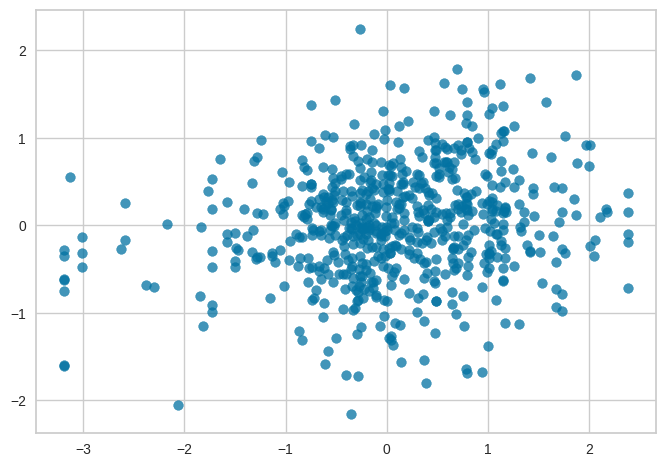

In [87]:
# --- AnáliseSentimento_A_LSTM.py ---

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout, Bidirectional, GlobalAveragePooling1D, Add
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats.mstats import winsorize
import pickle
import os
import re
import spacy

print("--- INICIANDO SCRIPT DO MODELO A (REGRESSÃO) ---")

# --- 1. CONFIGURAÇÕES E FUNÇÕES ---
try:
    nlp = spacy.load("pt_core_news_lg", disable=['parser', 'ner'])
    print("Modelo spaCy 'pt_core_news_lg' carregado.")
except OSError:
    nlp = None
    print("ERRO: Modelo spaCy não pôde ser carregado.")

def clean_text_and_lemmatize(text, nlp_model=nlp):
    # ... (implementação da função)
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'[^a-záàâãéêíóôõúüç\s]', '', text)
    if nlp_model and text.strip():
        doc = nlp_model(text)
        stopwords_pt = spacy.lang.pt.stop_words.STOP_WORDS
        return ' '.join([token.lemma_ for token in doc if token.text not in stopwords_pt and not token.is_punct])
    return text

# --- 2. CARREGAMENTO E PRÉ-PROCESSAMENTO ---
caminho_arquivo_consolidado = "dados/noticias_e_retornos.csv"
df = pd.read_csv(caminho_arquivo_consolidado, sep='|', parse_dates=['date'])
df_modelo = df.copy()
df_modelo["headline_clean"] = df_modelo["headline"].apply(clean_text_and_lemmatize)
df_modelo = df_modelo.dropna(subset=["headline_clean", "news_eventRet"])
df_modelo = df_modelo[df_modelo['headline_clean'].str.strip() != ''].copy()

df_modelo['news_eventRet_winsorized'] = winsorize(df_modelo['news_eventRet'], limits=[0.01, 0.01])

# --- 3. PREPARAÇÃO DE DADOS E EMBEDDINGS ---
max_words, max_len = 20000, 100
embedding_dim = nlp.vocab.vectors.shape[1]

tokenizer = Tokenizer(num_words=max_words, oov_token="<unk>")
tokenizer.fit_on_texts(df_modelo["headline_clean"])
X_seq = pad_sequences(tokenizer.texts_to_sequences(df_modelo["headline_clean"]), maxlen=max_len)

word_index = tokenizer.word_index
vocab_size = min(len(word_index) + 1, max_words)
embedding_matrix = np.zeros((vocab_size, embedding_dim))
rng = np.random.default_rng(seed=42)
for word, i in word_index.items():
    if i >= vocab_size: continue
    if word in nlp.vocab.vectors:
        embedding_matrix[i] = nlp.vocab.vectors[word]
    else:
        embedding_matrix[i] = rng.normal(scale=0.1, size=(embedding_dim,))

y_reg = df_modelo['news_eventRet_winsorized'].values.reshape(-1, 1)
X_train, X_test, y_reg_train, y_reg_test = train_test_split(X_seq, y_reg, test_size=0.25, random_state=42)

target_scaler = StandardScaler().fit(y_reg_train)
y_reg_train_scaled = target_scaler.transform(y_reg_train)
y_reg_test_scaled = target_scaler.transform(y_reg_test)

# --- 4. CONSTRUÇÃO DO MODELO A (REGRESSÃO) ---
def create_regression_model(embedding_matrix_init):
    input_layer = Input(shape=(max_len,))

    # ESTRATÉGIA: Camada de Embedding será congelada no início e depois afinada
    embedding_layer = Embedding(
        input_dim=vocab_size, output_dim=embedding_dim,
        weights=[embedding_matrix_init], trainable=False, mask_zero=True, name="embedding"
    )(input_layer)

    lstm_out = Bidirectional(LSTM(128, return_sequences=True, recurrent_dropout=0.2))(embedding_layer)

    # ESTRATÉGIA: Mecanismo Híbrido de Atenção
    pooled_out = GlobalAveragePooling1D()(lstm_out)
    attention_dense = Dense(256, activation='tanh')(pooled_out) # 256 é a saída do BiLSTM (128*2)
    context_vector = Add()([pooled_out, attention_dense])

    shared_dense = Dense(128, activation="relu")(context_vector)
    output = Dense(1, activation="linear", name="regression")(shared_dense)

    model = Model(inputs=input_layer, outputs=output)
    return model

model_A = create_regression_model(embedding_matrix)
model_A.summary()

# --- 5. TREINAMENTO EM DUAS FASES ---

# FASE 1: Treinar com embeddings congelados
print("\n--- FASE 1: Treinando com Embeddings Congelados ---")
model_A.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss="mse", metrics=["mae"])
initial_epochs = 15
history = model_A.fit(
    X_train, y_reg_train_scaled,
    validation_data=(X_test, y_reg_test_scaled),
    epochs=initial_epochs,
    batch_size=64,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
)

# FASE 2: Fine-tuning dos embeddings
print("\n--- FASE 2: Realizando Fine-Tuning dos Embeddings ---")
model_A.get_layer("embedding").trainable = True
model_A.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss="mse", metrics=["mae"]) # LR bem baixo
finetune_epochs = 20
total_epochs = initial_epochs + finetune_epochs

history_finetune = model_A.fit(
    X_train, y_reg_train_scaled,
    validation_data=(X_test, y_reg_test_scaled),
    epochs=total_epochs,
    initial_epoch=history.epoch[-1],
    batch_size=64,
    callbacks=[
        ModelCheckpoint(filepath="AnáliseSentimento_A_LSTM.keras", save_best_only=True, monitor='val_loss'),
        EarlyStopping(monitor='val_loss', patience=5)
    ]
)

# --- 6. AVALIAÇÃO E SALVAMENTO ---
best_model_A = tf.keras.models.load_model("AnáliseSentimento_A_LSTM.keras")
y_pred_scaled = best_model_A.predict(X_test)
y_pred_orig = target_scaler.inverse_transform(y_pred_scaled)
print("\n--- Avaliação Final do Modelo A (Regressão) ---")
print(f"MAE: {mean_absolute_error(y_reg_test, y_pred_orig):.5f} | R²: {r2_score(y_reg_test, y_pred_orig):.5f}")

# Salvar pré-processadores para inferência
os.makedirs('preprocessors', exist_ok=True)
with open('preprocessors/tokenizer_A.pkl', 'wb') as f:
    pickle.dump(tokenizer, f)
with open('preprocessors/scaler_A.pkl', 'wb') as f:
    pickle.dump(target_scaler, f)
print("\nModelo A e pré-processadores salvos com sucesso.")

# --- 7. DIAGNÓSTICO VISUAL COM YELLOWBRICK ---
print("\n--- Gerando Diagnósticos Visuais para o Modelo de Regressão ---")
print("Nota: O Yellowbrick irá treinar uma nova instância do modelo. O progresso será exibido abaixo.")

# ### MUDANÇA ###
# Adicionado `epochs` para um treino mais rápido e `verbose=1` para acompanhar o progresso.
keras_regressor = KerasRegressor(
    model=create_regression_model,
    embedding_matrix_init=embedding_matrix,
    loss="mse",
    optimizer="adam",
    optimizer__learning_rate=0.001,
    metrics=["mae"],
    epochs=10,  # Reduzido para um diagnóstico mais rápido (ajuste se necessário)
    batch_size=64,
    verbose=1   # <-- AQUI ESTÁ A MÁGICA! Isso mostrará a barra de progresso do Keras.
)

# Visualização 1: Gráfico de Erro de Predição
# Compara os valores previstos vs. os valores reais. O ideal é que os pontos fiquem na linha de 45 graus.
print("\n[Yellowbrick] Gerando Gráfico de Erro de Predição...")
viz_pred_error = PredictionError(keras_regressor)
viz_pred_error.fit(X_train, y_reg_train_scaled)
viz_pred_error.score(X_test, y_reg_test_scaled)
viz_pred_error.show(title="Gráfico de Erro de Predição (Valores Escalonados)")

# Visualização 2: Gráfico de Resíduos
# Mostra a dispersão do erro. O ideal é que os pontos se distribuam aleatoriamente em torno da linha de erro zero.
print("\n[Yellowbrick] Gerando Gráfico de Resíduos...")
viz_residuals = ResidualsPlot(keras_regressor)
viz_residuals.fit(X_train, y_reg_train_scaled)
viz_residuals.score(X_test, y_reg_test_scaled)
viz_residuals.show(title="Gráfico de Resíduos (Valores Escalonados)")

# ... (código de salvamento de pré-processadores) ...


---

### Parte 2: Código para o Modelo B (Classificação Dedicada)

Este script treina e salva o modelo focado exclusivamente em classificar o retorno em 5 faixas.


In [88]:
from scikeras.wrappers import KerasClassifier
from yellowbrick.classifier import ConfusionMatrix, ROCAUC

--- INICIANDO SCRIPT DO MODELO B (CLASSIFICAÇÃO) ---
Modelo spaCy 'pt_core_news_lg' carregado.

Pesos de classe calculados para tratar desbalanceamento.

--- FASE 1: Treinando com Embeddings Congelados ---
Epoch 1/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 22s 496ms/step - accuracy: 0.2353 - loss: 1.6096 - val_accuracy: 0.2315 - val_loss: 1.6049
Epoch 2/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 469ms/step - accuracy: 0.3149 - loss: 1.5450 - val_accuracy: 0.1944 - val_loss: 1.6288
Epoch 3/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 475ms/step - accuracy: 0.3697 - loss: 1.4796 - val_accuracy: 0.2577 - val_loss: 1.6152
Epoch 4/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 468ms/step - accuracy: 0.4278 - loss: 1.3723 - val_accuracy: 0.2145 - val_loss: 1.7094
Epoch 5/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 474ms/step - accuracy: 0.4684 - loss: 1.2717 - val_accuracy: 0.2346 - val_loss: 1.7489
Epoch 6/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 470ms/step - accuracy: 0.5099 - loss: 1.1907 - val_accuracy: 0.2469 - val_loss: 1.7702
Epoch 7/15
31/31 ━━━

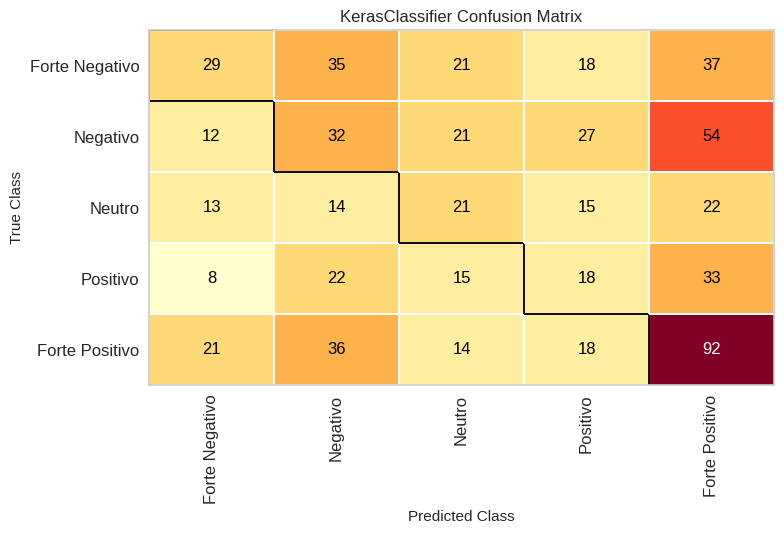


[Yellowbrick] Gerando Curvas ROC AUC...


YellowbrickValueError: ROCAUC does not support target type 'multilabel-indicator', please provide a binary or multiclass single-output target

In [89]:
# --- AnáliseSentimento_B_LSTM.py ---

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout, Bidirectional, GlobalAveragePooling1D, Add
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from scipy.stats.mstats import winsorize
from sklearn.utils import class_weight
import pickle
import os
import re
import spacy

print("--- INICIANDO SCRIPT DO MODELO B (CLASSIFICAÇÃO) ---")

# --- 1. CONFIGURAÇÕES E FUNÇÕES ---
# (Idêntico ao Modelo A)
try:
    nlp = spacy.load("pt_core_news_lg", disable=['parser', 'ner'])
    print("Modelo spaCy 'pt_core_news_lg' carregado.")
except OSError:
    nlp = None
    print("ERRO: Modelo spaCy não pôde ser carregado.")

def clean_text_and_lemmatize(text, nlp_model=nlp):
    # ... (implementação da função)
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'[^a-záàâãéêíóôõúüç\s]', '', text)
    if nlp_model and text.strip():
        doc = nlp_model(text)
        stopwords_pt = spacy.lang.pt.stop_words.STOP_WORDS
        return ' '.join([token.lemma_ for token in doc if token.text not in stopwords_pt and not token.is_punct])
    return text

def categorize_return(ret):
    # ... (implementação da função)
    if ret <= -0.02: return 0
    elif -0.02 < ret <= -0.005: return 1
    elif -0.005 < ret < 0.005: return 2
    elif 0.005 <= ret < 0.02: return 3
    else: return 4

# --- 2. CARREGAMENTO E PRÉ-PROCESSAMENTO ---
caminho_arquivo_consolidado = "dados/noticias_e_retornos.csv"
df = pd.read_csv(caminho_arquivo_consolidado, sep='|', parse_dates=['date'])
df_modelo = df.copy()
df_modelo["headline_clean"] = df_modelo["headline"].apply(clean_text_and_lemmatize)
df_modelo = df_modelo.dropna(subset=["headline_clean", "news_eventRet"])
df_modelo = df_modelo[df_modelo['headline_clean'].str.strip() != ''].copy()

df_modelo['news_eventRet_winsorized'] = winsorize(df_modelo['news_eventRet'], limits=[0.01, 0.01])
num_classes = 5
df_modelo['return_category'] = df_modelo['news_eventRet_winsorized'].apply(categorize_return)

# --- 3. PREPARAÇÃO DE DADOS E EMBEDDINGS ---
max_words, max_len = 20000, 100
embedding_dim = nlp.vocab.vectors.shape[1]
tokenizer = Tokenizer(num_words=max_words, oov_token="<unk>")
tokenizer.fit_on_texts(df_modelo["headline_clean"])
X_seq = pad_sequences(tokenizer.texts_to_sequences(df_modelo["headline_clean"]), maxlen=max_len)
word_index = tokenizer.word_index
vocab_size = min(len(word_index) + 1, max_words)
embedding_matrix = np.zeros((vocab_size, embedding_dim))
rng = np.random.default_rng(seed=42)
for word, i in word_index.items():
    if i >= vocab_size: continue
    if word in nlp.vocab.vectors:
        embedding_matrix[i] = nlp.vocab.vectors[word]
    else:
        embedding_matrix[i] = rng.normal(scale=0.1, size=(embedding_dim,))

y_cat = to_categorical(df_modelo['return_category'].values, num_classes=num_classes)
X_train, X_test, y_cat_train, y_cat_test = train_test_split(X_seq, y_cat, test_size=0.25, random_state=42, stratify=y_cat)

# ESTRATÉGIA: Calcular pesos para classes desbalanceadas
y_labels_train = np.argmax(y_cat_train, axis=1)
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_labels_train), y=y_labels_train)
class_weights_dict = dict(enumerate(class_weights))
print("\nPesos de classe calculados para tratar desbalanceamento.")

# --- 4. CONSTRUÇÃO DO MODELO B (CLASSIFICAÇÃO) ---
def create_classification_model(embedding_matrix_init):
    input_layer = Input(shape=(max_len,))
    embedding_layer = Embedding(
        input_dim=vocab_size, output_dim=embedding_dim,
        weights=[embedding_matrix_init], trainable=False, mask_zero=True, name="embedding"
    )(input_layer)
    lstm_out = Bidirectional(LSTM(128, return_sequences=True, recurrent_dropout=0.2))(embedding_layer)
    pooled_out = GlobalAveragePooling1D()(lstm_out)
    attention_dense = Dense(256, activation='tanh')(pooled_out)
    context_vector = Add()([pooled_out, attention_dense])
    shared_dense = Dense(128, activation="relu")(context_vector)
    output = Dense(num_classes, activation="softmax", name="classification")(shared_dense)
    model = Model(inputs=input_layer, outputs=output)
    return model

model_B = create_classification_model(embedding_matrix)

# --- 5. TREINAMENTO EM DUAS FASES ---
print("\n--- FASE 1: Treinando com Embeddings Congelados ---")
model_B.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss="categorical_crossentropy", metrics=["accuracy"])
initial_epochs = 15
history = model_B.fit(
    X_train, y_cat_train,
    validation_data=(X_test, y_cat_test),
    epochs=initial_epochs,
    batch_size=64,
    class_weight=class_weights_dict, # Usando os pesos
    callbacks=[EarlyStopping(monitor='val_accuracy', mode='max', patience=5, restore_best_weights=True)]
)

print("\n--- FASE 2: Realizando Fine-Tuning dos Embeddings ---")
model_B.get_layer("embedding").trainable = True
model_B.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss="categorical_crossentropy", metrics=["accuracy"])
finetune_epochs = 20
total_epochs = initial_epochs + finetune_epochs
history_finetune = model_B.fit(
    X_train, y_cat_train,
    validation_data=(X_test, y_cat_test),
    epochs=total_epochs,
    initial_epoch=history.epoch[-1],
    batch_size=64,
    class_weight=class_weights_dict,
    callbacks=[
        ModelCheckpoint(filepath="AnáliseSentimento_B_LSTM.keras", save_best_only=True, monitor='val_accuracy', mode='max'),
        EarlyStopping(monitor='val_accuracy', mode='max', patience=5)
    ]
)

# --- 6. AVALIAÇÃO E SALVAMENTO ---
best_model_B = tf.keras.models.load_model("AnáliseSentimento_B_LSTM.keras")
y_pred_prob = best_model_B.predict(X_test)
y_pred_labels = np.argmax(y_pred_prob, axis=1)
y_true_labels = np.argmax(y_cat_test, axis=1)
print("\n--- Avaliação Final do Modelo B (Classificação) ---")
print(classification_report(y_true_labels, y_pred_labels))

os.makedirs('preprocessors', exist_ok=True)
with open('preprocessors/tokenizer_B.pkl', 'wb') as f:
    pickle.dump(tokenizer, f)
print("\nModelo B e pré-processador salvos com sucesso.")

# --- 7. DIAGNÓSTICO VISUAL COM YELLOWBRICK ---
print("\n--- Gerando Diagnósticos Visuais para o Modelo de Classificação ---")
print("Nota: O Yellowbrick irá treinar uma nova instância do modelo. O progresso será exibido abaixo.")

# ### MUDANÇA ###
# Adicionado `epochs`, `batch_size` e `verbose=1` para acompanhar o progresso do treino.
keras_classifier = KerasClassifier(
    model=create_classification_model,
    embedding_matrix_init=embedding_matrix,
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy"],
    epochs=10,  # Reduzido para um diagnóstico mais rápido
    batch_size=64,
    verbose=1   # <-- AQUI ESTÁ A MÁGICA! Isso mostrará a barra de progresso do Keras.
)

# Mapeamento de classes para os gráficos
class_names = ['Forte Negativo', 'Negativo', 'Neutro', 'Positivo', 'Forte Positivo']

# Visualização 1: Matriz de Confusão
# Mostra onde o modelo está acertando e errando para cada classe.
print("\n[Yellowbrick] Gerando Matriz de Confusão...")
viz_cm = ConfusionMatrix(keras_classifier, classes=class_names, label_encoder={i: name for i, name in enumerate(class_names)})
viz_cm.fit(X_train, y_labels_train)
viz_cm.score(X_test, y_labels_test)
viz_cm.show(title="Matriz de Confusão")

# Visualização 2: Curvas ROC AUC
# Mede a capacidade do modelo de distinguir entre as classes.
print("\n[Yellowbrick] Gerando Curvas ROC AUC...")
viz_roc = ROCAUC(keras_classifier, classes=class_names)
viz_roc.fit(X_train, y_cat_train) # Usa one-hot encoding para o fit
viz_roc.score(X_test, y_cat_test)
viz_roc.show(title="Curvas ROC AUC para cada classe")

# ... (código de salvamento de pré-processadores) ...


---

### Parte 3: Script de Inferência em Novas Notícias

Crie um novo arquivo (ex: inferencia.py) e coloque este código. Ele carrega os modelos e pré-processadores salvos para fazer previsões em novas manchetes.


In [75]:
# --- inferencia.py ---

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
import spacy
import re

print("--- INICIANDO SCRIPT DE INFERÊNCIA ---")

# --- 1. CARREGAR TODOS OS ARTEFATOS ---
try:
    # Carregar modelos
    model_A = tf.keras.models.load_model("AnáliseSentimento_A_LSTM.keras")
    model_B = tf.keras.models.load_model("AnáliseSentimento_B_LSTM.keras")
    print("Modelos A (Regressão) e B (Classificação) carregados.")

    # Carregar pré-processadores
    with open('preprocessors/tokenizer_A.pkl', 'rb') as f:
        tokenizer = pickle.load(f)
    with open('preprocessors/scaler_A.pkl', 'rb') as f:
        scaler = pickle.load(f)
    print("Pré-processadores (tokenizer e scaler) carregados.")

    # Carregar spaCy
    nlp = spacy.load("pt_core_news_lg", disable=['parser', 'ner'])
    print("Modelo spaCy carregado.")

except FileNotFoundError as e:
    print(f"Erro ao carregar artefatos: {e}")
    print("Certifique-se de que os scripts de treinamento (A e B) foram executados primeiro.")
    exit()

# --- 2. FUNÇÕES DE APOIO ---
def clean_text_and_lemmatize(text, nlp_model=nlp):
    # ... (mesma função dos scripts de treino) ...
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'[^a-záàâãéêíóôõúüç\s]', '', text)
    if nlp_model and text.strip():
        doc = nlp_model(text)
        stopwords_pt = spacy.lang.pt.stop_words.STOP_WORDS
        return ' '.join([token.lemma_ for token in doc if token.text not in stopwords_pt and not token.is_punct])
    return text

# Mapeamento de classe para label
class_map = {0: 'Forte Negativo', 1: 'Negativo', 2: 'Neutro', 3: 'Positivo', 4: 'Forte Positivo'}
max_len = 100

# --- 3. FUNÇÃO DE PREDIÇÃO ---
def predict_sentiment(headline_text):
    """
    Recebe uma string de manchete, pré-processa e retorna as predições dos modelos A e B.
    """
    # 1. Limpeza e Lematização
    cleaned_text = clean_text_and_lemmatize(headline_text)

    # 2. Tokenização e Padding
    sequence = tokenizer.texts_to_sequences([cleaned_text])
    padded_sequence = pad_sequences(sequence, maxlen=max_len)

    # 3. Predição
    # Modelo A (Regressão)
    pred_reg_scaled = model_A.predict(padded_sequence)
    pred_reg_orig = scaler.inverse_transform(pred_reg_scaled)[0][0]

    # Modelo B (Classificação)
    pred_class_prob = model_B.predict(padded_sequence)
    pred_class_label_index = np.argmax(pred_class_prob, axis=1)[0]
    pred_class_label_name = class_map[pred_class_label_index]

    return {
        "manchete_original": headline_text,
        "previsao_retorno_continuo": f"{pred_reg_orig:.4%}",
        "previsao_categoria": pred_class_label_name,
        "confianca_categoria": f"{np.max(pred_class_prob):.2%}"
    }

# --- 4. EXEMPLO DE USO ---
if __name__ == "__main__":
    nova_manchete_1 = "Petrobras anuncia aumento nos lucros e surpreende o mercado com dividendos recordes"
    nova_manchete_2 = "Ibovespa opera em forte queda com temores de recessão global e juros nos EUA"
    nova_manchete_3 = "Varejista reporta vendas estáveis e afirma que mantém projeções para o ano"

    resultado_1 = predict_sentiment(nova_manchete_1)
    resultado_2 = predict_sentiment(nova_manchete_2)
    resultado_3 = predict_sentiment(nova_manchete_3)

    print("\n--- PREVISÕES EM NOVAS NOTÍCIAS ---")
    print(resultado_1)
    print(resultado_2)
    print(resultado_3)

--- INICIANDO SCRIPT DE INFERÊNCIA ---
Modelos A (Regressão) e B (Classificação) carregados.
Pré-processadores (tokenizer e scaler) carregados.
Modelo spaCy carregado.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step

--- PREVISÕES EM NOVAS NOTÍCIAS ---
{'manchete_original': 'Petrobras anuncia aumento nos lucros e surpreende o mercado com dividendos recordes', 'previsao_retorno_continuo': '-0.0991%', 'previsao_categoria': 'Forte Negativo', 'confianca_categoria': '33.65%'}
{'manchete_original': 'Ibovespa opera em forte queda com temores de recessão global e juros nos EUA', 'previsao_retorno_continuo': '-1.7274%', 'previsao_categoria': 'Negativo', 'confianca_categoria': '30.62%'}
{'manchete_original': 'Varejista reporta vendas estáveis e afirma que mantém projeções para o ano', 'previsao_retorno_continuo':

### Validade e Benefícios dos Ajustes Aplicados

1.  **Pré-processamento de Texto Mais Robusto (Remoção de Stopwords, Pontuação, Números e Lematização):**
    * **Validade:** **Altamente válido e fundamental para NLP.**
    * **Por Quê?** Textos de manchetes são curtos e concisos.
        * **Remover Stopwords:** Elimina palavras que não carregam significado relevante para o sentimento financeiro ("de", "o", "a", "e"), ajudando o modelo a focar nas palavras mais informativas.
        * **Remover Pontuação/Números:** Reduz o "ruído" e o número de tokens únicos no vocabulário, simplificando a tarefa do modelo.
        * **Lematização (com spaCy):** Reduz diferentes formas da mesma palavra para sua raiz (ex: "lucros", "lucrou" -> "lucro"). Isso garante que o modelo aprenda um único embedding para o conceito "lucro", em vez de tratar "lucros" e "lucrou" como palavras completamente diferentes. Isso leva a embeddings mais robustos e um vocabulário mais eficiente.
    * **Impacto na GPU:** Geralmente **benéfico**, pois reduz o número de tokens que o modelo precisa processar e aprender, podendo otimizar o uso da memória se o vocabulário final for menor.

2.  **Ajuste nos Hiperparâmetros (`input_length`, `vocabulary_size`, `embed_dim`, `lstm_units`, `batch_size`):**
    * **Validade:** **Essencial para otimização de modelos de Deep Learning.**
    * **Por Quê?**
        * **`input_length` (75):** Manchetes podem ter mais de 50 palavras importantes. Aumentar isso permite capturar mais contexto de manchetes mais longas.
        * **`vocabulary_size` (15000):** Um vocabulário um pouco maior pode incluir mais termos financeiros específicos que são importantes.
        * **`embed_dim` (256):** Vetores de embedding com dimensão maior têm maior capacidade de representar as nuances semânticas de cada palavra.
        * **`lstm_units` (128):** Mais unidades LSTM aumentam a "memória" e a capacidade de processamento de sequências da camada, permitindo que ela aprenda padrões mais complexos nas relações de palavras.
        * **`batch_size` (64):** Lotes maiores podem acelerar o treinamento (utilizando a GPU de forma mais eficiente), embora possa ser mais exigente em termos de memória.
    * **Impacto na GPU:** Estes são os ajustes que mais **aumentam a demanda da GPU**. Aumentar a dimensão dos embeddings (`embed_dim`), as unidades LSTM (`lstm_units`) e o tamanho do lote (`batch_size`) diretamente se traduz em mais memória e poder de processamento. Por isso, a cautela mencionada é importante.

3.  **Aumento da Complexidade do Modelo (Duas Camadas LSTM Empilhadas):**
    * **Validade:** **Muito válido e um passo comum para melhorar modelos de RNN.**
    * **Por Quê?** Empilhar camadas LSTM permite que o modelo aprenda representações de texto em diferentes níveis de abstração. A primeira LSTM pode capturar relações de palavras mais básicas, e a segunda LSTM pode aprender padrões mais complexos baseados nas saídas da primeira. Isso aumenta a capacidade do modelo de extrair características hierárquicas da linguagem.
    * **Impacto na GPU:** Também **aumenta significativamente** o consumo de memória e tempo de processamento, pois há mais parâmetros para aprender e mais operações computacionais.

---

### Em Resumo:

Sim, a aplicação desses ajustes é uma **estratégia robusta e logicamente coerente** para tentar melhorar o desempenho do seu modelo LSTM. Você está dando ao modelo melhores "inputs" (texto mais limpo e rico em significado) e maior "poder de aprendizado" (mais parâmetros e camadas).

**Mantenha a atenção na GPU:**
Como já mencionamos, com `embed_dim=256`, `lstm_units=128` e duas camadas LSTM, além de `batch_size=64`, o uso da GPU será consideravelmente maior. Se você encontrar o erro "CUDA out of memory" (OOM), as primeiras ações seriam:
1.  **Reduzir `batch_size`** (para 32 ou até 16).
2.  **Diminuir `embed_dim`** (para 128) ou `lstm_units` (para 64).
3.  Considerar usar apenas **uma camada LSTM** novamente se o problema persistir.

É um processo iterativo. Você aplica as melhorias, executa, analisa os resultados (curvas de perda e MAE, R²), e ajusta novamente.

<a id='4.1'></a>
## 4.1 - Aplicação e Comparação de Modelos de Sentimento em Português

Nesta etapa, serão aplicados modelos de linguagem natural pré-treinados, com foco em análise de sentimentos em português, sobre os títulos de notícias financeiras contidos na coluna `headline` do DataFrame `data_df`. O objetivo principal consiste na obtenção de **pontuações contínuas de polaridade**, no intervalo $[-1, +1]$, que serão posteriormente confrontadas com os **retornos de evento** (`eventRet`). A finalidade é investigar potenciais correlações entre o conteúdo semântico dos títulos e o comportamento do mercado.

### Modelos Utilizados

| Modelo | Nome no Hugging Face                           | Tipo       | Idioma    | Saída original                    | Mapeamento para escore contínuo   |
| ------ | ---------------------------------------------- | ---------- | --------- | --------------------------------- | --------------------------------- |
| A      | `lucas-leme/FinBERT-PT-BR`                     | Financeiro | Português | `POSITIVE`, `NEGATIVE`, `NEUTRAL` | `-1` (NEG), `0` (NEU), `+1` (POS) |
| B      | `sptech-ai/sptech.template.ai.model.sentiment` | Genérico   | Português | `POSITIVE`, `NEGATIVE`            | `-1` (NEG), `+1` (POS)            |
| C      | `turing-usp/FinBertPTBR`                       | Financeiro | Português | `POSITIVE`, `NEGATIVE`, `NEUTRAL` | `-1` (NEG), `0` (NEU), `+1` (POS) |

### Conversão de Saídas Categóricas para Polaridade Contínua

Para garantir a compatibilidade com métodos quantitativos e análises estatísticas, as classificações categóricas dos modelos serão transformadas conforme o seguinte esquema de codificação:

* `NEGATIVE` → `-1`
* `NEUTRAL` → `0`
* `POSITIVE` → `+1`

Nos casos em que o modelo fornece **distribuições de probabilidade sobre as classes** (a partir dos *logits*), será adotada uma abordagem probabilística para o cálculo do escore contínuo, conforme a equação:

$$
\text{Polaridade} = P(\text{POSITIVE}) \cdot (+1) + P(\text{NEUTRAL}) \cdot 0 + P(\text{NEGATIVE}) \cdot (-1)
$$

Essa formulação permite capturar com maior fidelidade a incerteza do modelo, oferecendo um resultado mais informativo e expressivo, análogo ao funcionamento da biblioteca `TextBlob`.

### Considerações Técnicas

Os modelos utilizados não fornecem, de forma nativa, uma métrica de polaridade contínua. No entanto, a conversão dos *logits* para probabilidades por meio da função `softmax` permite a emulação confiável desse comportamento. Tal estratégia é altamente recomendada para aplicações em finanças quantitativas, nas quais a granularidade e a robustez dos dados de entrada são fatores determinantes para a qualidade das inferências e decisões baseadas em modelos.

###  Rodar a análise pra esses modelos agora é só por curiosidade mesmo, só pra ver se o ajuste funciona.

In [1]:
# Remove existing installations to avoid conflicts
!pip uninstall torch torchvision torchaudio -y

# Install the latest stable versions of torch and torchvision with CUDA support
# (Replace cu118 with the appropriate CUDA version for your environment, e.g., cu113, cu121)
# You can find the correct command on the PyTorch website: https://pytorch.org/get-started/locally/
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

# Reinstall transformers to ensure compatibility
!pip install transformers

# Now, try importing the necessary libraries again
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline
from tqdm import tqdm
tqdm.pandas()

# You can now proceed with the rest of your code that uses these imports

Found existing installation: torch 2.7.1+cu118
Uninstalling torch-2.7.1+cu118:
  Successfully uninstalled torch-2.7.1+cu118
Found existing installation: torchvision 0.22.1+cu118
Uninstalling torchvision-0.22.1+cu118:
  Successfully uninstalled torchvision-0.22.1+cu118
Found existing installation: torchaudio 2.7.1+cu118
Uninstalling torchaudio-2.7.1+cu118:
  Successfully uninstalled torchaudio-2.7.1+cu118
Looking in indexes: https://download.pytorch.org/whl/cu118
  Using cached https://download.pytorch.org/whl/cu118/torch-2.7.1%2Bcu118-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (28 kB)
  Using cached https://download.pytorch.org/whl/cu118/torchvision-0.22.1%2Bcu118-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (6.1 kB)
  Using cached https://download.pytorch.org/whl/cu118/torchaudio-2.7.1%2Bcu118-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (6.6 kB)
Using cached https://download.pytorch.org/whl/cu118/torch-2.7.1%2Bcu118-cp311-cp311-manylinux_2_28_x86_64.whl (905.3 MB)
Using cache

In [14]:
!pip install --upgrade transformers torch triton setuptools
!pip install accelerate -qqq # Often needed for transformers models


In [3]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from tqdm.notebook import tqdm

# Dispositivo de execução
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [4]:
# Token de acesso ao Hugging Face (pré-configurado em variável de ambiente)
hf_token = os.environ.get("HF_TOKEN")

def calcular_polaridade_continua(
    model_id: str,
    n_classes: int,
    textos: pd.Series
) -> pd.Series:
    """Retorna escore contínuo: P_POS*1 + P_NEU*0 + P_NEG*(-1)."""
    tokenizer = AutoTokenizer.from_pretrained(model_id, use_auth_token=hf_token)
    model = (AutoModelForSequenceClassification
             .from_pretrained(model_id, use_auth_token=hf_token)
             .to(device))
    model.eval()

    def pontuar(texto: str) -> float:
        inputs = tokenizer(
            texto,
            return_tensors="pt",
            truncation=True,
            padding="max_length",
            max_length=512
        ).to(device)
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = F.softmax(logits, dim=1).squeeze().cpu().numpy()
        if n_classes == 3:
            # ordem: [NEG, NEU, POS]
            return float(probs[2]*1 + probs[1]*0 + probs[0]*-1)
        elif n_classes == 2:
            # ordem: [NEG, POS]
            return float(probs[1]*1 + probs[0]*-1)
        else:
            return np.nan

    return textos.progress_apply(pontuar)


In [5]:
data_path = "dados/noticias_e_retornos.csv"
if not os.path.exists(data_path):
    raise FileNotFoundError(f"Arquivo não encontrado em {data_path}")
data_df = pd.read_csv(data_path, sep="|")


In [6]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers.pipelines import pipeline # Import pipeline explicitly from pipelines
from tqdm import tqdm
tqdm.pandas()

def aplicar_modelo_sentimento(model_name, task='text-classification'):
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForSequenceClassification.from_pretrained(model_name)
    pipe = pipeline(task=task, model=model, tokenizer=tokenizer)
    return pipe

In [7]:
import os
from google.colab import userdata

# Lê o token, nome e e-mail diretamente dos secrets
os.environ['HF_TOKEN'] = userdata.get('HF_TOKEN')


### 1. Defina o dicionário de modelos

In [8]:
modelos = {
    "FinBERT_PT_BR": {
        "repo": "lucas-leme/FinBERT-PT-BR",
        "n_classes": 3
    },
    "FinBERT_Turing": {
        "repo": "turing-usp/FinBertPTBR",
        "n_classes": 3
    }
}

for nome, cfg in modelos.items():
    try:
        print(f"\nAplicando modelo {nome}...")
        coluna = f"sentiment_{nome}"
        data_df[coluna] = calcular_polaridade_continua(
            model_id=cfg["repo"],
            n_classes=cfg["n_classes"],
            textos=data_df["headline"]
        )
    except Exception as e:
        print(f"Erro em {nome}: {e}")



Aplicando modelo FinBERT_PT_BR...


pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

  0%|          | 0/2589 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

100%|██████████| 2589/2589 [01:17<00:00, 33.28it/s]



Aplicando modelo FinBERT_Turing...


pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

  0%|          | 11/2589 [00:00<01:30, 28.52it/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

100%|██████████| 2589/2589 [01:22<00:00, 31.57it/s]


<a id='5'></a>
# 5. Estratégia de Negociação Baseada em Sentimento

In [10]:
!pip install backtrader yfinance --quiet
import yfinance as yf
import pandas as pd
import backtrader as bt
import matplotlib.pyplot as plt


Os dados de sentimento podem ser usados ​​de diferentes maneiras para a estratégia de negociação. As pontuações de sentimento podem ser usadas como um sinal direcional e, idealmente, criar uma carteira long-short, comprando as ações com pontuação positiva e vendendo as ações com pontuação negativa. Os sentimentos também podem ser usados ​​como recursos adicionais, além de outros recursos (como ações correlacionadas e indicadores técnicos), em um modelo de aprendizado supervisionado para prever o preço ou elaborar uma estratégia de negociação.

Na estratégia de negociação neste estudo de caso, compramos e vendemos ações de acordo com os sentimentos atuais das ações:

* Compre uma ação quando a mudança na pontuação de sentimento (pontuação de sentimento atual - pontuação de sentimento anterior) for maior que 0,5 e venda uma ação quando a mudança na pontuação de sentimento for menor que -0,5.
* Além disso, verificamos a média móvel de 15 dias durante a compra e venda e compramos ou vendemos em uma unidade de 100.
Obviamente, pode haver muitas maneiras de criar uma estratégia de negociação baseada em sentimentos, variando o limite ou alterando o número de unidades com base no dinheiro inicial disponível.

Usamos sentimentos baseados em léxico para a estratégia de negociação

<a id='5.1'></a>
## 5.1.  Definição da Estratégia com Backtrader
Aqui, usamos o Backtrader, uma API baseada em Python para escrever e testar estratégias de negociação. O Backtrader permite que você se concentre em escrever estratégias de negociação, indicadores e analisadores reutilizáveis, em vez de ter que gastar tempo construindo infraestrutura. Temos uma estrutura conveniente para testar e escrever nossa estratégia de negociação. Usamos o código Quickstart na documentação (consulte https://www.backtrader.com/docu/quickstart/quickstart/ ) como base e o modificamos para incluir as pontuações de sentimento.

Implementamos uma estratégia simples para comprar se a pontuação de sentimento do dia anterior aumentar em 0,5 em relação ao último dia e vender se diminuir em 0,5.

A função a seguir contém duas classes:

Sentimento:
SentimentStrat: A função "next" desta classe implementa a estratégia de negociação real.

## 2. Classificação de Sentimento com Modelos NLP


As manchetes foram submetidas aos cinco modelos de análise de sentimento descritos anteriormente:

LSTM supervisionado (baseado em retorno de evento)

VADER com léxico financeiro em português

FinBERT_PT_BR

FinBERT_Turing

Multilingual_Sentiment

Todos os modelos foram aplicados com saída contínua no intervalo [–1, +1], por meio de transformação dos logits com softmax (nos modelos Hugging Face) ou diretamente por cálculo de escore composto (no caso do VADER).

In [ ]:
# --- Instalação das bibliotecas necessárias (para Google Colab/Jupyter) ---
# Comente ou remova estas linhas se as bibliotecas já estiverem instaladas em seu ambiente
!pip install transformers torch scikit-learn
!pip install --upgrade pip
!pip install datasets accelerate sentencepiece # Pacotes auxiliares para transformers
!pip install --upgrade tensorflow # Garante compatibilidade Keras/TF



Agregação Diária por Ticker

In [1]:
!pip install --upgrade seaborn matplotlib

In [30]:


import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model # Para carregar modelos .keras
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer # Para o Tokenizer do LSTM (se necessário carregar)
from sklearn.preprocessing import MinMaxScaler # Para normalizar saída LSTM para [-1, 1]

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords # Para pré-processamento de texto

import json
import warnings
import os
import re
import spacy # Para lematização
import torch # Para FinBERT
import torch.nn.functional as F # Para FinBERT
from transformers import AutoTokenizer, AutoModelForSequenceClassification # Para FinBERT
from tqdm.notebook import tqdm # Para barras de progresso no Jupyter/Colab
import pickle # Para carregar tokenizer e scaler

warnings.filterwarnings("ignore")

# --- Baixar recursos NLTK (VADER e Stopwords) ---
try:
    nltk.data.find('sentiment/vader_lexicon.zip')
except nltk.downloader.DownloadError:
    nltk.download('vader_lexicon')
    print("Léxico VADER baixado.")

try:
    nltk.data.find('corpora/stopwords')
except nltk.downloader.DownloadError:
    nltk.download('stopwords')
    print("Stopwords do NLTK baixadas.")
stopwords_pt = set(nltk.corpus.stopwords.words('portuguese')) # Define as stopwords

# --- Carregar Modelos SpaCy para Lematização ---
try:
    nlp_pt_lemmatizer = spacy.load("pt_core_news_lg", disable=['parser', 'ner'])
    print("Modelo 'pt_core_news_lg' carregado para lematização.")
except OSError:
    print("\nModelo 'pt_core_news_lg' não encontrado. Lematização será pulada.")
    nlp_pt_lemmatizer = None

# --- Variáveis de Ambiente e Configuração TensorFlow ---
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# ===============================================================
# DEFINIÇÃO DE FUNÇÕES AUXILIARES
# ===============================================================

# --- Função de Pré-processamento de Texto (com lematização) ---
def clean_text_and_lemmatize(text, nlp_model=nlp_pt_lemmatizer):
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text) # Remove texto entre colchetes como [IMAGEM]
    text = re.sub(r'[^a-záàâãéêíóôõúüç\s]', '', text) # Remove pontuação e números, mantém acentos e cedilha

    if nlp_model and text.strip():
        doc = nlp_model(text)
        cleaned_tokens = [token.lemma_ for token in doc if token.text not in stopwords_pt and not token.is_punct]
        text = ' '.join(cleaned_tokens)
    else:
        text = ' '.join(word for word in text.split() if word not in stopwords_pt and word.strip())
    return text.strip()

# --- Função para calcular polaridade contínua de modelos Hugging Face (FinBERT) ---
def calcular_polaridade_continua(
    model_id: str,
    n_classes: int,
    textos: pd.Series
) -> pd.Series:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    hf_token = os.environ.get("HF_TOKEN")
    if not hf_token:
        try:
            from google.colab import userdata
            hf_token = userdata.get('HF_TOKEN')
            os.environ['HF_TOKEN'] = hf_token
            print("HF_TOKEN carregado dos secrets do Colab.")
        except Exception:
            print("Aviso: HF_TOKEN não encontrado. Alguns modelos podem não carregar se forem privados ou muito requisitados.")

    tokenizer_hf = AutoTokenizer.from_pretrained(model_id, use_auth_token=hf_token)
    model_hf = (AutoModelForSequenceClassification
             .from_pretrained(model_id, use_auth_token=hf_token)
             .to(device))
    model_hf.eval()

    tqdm.pandas(desc=f"Pontuando com {model_id.split('/')[-1]}")

    def pontuar(texto: str) -> float:
        if pd.isna(texto) or not texto.strip():
            return np.nan

        inputs = tokenizer_hf(
            texto,
            return_tensors="pt",
            truncation=True,
            padding="max_length",
            max_length=512
        ).to(device)
        with torch.no_grad():
            logits = model_hf(**inputs).logits
        probs = F.softmax(logits, dim=1).squeeze().cpu().numpy()

        if n_classes == 3: # Ordem esperada: [NEG, NEU, POS]
            return float(probs[2]*1 + probs[1]*0 + probs[0]*-1) # probs[0]=NEG, probs[1]=NEU, probs[2]=POS
        elif n_classes == 2: # Ordem esperada: [NEG, POS]
            return float(probs[1]*1 + probs[0]*-1) # probs[0]=NEG, probs[1]=POS
        else:
            return np.nan

    return textos.progress_apply(pontuar)


# ===============================================================
# CARREGAMENTO E PRÉ-PROCESSAMENTO DA BASE PRINCIPAL
# ===============================================================

caminho_base_consolidada = "dados/noticias_e_retornos.csv"
try:
    df_noticias = pd.read_csv(caminho_base_consolidada, sep='|', parse_dates=['date'])
    print(f"\nBase de dados '{caminho_base_consolidada}' carregada com sucesso para df_noticias.")
except FileNotFoundError:
    print(f"Erro: O arquivo '{caminho_base_consolidada}' não foi encontrado.")
    print("Certifique-se de que o script que gera 'dados/noticias_e_retornos.csv' foi executado e o arquivo existe.")
    df_noticias = pd.DataFrame()

if not df_noticias.empty:
    # --- PRÉ-PROCESSAMENTO DE TEXTO (headline_clean) ---
    print("\nAplicando pré-processamento de texto (limpeza e lematização) nas manchetes...")
    tqdm.pandas(desc="Lematizando manchetes")
    df_noticias["headline_clean"] = df_noticias["headline"].progress_apply(
        lambda x: clean_text_and_lemmatize(x, nlp_pt_lemmatizer)
    )
    df_noticias = df_noticias[
        df_noticias['headline_clean'].str.strip() != ''
    ].copy().reset_index(drop=True)
    print(f"Manchetes limpas e lematizadas. Total de registros restantes: {df_noticias.shape[0]}")

    # --- Aplicação da Coluna 'entities' (NER) ---
    if 'entities' not in df_noticias.columns and nlp_pt_lemmatizer:
        print("\nGerando coluna 'entities' com spaCy NER (se 'summary' disponível)...")
        def extract_entities_for_df(text, nlp_model_pt_for_ner):
            if pd.isna(text) or nlp_model_pt_for_ner is None: return []
            doc = nlp_model_pt_for_ner(text)
            entities = []
            for ent in doc.ents: entities.append({'text': ent.text, 'label': ent.label_})
            return entities
        if 'summary' in df_noticias.columns and not df_noticias['summary'].empty:
            df_noticias['entities'] = df_noticias['summary'].apply(lambda x: extract_entities_for_df(x, nlp_pt_lemmatizer))
            print("Coluna 'entities' criada/atualizada com sucesso.")
        else:
            print("Coluna 'entities' não gerada: 'summary' não disponível ou vazia.")
    elif 'entities' in df_noticias.columns:
        print("\nColuna 'entities' já existe na base de dados.")
    else:
        print("\nColuna 'entities' não será gerada (spaCy não carregado ou 'summary' ausente/vazia).")


    # ===============================================================
    # 1. MODELO VADER (Customizado)
    # ===============================================================
    print("\n--- Aplicando Modelo VADER (Customizado) ---")
    sia_custom = SentimentIntensityAnalyzer()

    caminho_termos_json = "dados/termos.json"
    try:
        with open(caminho_termos_json, encoding='utf-8') as f:
            termos_do_arquivo = json.load(f)
        print(f"Léxico customizado carregado de '{caminho_termos_json}'.")

        if isinstance(termos_do_arquivo, list) and len(termos_do_arquivo) == 1 and isinstance(termos_do_arquivo[0], list):
            termos_do_arquivo = termos_do_arquivo[0]
            print("Estrutura do léxico ajustada (desaninhamento de lista).")

    except FileNotFoundError:
        print(f"Erro: O arquivo '{caminho_termos_json}' não foi encontrado. VADER customizado não será aplicado.")
        termos_do_arquivo = []
    except json.JSONDecodeError:
        print(f"Erro: O arquivo '{caminho_termos_json}' contém JSON inválido. VADER customizado não será aplicado.")
        termos_do_arquivo = []

    if termos_do_arquivo:
        lexicon_data_filtered = []
        for item in termos_do_arquivo:
            if isinstance(item, dict) and 'termo' in item and 'polaridade' in item:
                lexicon_data_filtered.append({'termo': item['termo'], 'polaridade': item['polaridade']})

        df_lexico = pd.DataFrame(lexicon_data_filtered)

        if not df_lexico.empty and 'termo' in df_lexico.columns:
            df_lexico = df_lexico.drop_duplicates(subset="termo")
            df_lexico['termo'] = df_lexico['termo'].str.lower()
            lexico_customizado_dict = dict(zip(df_lexico['termo'], df_lexico['polaridade']))

            pos_values = [v for v in lexico_customizado_dict.values() if v > 0]
            neg_values = [v for v in lexico_customizado_dict.values() if v < 0]
            max_pos = max(pos_values, default=1) if pos_values else 1
            min_neg = min(neg_values, default=-1) if neg_values else -1

            lexico_ajustado = {
                termo: (valor / max_pos * 4 if valor > 0 and max_pos != 0 else \
                        (valor / abs(min_neg) * -4 if valor < 0 and min_neg != 0 else valor))
                for termo, valor in lexico_customizado_dict.items()
            }
            sia_custom.lexicon.update(lexico_ajustado)
            print("Léxico VADER customizado aplicado ao analisador VADER.")
        else:
            print("Atenção: DataFrame de léxico vazio ou sem 'termo'. VADER usará apenas léxico padrão.")
    else:
        print("Atenção: Nenhum léxico customizado carregado. VADER usará apenas léxico padrão.")

    df_noticias['Modelo VADER'] = df_noticias['headline'].apply(
        lambda x: sia_custom.polarity_scores(str(x))['compound']
    )
    print("Coluna 'Modelo VADER' criada.")

    # ===============================================================
    # 2. MODELOS LSTM SUPERVISIONADOS (Regressão e Classificação)
    # ===============================================================
    print("\n--- Aplicando Modelos LSTM Supervisionados (Regressão e Classificação) ---")

    path_model_A_lstm = "AnáliseSentimento_A_LSTM.keras"
    path_tokenizer_A_lstm = "preprocessors/tokenizer_A.pkl"
    path_scaler_A_lstm = "preprocessors/scaler_A.pkl"

    path_model_B_lstm = "AnáliseSentimento_B_LSTM.keras" # Modelo de Classificação B

    try:
        # Carregar Modelo A (Regressão)
        model_A_lstm = tf.keras.models.load_model(path_model_A_lstm)
        with open(path_tokenizer_A_lstm, 'rb') as f:
            tokenizer_lstm = pickle.load(f)
        with open(path_scaler_A_lstm, 'rb') as f:
            scaler_A_lstm = pickle.load(f)
        print(f"Modelo LSTM A (Regressão), tokenizer e scaler carregados.")

        # Carregar Modelo B (Classificação)
        model_B_lstm = tf.keras.models.load_model(path_model_B_lstm)
        print(f"Modelo LSTM B (Classificação) carregado.")

        # Hiperparâmetro max_len do modelo LSTM (precisa ser consistente com o treino)
        lstm_input_length = 100 # CONFORME AJUSTADO E CONCORDADO PARA O MODELO SALVO

        # Preparar dados para ambos os LSTMs
        sequences_lstm = tokenizer_lstm.texts_to_sequences(df_noticias["headline_clean"].astype(str))
        X_seq_lstm = pad_sequences(sequences_lstm, maxlen=lstm_input_length, padding='post', truncating='post')

        # --- Aplicação Modelo A (Regressão) ---
        y_pred_scaled_A_lstm = model_A_lstm.predict(X_seq_lstm, verbose=0)

        # Normalizar a saída do LSTM A para [-1, 1]
        scaler_A_for_sentiment_range = MinMaxScaler(feature_range=(-1, 1))
        df_noticias['Modelo LSTM A (Regressão)'] = scaler_A_for_sentiment_range.fit_transform(
            y_pred_scaled_A_lstm # Aplica diretamente na saída escalonada do modelo
        ).flatten()
        print("Coluna 'Modelo LSTM A (Regressão)' (LSTM Regressão normalizado para [-1,1]) criada.")

        # --- Aplicação Modelo B (Classificação) ---
        y_pred_prob_B_lstm = model_B_lstm.predict(X_seq_lstm, verbose=0)

        # Mapeamento das classes para uma pontuação contínua [-1, 1]
        # Assumindo classes 0,1,2,3,4 para (Forte Negativo, Negativo, Neutro, Positivo, Forte Positivo)
        class_scores_map_B = np.array([-1.0, -0.5, 0.0, 0.5, 1.0])
        df_noticias['Modelo LSTM B (Classificação)'] = np.dot(y_pred_prob_B_lstm, class_scores_map_B)
        print("Coluna 'Modelo LSTM B (Classificação)' (LSTM Classificação normalizado para [-1,1]) criada.")

    except FileNotFoundError as e:
        print(f"Erro ao carregar artefatos do LSTM: {e}. Os modelos LSTM supervisionados não serão aplicados.")
    except Exception as e:
        print(f"Erro inesperado ao aplicar modelos LSTM: {e}. Os modelos LSTM supervisionados não serão aplicados.")


    # ===============================================================
    # 3. MODELOS FINBERT-PT-BR (Hugging Face Transformers)
    # ===============================================================
    print("\n--- Aplicando Modelos FinBERT-PT-BR ---")

    # Removido 'Multilingual_Sentiment' da lista de modelos FinBERT
    modelos_finbert = {
        "FinBERT_PT_BR": {
            "repo": "lucas-leme/FinBERT-PT-BR",
            "n_classes": 3, # [NEG, NEU, POS]
            "inverter_escala": True
        },
        "FinBERT_Turing": {
            "repo": "turing-usp/FinBertPTBR",
            "n_classes": 3, # [NEG, NEU, POS]
            "inverter_escala": True
        }
    }

    hf_token = os.environ.get("HF_TOKEN")
    if not hf_token:
        try:
            from google.colab import userdata
            hf_token = userdata.get('HF_TOKEN')
            os.environ['HF_TOKEN'] = hf_token
            print("HF_TOKEN carregado dos secrets do Colab.")
        except Exception:
            print("Aviso: HF_TOKEN não encontrado. Alguns modelos FinBERT podem falhar se forem privados ou muito requisitados.")

    for nome, cfg in modelos_finbert.items():
        try:
            print(f"Aplicando modelo {nome}...")
            coluna_saida = f"Modelo {nome}" # Renomeação direta aqui
            valores = calcular_polaridade_continua(
                model_id=cfg["repo"],
                n_classes=cfg["n_classes"],
                textos=df_noticias["headline"]
            )

            if cfg.get("inverter_escala", False):
                valores = [-1 * v for v in valores]

            df_noticias[coluna_saida] = valores
            print(f"Coluna '{coluna_saida}' criada.")

        except Exception as e:
            print(f"[ERRO] Falha ao aplicar modelo {nome}: {e}")
            df_noticias[f"Modelo {nome}"] = np.nan # Garante que a coluna com o novo nome seja criada em caso de erro


    # ===============================================================
    # 4. SALVAMENTO DO DATAFRAME FINAL COM TODAS AS ANÁLISES
    # ===============================================================
    print("\n--- Salvando DataFrame Final ---")
    output_path_final_analysis_all = "dados/noticias_com_sentimentos_final.csv"
    df_noticias.to_csv(output_path_final_analysis_all, index=False, sep='|')
    print(f"DataFrame final com todas as análises salvo em: {output_path_final_analysis_all}")

    # --- Nomes das Colunas para a Saída Final (para print) ---
    # Não precisamos de um dicionário 'new_column_names' ou df.rename() aqui,
    # pois as colunas já foram nomeadas diretamente na criação.

    print("\nPrimeiras 5 linhas do DataFrame Final com todas as colunas de sentimento (Nomes Ajustados):")
    # Colunas a serem exibidas na saída, usando os nomes JÁ DEFINIDOS no DataFrame
    display_columns = [
        'headline', 'summary',
        'Modelo VADER',
        'Modelo LSTM A (Regressão)',
        'Modelo LSTM B (Classificação)',
        'Modelo FinBERT_PT_BR',
        'Modelo FinBERT_Turing',
        'news_eventRet',
        'entities'
    ]
    # Filtra as colunas para exibir apenas as que realmente existem no DataFrame
    display_columns_final = [col for col in display_columns if col in df_noticias.columns]
    print(df_noticias[display_columns_final].head())

else:
    print("\nNão foi possível prosseguir com a análise, o DataFrame 'df_noticias' está vazio.")

Modelo 'pt_core_news_lg' carregado para lematização.

Base de dados 'dados/noticias_e_retornos.csv' carregada com sucesso para df_noticias.

Aplicando pré-processamento de texto (limpeza e lematização) nas manchetes...


Lematizando manchetes:   0%|          | 0/2589 [00:00<?, ?it/s]

Manchetes limpas e lematizadas. Total de registros restantes: 2589

Gerando coluna 'entities' com spaCy NER (se 'summary' disponível)...
Coluna 'entities' criada/atualizada com sucesso.

--- Aplicando Modelo VADER (Customizado) ---
Léxico customizado carregado de 'dados/termos.json'.
Estrutura do léxico ajustada (desaninhamento de lista).
Léxico VADER customizado aplicado ao analisador VADER.
Coluna 'Modelo VADER' criada.

--- Aplicando Modelos LSTM Supervisionados (Regressão e Classificação) ---
Modelo LSTM A (Regressão), tokenizer e scaler carregados.
Modelo LSTM B (Classificação) carregado.
Coluna 'Modelo LSTM A (Regressão)' (LSTM Regressão normalizado para [-1,1]) criada.
Coluna 'Modelo LSTM B (Classificação)' (LSTM Classificação normalizado para [-1,1]) criada.

--- Aplicando Modelos FinBERT-PT-BR ---
Aplicando modelo FinBERT_PT_BR...


Pontuando com FinBERT-PT-BR:   0%|          | 0/2589 [00:00<?, ?it/s]

Coluna 'Modelo FinBERT_PT_BR' criada.
Aplicando modelo FinBERT_Turing...


Pontuando com FinBertPTBR:   0%|          | 0/2589 [00:00<?, ?it/s]

Coluna 'Modelo FinBERT_Turing' criada.

--- Salvando DataFrame Final ---
DataFrame final com todas as análises salvo em: dados/noticias_com_sentimentos_final.csv

Primeiras 5 linhas do DataFrame Final com todas as colunas de sentimento (Nomes Ajustados):
                                            headline  \
0  Itaú (ITUB4) é único brasileiro entre 500 marc...   
1  Itaú (ITUB4) não planeja comprar operação do C...   
2  Itaú (ITUB4) lidera investimento na Liqi, star...   
3  Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...   
4  Itaú Unibanco (ITUB4) prevê crescer carteira d...   

                                             summary  Modelo VADER  \
0  Itaú (ITUB4) é único brasileiro entre 500 marc...        0.2361   
1  Itaú (ITUB4) não planeja comprar operação do C...       -0.1851   
2  Itaú (ITUB4) lidera investimento na Liqi, star...        0.0000   
3  Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...        0.5192   
4  Itaú Unibanco (ITUB4) prevê crescer carteira d...      

In [31]:
import pandas as pd
from IPython.display import display, Markdown
import seaborn as sns

# --- Carregamento do DataFrame 'df_noticias' ---
caminho_arquivo_com_sentimentos = "dados/noticias_com_sentimentos_final.csv"
try:
    df_noticias = pd.read_csv(caminho_arquivo_com_sentimentos, sep='|', parse_dates=['date'])
    print(f"Base de dados '{caminho_arquivo_com_sentimentos}' carregada com sucesso.")
except FileNotFoundError:
    print(f"Erro: O arquivo '{caminho_arquivo_com_sentimentos}' não foi encontrado.")
    df_noticias = pd.DataFrame()

if not df_noticias.empty:
    # Remove apenas a coluna indesejada, caso exista
    if 'predicted_eventRet_LSTM_A' in df_noticias.columns:
        df_noticias.drop(columns=['predicted_eventRet_LSTM_A'], inplace=True)

    # Define colunas de interesse para exibição (mantém só as que existem)
    colunas_modelos = [
        'Modelo VADER',
        'Modelo LSTM A (Regressão)',
        'Modelo LSTM B (Classificação)',
        'Modelo FinBERT_PT_BR',
        'Modelo FinBERT_Turing'
    ]
    colunas_para_exibir = (
        ['ticker', 'date', 'headline', 'summary'] +
        [col for col in colunas_modelos if col in df_noticias.columns]
    )

    # Exibe as 10 primeiras linhas do DataFrame já processado (com todos os modelos presentes)
    display(df_noticias[colunas_para_exibir].head(10))

else:
    print("\nNão foi possível prosseguir, o DataFrame 'df_noticias' está vazio.")


Base de dados 'dados/noticias_com_sentimentos_final.csv' carregada com sucesso.


,ticker,date,headline,summary,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
0,ITUB4.SA,2022-01-27,Itaú (ITUB4) é único brasileiro entre 500 marc...,Itaú (ITUB4) é único brasileiro entre 500 marc...,0.2361,0.452564,0.122113,0.314134,-0.012122
1,ITUB4.SA,2022-01-13,Itaú (ITUB4) não planeja comprar operação do C...,Itaú (ITUB4) não planeja comprar operação do C...,-0.1851,0.380715,0.336686,-0.167003,0.335092
2,ITUB4.SA,2022-01-13,"Itaú (ITUB4) lidera investimento na Liqi, star...","Itaú (ITUB4) lidera investimento na Liqi, star...",0.0000,0.459135,0.328870,0.816517,-0.013115
3,ITUB4.SA,2022-01-13,"Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...","Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...",0.5192,0.246289,0.250972,-0.217788,-0.150491
4,ITUB4.SA,2022-02-10,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Itaú Unibanco (ITUB4) prevê crescer carteira d...,0.5891,0.044257,-0.081828,0.869625,0.000376
5,ITUB4.SA,2022-02-18,Itaú (ITUB4) é o banco brasileiro mais lucrati...,Itaú (ITUB4) é o banco brasileiro mais lucrati...,0.9366,0.299676,0.150064,0.785694,-0.006159
6,ITUB4.SA,2022-02-11,Itaú (ITUB4) | 4Q21: O melhor resultado até ag...,Itaú (ITUB4) | 4Q21: O melhor resultado até ag...,0.8543,0.371505,0.219188,0.756245,-0.431180
7,ITUB4.SA,2022-02-21,Itaú (ITUB4) vs Bradesco (BBDC4): Qual ação co...,Itaú (ITUB4) vs Bradesco (BBDC4): Qual ação co...,0.0000,-0.192927,-0.025462,-0.713735,-0.213948
8,ITUB4.SA,2022-02-17,"Após aumentar número de funcionários, Itaú Uni...","Após aumentar número de funcionários, Itaú Uni...",0.5192,-0.520988,-0.229117,-0.046921,0.027552
9,ITUB4.SA,2022-02-16,"Itaú (ITUB4), Bradesco (BBDC4), Santander (SAN...","Itaú (ITUB4), Bradesco (BBDC4), Santander (SAN...",0.5891,0.104790,-0.026607,0.855232,0.018757


In [32]:
import pandas as pd
from IPython.display import display, Markdown
import seaborn as sns

# --- Carregamento do DataFrame 'df_noticias' ---
caminho_arquivo_com_sentimentos = "dados/noticias_com_sentimentos_final.csv"
try:
    df_noticias = pd.read_csv(caminho_arquivo_com_sentimentos, sep='|', parse_dates=['date'])
    print(f"Base de dados '{caminho_arquivo_com_sentimentos}' carregada com sucesso.")
except FileNotFoundError:
    print(f"Erro: O arquivo '{caminho_arquivo_com_sentimentos}' não foi encontrado.")
    df_noticias = pd.DataFrame()

if not df_noticias.empty:
    # Remover apenas a coluna indesejada
    coluna_para_remover = 'predicted_eventRet_LSTM_A'
    if coluna_para_remover in df_noticias.columns:
        df_noticias.drop(columns=[coluna_para_remover], inplace=True)
        print(f"Coluna '{coluna_para_remover}' removida do DataFrame.")

    # Imprime colunas disponíveis após limpeza
    print("Colunas disponíveis em df_noticias:", df_noticias.columns.tolist())

    # Lista de colunas de sentimento para exibição e análise (só mostrará as que existirem)
    colunas_modelos = [
        'Modelo VADER',
        'Modelo LSTM A (Regressão)',
        'Modelo LSTM B (Classificação)',
        'Modelo FinBERT_PT_BR',
        'Modelo FinBERT_Turing'
    ]

    # --- Exibe as primeiras linhas com todas as colunas de modelo realmente presentes ---
    colunas_para_exibir = (
        ['ticker', 'date', 'headline', 'summary'] +
        [col for col in colunas_modelos if col in df_noticias.columns]
    )
    display(df_noticias[colunas_para_exibir].head(10))

    # --- Agrupamento por data e ticker, média dos sentimentos ---
    dicionario_agregacao = {
        'headline': 'first',
        'summary': 'first'
    }
    for col in colunas_modelos:
        if col in df_noticias.columns:
            dicionario_agregacao[col] = 'mean'

    agrupado = df_noticias.sort_values(['date', 'ticker']).groupby(['date', 'ticker'])
    df_diario = agrupado.agg(dicionario_agregacao).reset_index()

    print(f"\n[✔️] df_diario gerado com {df_diario.shape[0]} linhas e {df_diario.shape[1]} colunas.")
    display(df_diario.head(10))

    # --- Análise Descritiva ---
    colunas_df_diario = df_diario.columns.tolist()
    tickers_df_diario = df_diario['ticker'].unique()
    data_inicio_df_diario = df_diario['date'].min()
    data_fim_df_diario = df_diario['date'].max()

    # Estatísticas só para colunas de sentimento presentes
    colunas_sentimento_existentes = [col for col in colunas_modelos if col in df_diario.columns]
    if colunas_sentimento_existentes:
        estatisticas = df_diario[colunas_sentimento_existentes].describe().loc[['min', 'max', 'mean']].round(3)
    else:
        estatisticas = pd.DataFrame()

    # Resumo textual
    display(Markdown(f"""
### 📄 Estrutura do DataFrame Diário Consolidado (`df_diario`)

**Colunas presentes:**
`{', '.join(colunas_df_diario)}`

**Tickers únicos encontrados:**
{', '.join(tickers_df_diario)}

**Intervalo de datas disponíveis:**
De **{data_inicio_df_diario}** até **{data_fim_df_diario}**
"""))

    # Estatísticas de sentimento
    if not estatisticas.empty:
        cmap = sns.light_palette("green", as_cmap=True)
        display(
            estatisticas.style
                .background_gradient(cmap=cmap)
                .format(precision=3)
                .set_caption("📊 Estatísticas dos Sentimentos Diários (mín, máx, média)")
                .set_properties(**{'font-size': '10pt', 'width': '80px'})
        )
    else:
        display(Markdown("### 📊 Nenhuma estatística de sentimento para mostrar (colunas não encontradas ou DataFrame vazio)."))

else:
    print("\nNão foi possível prosseguir, o DataFrame 'df_noticias' está vazio.")


Base de dados 'dados/noticias_com_sentimentos_final.csv' carregada com sucesso.
Colunas disponíveis em df_noticias: ['ticker', 'date', 'headline', 'summary', 'source', 'url', 'language', 'scraped_at', 'Data', 'Dia_da_semana', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', 'ret_curr', 'news_eventRet', 'headline_clean', 'entities', 'Modelo VADER', 'Modelo LSTM A (Regressão)', 'Modelo LSTM B (Classificação)', 'Modelo FinBERT_PT_BR', 'Modelo FinBERT_Turing']


,ticker,date,headline,summary,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
0,ITUB4.SA,2022-01-27,Itaú (ITUB4) é único brasileiro entre 500 marc...,Itaú (ITUB4) é único brasileiro entre 500 marc...,0.2361,0.452564,0.122113,0.314134,-0.012122
1,ITUB4.SA,2022-01-13,Itaú (ITUB4) não planeja comprar operação do C...,Itaú (ITUB4) não planeja comprar operação do C...,-0.1851,0.380715,0.336686,-0.167003,0.335092
2,ITUB4.SA,2022-01-13,"Itaú (ITUB4) lidera investimento na Liqi, star...","Itaú (ITUB4) lidera investimento na Liqi, star...",0.0000,0.459135,0.328870,0.816517,-0.013115
3,ITUB4.SA,2022-01-13,"Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...","Itaú (ITUB4), Banco Pan (BPAN4) e GPS (GGPS3) ...",0.5192,0.246289,0.250972,-0.217788,-0.150491
4,ITUB4.SA,2022-02-10,Itaú Unibanco (ITUB4) prevê crescer carteira d...,Itaú Unibanco (ITUB4) prevê crescer carteira d...,0.5891,0.044257,-0.081828,0.869625,0.000376
5,ITUB4.SA,2022-02-18,Itaú (ITUB4) é o banco brasileiro mais lucrati...,Itaú (ITUB4) é o banco brasileiro mais lucrati...,0.9366,0.299676,0.150064,0.785694,-0.006159
6,ITUB4.SA,2022-02-11,Itaú (ITUB4) | 4Q21: O melhor resultado até ag...,Itaú (ITUB4) | 4Q21: O melhor resultado até ag...,0.8543,0.371505,0.219188,0.756245,-0.431180
7,ITUB4.SA,2022-02-21,Itaú (ITUB4) vs Bradesco (BBDC4): Qual ação co...,Itaú (ITUB4) vs Bradesco (BBDC4): Qual ação co...,0.0000,-0.192927,-0.025462,-0.713735,-0.213948
8,ITUB4.SA,2022-02-17,"Após aumentar número de funcionários, Itaú Uni...","Após aumentar número de funcionários, Itaú Uni...",0.5192,-0.520988,-0.229117,-0.046921,0.027552
9,ITUB4.SA,2022-02-16,"Itaú (ITUB4), Bradesco (BBDC4), Santander (SAN...","Itaú (ITUB4), Bradesco (BBDC4), Santander (SAN...",0.5891,0.104790,-0.026607,0.855232,0.018757



[✔️] df_diario gerado com 1215 linhas e 9 colunas.


,date,ticker,headline,summary,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
0,2022-01-06,PETR4.SA,Petrobras: vale a pena investir nas ações PETR...,Petrobras: vale a pena investir nas ações PETR...,0.000000,-0.371629,-0.081446,-0.621058,-0.722169
1,2022-01-12,VALE3.SA,Vale (VALE3): o que pensam os analistas sobre ...,Vale (VALE3): o que pensam os analistas sobre ...,0.000000,-0.226476,-0.045505,-0.385859,0.184157
2,2022-01-13,ITUB4.SA,Itaú (ITUB4) não planeja comprar operação do C...,Itaú (ITUB4) não planeja comprar operação do C...,0.111367,0.362046,0.305509,0.143909,0.057162
3,2022-01-13,PETR4.SA,FUP se reúne com Petrobras (PETR3; PETR4) sobr...,FUP se reúne com Petrobras (PETR3; PETR4) sobr...,0.000000,-0.076862,-0.186078,-0.064514,-0.223627
4,2022-01-14,VALE3.SA,Bradespar (BRAP4) reduz a 3% participação na V...,Bradespar (BRAP4) reduz a 3% participação na V...,0.458800,-0.057185,-0.105063,-0.043354,0.446636
5,2022-01-19,PETR4.SA,"Radar: Marfrig (MRFG3) conclui aquisições, Pet...","Radar: Marfrig (MRFG3) conclui aquisições, Pet...",0.542300,-0.163670,-0.031476,-0.016918,0.902725
6,2022-01-25,VALE3.SA,Vale (VALE3) três anos após Brumadinho: a situ...,Vale (VALE3) três anos após Brumadinho: a situ...,0.000000,-0.234453,-0.335791,-0.029999,0.075436
7,2022-01-27,ITUB4.SA,Itaú (ITUB4) é único brasileiro entre 500 marc...,Itaú (ITUB4) é único brasileiro entre 500 marc...,0.236100,0.452564,0.122113,0.314134,-0.012122
8,2022-01-27,PETR4.SA,"O que é a Braskem (BRKM5), empresa da qual a P...","O que é a Braskem (BRKM5), empresa da qual a P...",0.000000,0.117613,0.014873,-0.745734,0.083222
9,2022-01-28,PETR4.SA,Taurus (TASA4) e Petrobras (PETR4) chamam aten...,Taurus (TASA4) e Petrobras (PETR4) chamam aten...,0.000000,-0.361419,-0.318913,-0.525728,0.014693



### 📄 Estrutura do DataFrame Diário Consolidado (`df_diario`)

**Colunas presentes:**  
`date, ticker, headline, summary, Modelo VADER, Modelo LSTM A (Regressão), Modelo LSTM B (Classificação), Modelo FinBERT_PT_BR, Modelo FinBERT_Turing`

**Tickers únicos encontrados:**  
PETR4.SA, VALE3.SA, ITUB4.SA, BBAS3.SA

**Intervalo de datas disponíveis:**  
De **2022-01-06 00:00:00** até **2024-12-30 00:00:00**


,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
min,-0.527,-0.996,-0.563,-0.794,-0.920
max,0.947,1.000,0.610,0.917,0.913
mean,0.233,-0.031,-0.010,-0.206,-0.033


In [34]:
from IPython.display import display, HTML

# Lista de tickers
tickers = ['BBAS3.SA', 'ITUB4.SA', 'PETR4.SA', 'VALE3.SA']

# Colunas de sentimento
colunas_sentimentos = [
     'Modelo VADER',
        'Modelo LSTM A (Regressão)',
        'Modelo LSTM B (Classificação)',
        'Modelo FinBERT_PT_BR',
        'Modelo FinBERT_Turing'
]

# Armazena as tabelas formatadas
html_tabelas = []

for ticker in tickers:
    df_ticker = df_diario[df_diario['ticker'] == ticker]

    if len(df_ticker) < 2:
        continue

    matriz_corr = df_ticker[colunas_sentimentos].corr(method='pearson')

    styler = matriz_corr.style\
        .background_gradient(cmap='coolwarm')\
        .format(precision=2)\
        .set_caption(f"<b>{ticker}</b>")\
        .set_properties(**{
            'font-size': '9pt',
            'width': '60px'
        })

    html_tabelas.append(styler.to_html())

# Cria layout horizontal com CSS flexbox
html_final = f"""
<div style="display: flex; gap: 20px;">
    {''.join(f'<div>{t}</div>' for t in html_tabelas)}
</div>
"""

# Exibe todas as matrizes lado a lado
display(HTML(html_final))


,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
Modelo VADER,1.00,0.07,0.12,0.40,0.33
Modelo LSTM A (Regressão),0.07,1.00,0.73,0.08,-0.05
Modelo LSTM B (Classificação),0.12,0.73,1.00,0.04,-0.14
Modelo FinBERT_PT_BR,0.40,0.08,0.04,1.00,0.37
Modelo FinBERT_Turing,0.33,-0.05,-0.14,0.37,1.00
,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
Modelo VADER,1.00,-0.05,-0.07,0.31,0.15
Modelo LSTM A (Regressão),-0.05,1.00,0.77,0.15,0.04
Modelo LSTM B (Classificação),-0.07,0.77,1.00,0.01,-0.04
Modelo FinBERT_PT_BR,0.31,0.15,0.01,1.00,0.50


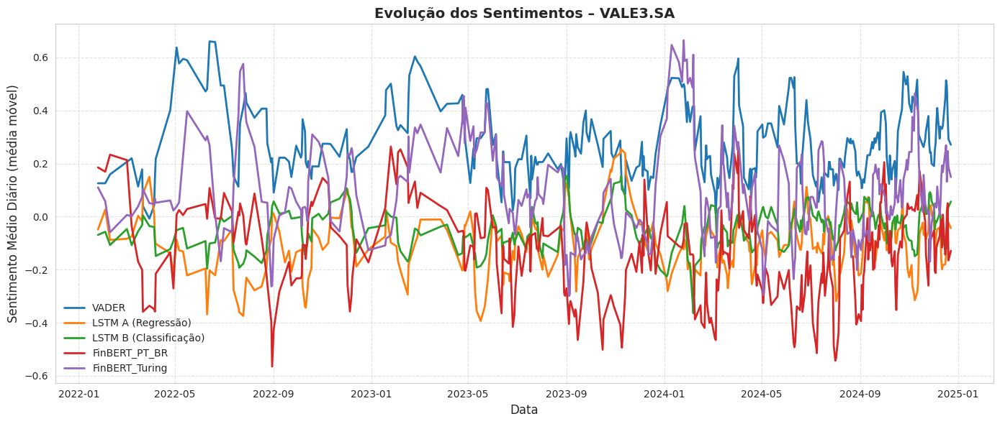

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

sns.set_style("whitegrid")
plt.rcParams.update({
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'lines.linewidth': 2,
    'grid.alpha': 0.6,
    'grid.linestyle': '--',
    'figure.figsize': (14, 6)
})

# Ativo em foco
ticker_exemplo = 'VALE3.SA'
df_exemplo = df_diario[df_diario['ticker'] == ticker_exemplo].copy()

# Define as colunas de sentimento existentes (e suas cores)
colunas_sentimentos = {
    'Modelo VADER': '#1f77b4',
    'Modelo LSTM A (Regressão)': '#ff7f0e',
    'Modelo LSTM B (Classificação)': '#2ca02c',
    'Modelo FinBERT_PT_BR': '#d62728',
    'Modelo FinBERT_Turing': '#9467bd'
}

# Aplica média móvel apenas para colunas que existem em df_exemplo
window = 5
for col, cor in colunas_sentimentos.items():
    if col in df_exemplo.columns:
        df_exemplo[col + '_smoothed'] = df_exemplo[col].rolling(window=window, center=True).mean()

# Ajusta dicionário para só manter colunas realmente existentes
colunas_presentes = {col + '_smoothed': cor for col, cor in colunas_sentimentos.items() if col + '_smoothed' in df_exemplo.columns}

# Criação da figura
fig, ax = plt.subplots()

for col, cor in colunas_presentes.items():
    # Legenda amigável
    legenda = col.replace('_smoothed', '').replace('Modelo ', '')
    ax.plot(df_exemplo['date'], df_exemplo[col], label=legenda, color=cor)

ax.set_title(f"Evolução dos Sentimentos – {ticker_exemplo}")
ax.set_xlabel("Data")
ax.set_ylabel("Sentimento Médio Diário (média móvel)")
ax.legend(frameon=False)
plt.tight_layout()
plt.show()



## Etapa 2: Execução da Estratégia Individual por Modelo de Sentimento

### Tentei incluir a estratégia de média móvel, mas não consegui.

Será realizada a simulação da estratégia para **cada coluna de sentimento** (`sentiment_lex`, `sentiment_LSTM`, etc.) **individualmente**. Como o intervalo de tempo da análise é curto (`2025-01-01` a `2025-05-04` ≈ 4 meses), utilizar **apenas a média móvel de 15 dias (SMA15)** pode limitar a responsividade da estratégia. Adotamos então variação da estratégia com múltiplas médias móveis:

| Nome      | Período | Finalidade                              |
| --------- | ------- | --------------------------------------- |
| **SMA5**  | 5 dias  | Curto prazo, mais sensível a reversões  |
| **SMA10** | 10 dias | Curto/médio prazo, menos ruído que SMA5 |
| **SMA15** | 15 dias | Referência padrão de tendência          |
| **SMA20** | 20 dias | Média mais "suave", evita sinais falsos |

---

### Estratégia por Média Móvel

Para cada uma dessas médias móveis, aplicaremos:

#### **Critério de Compra**

* > Compra: Δsentimento > 0.5 e Preço atual > média móvel (SMAx)
* > Venda: Δsentimento < -0.5 e Preço atual < média móvel (SMAx)


### Execuções planejadas

Para **cada modelo de sentimento** (`sentiment_lex`, `sentiment_LSTM`, etc.), a estratégia será executada **para cada média móvel separadamente**, totalizando:

```
5 modelos × 4 médias móveis = 20 simulações
```

Cada simulação terá:

* Valor inicial: R\$ 100.000
* Lote fixo: 100 ações
* Período: 2025-01-01 a 2025-05-04


#Coleta dos preços históricos com médias móveis

Código para coletar os preços históricos de fechamento via `yfinance`, calcular as médias móveis e deixar tudo pronto para cruzar com o DataFrame de sentimentos por ticker e data:

In [37]:
# IMPORTAÇÃO DE BIBLIOTECAS

import yfinance as yf
import pandas as pd
import os

from google.colab import data_table
data_table.enable_dataframe_formatter()


# PARÂMETROS DE CONFIGURAÇÃO

# Tickers brasileiros analisados
tickers = ['VALE3.SA', 'PETR4.SA', 'ITUB4.SA', 'BBAS3.SA']

# Intervalo de datas da análise
start = '2025-01-01'
end   = '2025-05-04'

# Diretório de saída
os.makedirs("data", exist_ok=True)

# MAPA DOS DIAS DA SEMANA EM PORTUGUÊS

dias_semana_pt = {
    'Monday': 'Segunda-feira',
    'Tuesday': 'Terça-feira',
    'Wednesday': 'Quarta-feira',
    'Thursday': 'Quinta-feira',
    'Friday': 'Sexta-feira',
    'Saturday': 'Sábado',
    'Sunday': 'Domingo'
}

# COLETA DOS DADOS HISTÓRICOS COM TRATAMENTO

dados_completos = []

for ticker in tickers:
    print(f" Coletando dados de: {ticker}")
    try:
        ticker_yf = yf.Ticker(ticker)
        dados = ticker_yf.history(start=start, end=end)

        # Validação: ignorar tickers com dados vazios
        if dados.empty:
            print(f" Dados indisponíveis para {ticker}, ignorado.")
            continue

        # Resetar índice (Date como coluna)
        dados = dados.reset_index()

        # Garantir consistência de datas e tipos
        dados['Date'] = pd.to_datetime(dados['Date'], errors='coerce')
        dados = dados.dropna(subset=['Date'])

        # Formatação de colunas auxiliares
        dados['Data'] = dados['Date'].dt.strftime('%Y-%m-%d')
        dados['Hora'] = dados['Date'].dt.strftime('%H:%M:%S')
        dados['Dia_da_semana'] = dados['Date'].dt.day_name().map(dias_semana_pt)
        dados['Ticker'] = ticker

        # Seleção e ordenação de colunas
        dados_formatado = dados[[
            'Data', 'Dia_da_semana', 'Open', 'High', 'Low', 'Close',
            'Volume', 'Dividends', 'Stock Splits', 'Ticker'
        ]]

        dados_completos.append(dados_formatado)
        print(f" {ticker}: {dados_formatado.shape[0]} registros coletados.")

    except Exception as e:
        print(f" Erro ao coletar dados de {ticker}: {e}")


# CONSOLIDAÇÃO E SALVAMENTO DOS RESULTADOS

if dados_completos:
    df_final = pd.concat(dados_completos, ignore_index=True)
    df_final = df_final.sort_values(by=['Ticker', 'Data'])

    # Caminhos de saída
    caminho_csv   = "data/ReturnData_2025.csv"
    caminho_excel = "data/ReturnData_2025.xlsx"

    # Salvamento em formatos compatíveis
    df_final.to_csv(caminho_csv, sep='|', index=False)
    df_final.to_excel(caminho_excel, index=False, engine='openpyxl')

    print(f"\n Arquivos salvos com sucesso:")
    print(f"  - CSV: {caminho_csv}")
    print(f"  - Excel: {caminho_excel}")

    # Exibição interativa no Colab
    display(data_table.DataTable(df_final))
else:
    print(" Nenhum dado foi coletado com sucesso.")

 Coletando dados de: VALE3.SA
 VALE3.SA: 82 registros coletados.
 Coletando dados de: PETR4.SA
 PETR4.SA: 82 registros coletados.
 Coletando dados de: ITUB4.SA
 ITUB4.SA: 82 registros coletados.
 Coletando dados de: BBAS3.SA
 BBAS3.SA: 82 registros coletados.

 Arquivos salvos com sucesso:
  - CSV: data/ReturnData_2025.csv
  - Excel: data/ReturnData_2025.xlsx


,Data,Dia_da_semana,Open,High,Low,Close,Volume,Dividends,Stock Splits,Ticker
246,2025-01-02,Quinta-feira,23.520860,23.627907,23.199723,23.277575,14492900,0.0,0.0,BBAS3.SA
247,2025-01-03,Sexta-feira,23.277575,23.413815,23.044021,23.102409,13778900,0.0,0.0,BBAS3.SA
248,2025-01-06,Segunda-feira,23.335963,23.404083,23.170529,23.316500,12112300,0.0,0.0,BBAS3.SA
249,2025-01-07,Terça-feira,23.491667,23.725221,23.374891,23.598713,15724400,0.0,0.0,BBAS3.SA
250,2025-01-08,Quarta-feira,23.579247,23.618174,23.306768,23.511127,16417000,0.0,0.0,BBAS3.SA
...,...,...,...,...,...,...,...,...,...,...
77,2025-04-25,Sexta-feira,54.500000,54.619999,53.639999,53.849998,26162200,0.0,0.0,VALE3.SA
78,2025-04-28,Segunda-feira,53.900002,54.180000,53.630001,54.040001,12001900,0.0,0.0,VALE3.SA
79,2025-04-29,Terça-feira,54.209999,54.340000,53.840000,53.840000,11816200,0.0,0.0,VALE3.SA
80,2025-04-30,Quarta-feira,52.599998,53.250000,52.209999,52.860001,18774400,0.0,0.0,VALE3.SA


In [39]:
print("Colunas disponíveis em df_diario:")
print(df_diario.columns.tolist())

Colunas disponíveis em df_diario:
['date', 'ticker', 'headline', 'summary', 'Modelo VADER', 'Modelo LSTM A (Regressão)', 'Modelo LSTM B (Classificação)', 'Modelo FinBERT_PT_BR', 'Modelo FinBERT_Turing']


In [40]:
print("Colunas disponíveis em dados_formatado:")
print(dados_formatado.columns.tolist())

Colunas disponíveis em dados_formatado:
['Data', 'Dia_da_semana', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', 'Ticker']


In [56]:
import pandas as pd
from datetime import date

# --- 1. Geração de todas as datas no intervalo ---
inicio = date(2025, 1, 1)
fim = date(2025, 5, 4)
todas_datas = pd.date_range(start=inicio, end=fim, freq='D').date

# --- 2. Renomeando colunas de dados_formatado para minúsculo ---
dados_formatado = dados_formatado.rename(columns={
    'Ticker': 'ticker',
    'Data': 'date'
    # Outras colunas permanecem como estão
})

# --- 3. Tickers disponíveis ---
tickers = dados_formatado['ticker'].unique().tolist()

# --- 4. Produto cartesiano: todos os dias para cada ticker ---
base_completa = pd.MultiIndex.from_product(
    [todas_datas, tickers],
    names=['date', 'ticker']
).to_frame(index=False)

# --- 5. Junção com base de preços ---
df_precos = dados_formatado.copy()
df_precos['date'] = pd.to_datetime(df_precos['date']).dt.date
merged_1 = pd.merge(base_completa, df_precos, how='left', on=['date', 'ticker'])

# --- 6. Junção com base de sentimentos ---
df_diario['date'] = pd.to_datetime(df_diario['date']).dt.date
merged_2 = pd.merge(merged_1, df_diario, how='left', on=['date', 'ticker'])

# --- 7. Atualização de Dia da Semana com nomes em português ---
dias_pt = {
    'Monday': 'Segunda-feira',
    'Tuesday': 'Terça-feira',
    'Wednesday': 'Quarta-feira',
    'Thursday': 'Quinta-feira',
    'Friday': 'Sexta-feira',
    'Saturday': 'Sábado',
    'Sunday': 'Domingo'
}
merged_2['Dia_da_semana'] = pd.to_datetime(merged_2['date']).dt.day_name().map(dias_pt)

# --- 8. Organização final ---
merged_2 = merged_2.sort_values(by=['ticker', 'date']).reset_index(drop=True)

# --- 9. Estatísticas ---
print("✅ Base unificada (preço + sentimento) criada com todas as datas.")
print(f"Total de linhas: {merged_2.shape[0]}")
print(f"Período coberto: {merged_2['date'].min()} até {merged_2['date'].max()}")
print(f"Colunas disponíveis: {merged_2.columns.tolist()}")

# --- 10. Visualização ---
display(merged_2.head(5))

# --- 11. Salvamento final ---
merged_2.to_csv("data/BaseCompleta_2025.csv", sep='|', index=False)
merged_2.to_excel("data/BaseCompleta_2025.xlsx", index=False)


✅ Base unificada (preço + sentimento) criada com todas as datas.
Total de linhas: 124
Período coberto: 2025-01-01 até 2025-05-04
Colunas disponíveis: ['date', 'ticker', 'Dia_da_semana', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', 'headline', 'summary', 'Modelo VADER', 'Modelo LSTM A (Regressão)', 'Modelo LSTM B (Classificação)', 'Modelo FinBERT_PT_BR', 'Modelo FinBERT_Turing']


,date,ticker,Dia_da_semana,Open,High,Low,Close,Volume,Dividends,Stock Splits,headline,summary,Modelo VADER,Modelo LSTM A (Regressão),Modelo LSTM B (Classificação),Modelo FinBERT_PT_BR,Modelo FinBERT_Turing
0,2025-01-01,BBAS3.SA,Quarta-feira,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2025-01-02,BBAS3.SA,Quinta-feira,23.520860,23.627907,23.199723,23.277575,14492900.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2025-01-03,BBAS3.SA,Sexta-feira,23.277575,23.413815,23.044021,23.102409,13778900.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2025-01-04,BBAS3.SA,Sábado,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2025-01-05,BBAS3.SA,Domingo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
print(df_diario.columns.tolist())


['date', 'ticker', 'headline', 'summary', 'Modelo VADER', 'Modelo LSTM A (Regressão)', 'Modelo LSTM B (Classificação)', 'Modelo FinBERT_PT_BR', 'Modelo FinBERT_Turing']


## 1. Coleta de Dados de Texto e Mercado
A primeira etapa consistiu na coleta automatizada de manchetes de notícias relacionadas a quatro ativos do mercado acionário brasileiro: VALE3.SA, PETR4.SA, ITUB4.SA e BBAS3.SA. A extração foi realizada por meio de requisições ao serviço RSS do Google News, utilizando expressões regulares parametrizadas com múltiplas formas de referência a cada ticker. O período considerado foi de 1º de janeiro de 2025 a 4 de maio de 2025, com segmentação mensal para respeitar limites de requisição e evitar sobrecarga nos servidores.

In [68]:
# === IMPORTAÇÃO DE BIBLIOTECAS ===
import requests
import pandas as pd
from bs4 import BeautifulSoup
from datetime import datetime
from dateutil.relativedelta import relativedelta

# === CONFIGURAÇÃO INICIAL ===
tickers_termos = {
    'VALE3.SA': ['VALE3', 'VALE3.SA', 'BVMF:VALE3'],
    'PETR4.SA': ['PETR4', 'PETR4.SA', 'BVMF:PETR4'],
    'ITUB4.SA': ['ITUB4', 'ITUB4.SA', 'BVMF:ITUB4'],
    'BBAS3.SA': ['BBAS3', 'BBAS3.SA', 'BVMF:BBAS3']
}

# Período de coleta
inicio = datetime.strptime('2025-01-01', '%Y-%m-%d')
fim    = datetime.strptime('2025-05-04', '%Y-%m-%d')

# === GERA INTERVALOS MENSAIS ENTRE DUAS DATAS ===
def gerar_periodos(start, end):
    periodos = []
    atual = start
    while atual < end:
        fim_mes = (atual + relativedelta(months=1)) - relativedelta(days=1)
        if fim_mes > end:
            fim_mes = end
        periodos.append((atual, fim_mes))
        atual = fim_mes + relativedelta(days=1)
    return periodos

# === COLETA DE NOTÍCIAS POR TICKER E PERÍODO ===
def coletar_noticias(ticker, termos, dt_ini, dt_fim):
    query = "(" + " OR ".join([f'"{t}"' if ' ' in t else t for t in termos]) + ")"
    url = (
        'https://news.google.com/rss/search'
        f'?q={query}+after:{dt_ini.strftime("%Y-%m-%d")}+before:{dt_fim.strftime("%Y-%m-%d")}'
        '&hl=pt-BR&gl=BR&ceid=BR:pt-419'
    )

    noticias = []
    try:
        resp = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=10)
        soup = BeautifulSoup(resp.content, 'xml')

        for item in soup.find_all('item'):
            pub_str = item.pubDate.text.replace(' GMT', ' +0000')
            pub = datetime.strptime(pub_str, '%a, %d %b %Y %H:%M:%S %z').replace(tzinfo=None)

            if not (dt_ini <= pub.replace(hour=0, minute=0, second=0) <= dt_fim):
                continue

            titulo = item.title.text
            link = item.link.text
            resumo = BeautifulSoup(item.description.text, 'html.parser').get_text()

            if any(term.lower() in (titulo + " " + resumo).lower() for term in termos):
                noticias.append({
                    'ticker': ticker,
                    'date': pub.strftime('%Y-%m-%d'),
                    'time': pub.strftime('%H:%M'),
                    'headline': titulo,
                    'summary': resumo,
                    'source': 'Google News RSS',
                    'url': link,
                    'language': 'pt',
                    'scraped_at': datetime.utcnow().strftime('%Y-%m-%d %H:%M:%S')
                })
    except Exception as e:
        print(f"[ERRO] {ticker} ({dt_ini.date()} a {dt_fim.date()}): {e}")
    return noticias

# === EXECUÇÃO DA COLETA ===
periodos = gerar_periodos(inicio, fim)
noticias_lista = []

print("Iniciando coleta de notícias...")
for ticker, termos in tickers_termos.items():
    print(f"Coletando para: {ticker}...")
    for dt_ini, dt_fim in periodos:
        noticias_lista.extend(coletar_noticias(ticker, termos, dt_ini, dt_fim))
print("Coleta finalizada.")

# === CRIAÇÃO E VISUALIZAÇÃO DO DATAFRAME PADRÃO ===
if noticias_lista:
    print("\nCriando DataFrame com os dados coletados...")
    df_noticias_diarias = pd.DataFrame(noticias_lista)

    df_noticias_diarias['date'] = pd.to_datetime(df_noticias_diarias['date']).dt.date
    # Mantém as principais colunas para o modelo realista
    df_noticias_diarias = df_noticias_diarias[['date', 'time', 'ticker', 'headline', 'summary']].dropna()

    print(f"\n[✔️] Total de registros carregados: {len(df_noticias_diarias)}")
    print("Amostra dos dados:")
    print(df_noticias_diarias.head())

    # NOVO: CONTAGEM POR ATIVO
    print("\n" + "="*40)
    print("   Contagem de Notícias por Ativo")
    print("="*40)
    contagem_por_ativo = df_noticias_diarias['ticker'].value_counts()
    print(contagem_por_ativo.to_string())
    print("="*40)

else:
    print("\nNenhuma notícia foi encontrada para os critérios definidos.")


Iniciando coleta de notícias...
Coletando para: VALE3.SA...
Coletando para: PETR4.SA...
Coletando para: ITUB4.SA...
Coletando para: BBAS3.SA...
Coleta finalizada.

Criando DataFrame com os dados coletados...

[✔️] Total de registros carregados: 1400
Amostra dos dados:
         date   time    ticker  \
0  2025-01-06  08:00  VALE3.SA   
1  2025-01-28  08:00  VALE3.SA   
2  2025-01-30  08:00  VALE3.SA   
3  2025-01-29  08:00  VALE3.SA   
4  2025-01-28  08:00  VALE3.SA   

                                            headline  \
0  O que fazer com as ações da Vale (VALE3), no m...   
1  Ibovespa fecha no vermelho, acompanhando forte...   
2  Ibovespa vai às máximas com disparada de ações...   
3  Vale (VALE3) teve prévia neutra, dizem especia...   
4  Tempo real: Ibovespa fecha em queda puxada por...   

                                             summary  
0  O que fazer com as ações da Vale (VALE3), no m...  
1  Ibovespa fecha no vermelho, acompanhando forte...  
2  Ibovespa vai às máxim

In [70]:
from transformers import pipeline

def calcular_polaridade_continua(model_id, n_classes, textos):
    """
    Aplica modelo Hugging Face e transforma saída de classificação em valor contínuo entre -1 e +1.
    """
    # Define pipeline de sentimento com saída de probabilidade por classe
    classifier = pipeline("text-classification", model=model_id, return_all_scores=True, truncation=True)

    resultados = []

    for texto in tqdm(textos, desc=f"Analisando com {model_id}"):
        try:
            # Obtém as probabilidades para cada classe
            scores = classifier(str(texto))[0]

            # Mapeia classes padrão: assume 3 classes [NEG, NEU, POS]
            if n_classes == 3:
                probs = {s['label'].lower(): s['score'] for s in scores}

                # Normaliza nomes típicos de labels para consistência
                neg = next((v for k, v in probs.items() if 'neg' in k), 0)
                neu = next((v for k, v in probs.items() if 'neu' in k), 0)
                pos = next((v for k, v in probs.items() if 'pos' in k), 0)

                # Calcula escore contínuo: -1*neg + 0*neu + 1*pos = pos - neg
                score = pos - neg
            else:
                raise ValueError("Modelo com número de classes diferente de 3 não suportado.")

        except Exception as e:
            print(f"[ERRO interno] Texto: {texto[:50]}... -> {e}")
            score = 0.0  # fallback neutro

        resultados.append(score)

    return resultados


In [74]:
# --- Importações ---
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer # Para o Tokenizer do LSTM (se necessário carregar)
from sklearn.preprocessing import MinMaxScaler

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords

import json
import warnings
import os
import re
import spacy
import torch
import torch.nn.functional as F
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from tqdm.notebook import tqdm # Para barras de progresso no Jupyter/Colab
import pickle # Para carregar tokenizer e scaler

from datetime import datetime
from dateutil.relativedelta import relativedelta
import requests
from bs4 import BeautifulSoup

warnings.filterwarnings("ignore")

# --- Baixar recursos NLTK (VADER e Stopwords) ---
try:
    nltk.data.find('sentiment/vader_lexicon.zip')
except nltk.downloader.DownloadError:
    nltk.download('vader_lexicon')
    print("Léxico VADER baixado.")

try:
    nltk.data.find('corpora/stopwords')
except nltk.downloader.DownloadError:
    nltk.download('stopwords')
    print("Stopwords do NLTK baixadas.")
stopwords_pt = set(nltk.corpus.stopwords.words('portuguese'))

# --- Carregar Modelos SpaCy para Lematização e NER ---
try:
    nlp_pt_lemmatizer = spacy.load("pt_core_news_lg", disable=['parser', 'ner']) # Para lematização
    nlp_pt_ner = spacy.load("pt_core_news_lg") # Para NER completo, se precisar
    print("Modelos 'pt_core_news_lg' carregados para lematização e NER.")
except OSError:
    print("\nModelo 'pt_core_news_lg' não encontrado. Lematização e NER serão pulados.")
    nlp_pt_lemmatizer = None
    nlp_pt_ner = None

# --- Variáveis de Ambiente e Configuração TensorFlow ---
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# ===============================================================
# DEFINIÇÃO DE FUNÇÕES AUXILIARES (PARA COLETA E SENTIMENTO)
# ===============================================================

# --- Função para gerar períodos mensais (para coleta) ---
def gerar_periodos(start, end):
    periodos = []
    atual = start
    while atual < end:
        fim_mes = (atual + relativedelta(months=1)) - relativedelta(days=1)
        if fim_mes > end:
            fim_mes = end
        periodos.append((atual, fim_mes))
        atual = fim_mes + relativedelta(days=1)
    return periodos

# --- Função para coletar notícias (Google RSS) ---
def coletar_noticias(ticker, termos, dt_ini, dt_fim):
    query = "(" + " OR ".join([f'"{t}"' if ' ' in t else t for t in termos]) + ")"
    url = (
        'https://news.google.com/rss/search'
        f'?q={query}+after:{dt_ini.strftime("%Y-%m-%d")}+before:{dt_fim.strftime("%Y-%m-%d")}'
        '&hl=pt-BR&gl=BR&ceid=BR:pt-419'
    )
    noticias = []
    try:
        resp = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=10)
        soup = BeautifulSoup(resp.content, 'xml')

        for item in soup.find_all('item'):
            pub_str = item.pubDate.text.replace(' GMT', ' +0000') # Trata fusos GMT
            pub = datetime.strptime(pub_str, '%a, %d %b %Y %H:%M:%S %z').replace(tzinfo=None) # Remove tzinfo
            if not (dt_ini.date() <= pub.date() <= dt_fim.date()): # Compara apenas as datas
                continue
            titulo = item.title.text
            resumo = BeautifulSoup(item.description.text, 'html.parser').get_text()
            if any(term.lower() in (titulo + " " + resumo).lower() for term in termos):
                noticias.append({
                    'ticker': ticker,
                    'date': pub.strftime('%Y-%m-%d'),
                    'time': pub.strftime('%H:%M'),
                    'headline': titulo,
                    'summary': resumo
                })
    except Exception as e:
        print(f"[ERRO] Coleta para {ticker} ({dt_ini.date()} a {dt_fim.date()}): {e}")
    return noticias

# --- Função de Pré-processamento de Texto (com lematização) ---
def clean_text_and_lemmatize(text, nlp_model=nlp_pt_lemmatizer):
    text = str(text).lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'[^a-záàâãéêíóôõúüç\s]', '', text)

    if nlp_model and text.strip():
        doc = nlp_model(text)
        cleaned_tokens = [token.lemma_ for token in doc if token.text not in stopwords_pt and not token.is_punct]
        text = ' '.join(cleaned_tokens)
    else:
        text = ' '.join(word for word in text.split() if word not in stopwords_pt and word.strip())
    return text.strip()

# --- Função para calcular polaridade contínua de modelos Hugging Face (FinBERT) ---
def calcular_polaridade_continua(
    model_id: str,
    n_classes: int,
    textos: pd.Series
) -> pd.Series:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    hf_token = os.environ.get("HF_TOKEN")
    if not hf_token:
        try:
            from google.colab import userdata
            hf_token = userdata.get('HF_TOKEN')
            os.environ['HF_TOKEN'] = hf_token
            print("HF_TOKEN carregado dos secrets do Colab.")
        except Exception:
            print("Aviso: HF_TOKEN não encontrado. Alguns modelos podem não carregar se forem privados ou muito requisitados.")

    tokenizer_hf = AutoTokenizer.from_pretrained(model_id, use_auth_token=hf_token)
    model_hf = (AutoModelForSequenceClassification
             .from_pretrained(model_id, use_auth_token=hf_token)
             .to(device))
    model_hf.eval()

    tqdm.pandas(desc=f"Pontuando com {model_id.split('/')[-1]}")

    def pontuar(texto: str) -> float:
        if pd.isna(texto) or not texto.strip():
            return np.nan

        inputs = tokenizer_hf(
            texto,
            return_tensors="pt",
            truncation=True,
            padding="max_length",
            max_length=512
        ).to(device)
        with torch.no_grad():
            logits = model_hf(**inputs).logits
        probs = F.softmax(logits, dim=1).squeeze().cpu().numpy()

        if n_classes == 3: # Ordem esperada: [NEG, NEU, POS]
            return float(probs[2]*1 + probs[1]*0 + probs[0]*-1)
        elif n_classes == 2: # Ordem esperada: [NEG, POS]
            return float(probs[1]*1 + probs[0]*-1)
        else:
            return np.nan

    return textos.progress_apply(pontuar)


# ========================================
# === 1. COLETA DE NOTÍCIAS (2025)    ===
# ========================================

# Configuração dos tickers e termos
tickers_termos = {
        'VALE3.SA': ['VALE3', 'VALE3.SA', 'BVMF:VALE3'],
    'PETR4.SA': ['PETR4', 'PETR4.SA', 'BVMF:PETR4'],
    'ITUB4.SA': ['ITUB4', 'ITUB4.SA', 'BVMF:ITUB4'],
    'BBAS3.SA': ['BBAS3', 'BBAS3.SA', 'BVMF:BBAS3']
}

inicio_coleta = datetime.strptime('2025-01-01', '%Y-%m-%d')
fim_coleta = datetime.strptime('2025-05-04', '%Y-%m-%d')

periodos_coleta = gerar_periodos(inicio_coleta, fim_coleta)
noticias_lista_2025 = []
for ticker, termos in tickers_termos.items():
    for dt_ini, dt_fim in periodos_coleta:
        noticias_lista_2025.extend(coletar_noticias(ticker, termos, dt_ini, dt_fim))

if not noticias_lista_2025:
    print("Nenhuma notícia encontrada para os critérios definidos em 2025. O script pode não gerar resultados de sentimento.")
    df_diario = pd.DataFrame(columns=['date', 'time', 'ticker', 'headline', 'summary'])
else:
    df_diario = pd.DataFrame(noticias_lista_2025)
    df_diario['date'] = pd.to_datetime(df_diario['date']).dt.date
    df_diario = df_diario[['date', 'time', 'ticker', 'headline', 'summary']].dropna().reset_index(drop=True)
    print(f"\n[✔️] DataFrame de notícias de 2025 ('df_diario') gerado com {df_diario.shape[0]} notícias.")

# ==============================================
# === 2. APLICAÇÃO DOS MODELOS TREINADOS    ====
# ==============================================

if not df_diario.empty:
    # --- PRÉ-PROCESSAMENTO DE TEXTO (headline_clean) ---
    print("\nAplicando pré-processamento de texto (limpeza e lematização) nas manchetes...")
    tqdm.pandas(desc="Lematizando manchetes")
    df_diario["headline_clean"] = df_diario["headline"].progress_apply(
        lambda x: clean_text_and_lemmatize(x, nlp_pt_lemmatizer)
    )
    df_diario = df_diario[
        df_diario['headline_clean'].str.strip() != ''
    ].copy().reset_index(drop=True)
    print(f"Manchetes limpas e lematizadas. Total de registros restantes: {df_diario.shape[0]}")

    # --- Aplicação da Coluna 'entities' (NER) ---
    # Para aplicar NER, nlp_pt_ner precisa estar carregado com componentes de NER (não disable)
    if 'entities' not in df_diario.columns and nlp_pt_ner: # Usar nlp_pt_ner para NER
        print("\nGerando coluna 'entities' com spaCy NER (se 'summary' disponível)...")
        def extract_entities_for_df(text, nlp_model_pt_for_ner):
            if pd.isna(text) or nlp_model_pt_for_ner is None: return []
            doc = nlp_model_pt_for_ner(text) # Usa o modelo para NER (nlp_pt_ner)
            entities = []
            for ent in doc.ents: entities.append({'text': ent.text, 'label': ent.label_})
            return entities
        if 'summary' in df_diario.columns and not df_diario['summary'].empty:
            df_diario['entities'] = df_diario['summary'].apply(lambda x: extract_entities_for_df(x, nlp_pt_ner))
            print("Coluna 'entities' criada/atualizada com sucesso.")
        else:
            print("Coluna 'entities' não gerada: 'summary' não disponível ou vazia.")
    elif 'entities' in df_diario.columns:
        print("\nColuna 'entities' já existe na base de dados.")
    else:
        print("\nColuna 'entities' não será gerada (spaCy NER não carregado ou 'summary' ausente/vazia).")


    # ===============================================================
    # 2.1. MODELO VADER (Customizado)
    # ===============================================================
    print("\n--- Aplicando Modelo VADER (Customizado) ---")
    sia_custom = SentimentIntensityAnalyzer()

    caminho_termos_json = "dados/termos.json"
    try:
        with open(caminho_termos_json, encoding='utf-8') as f:
            termos_do_arquivo = json.load(f)
        print(f"Léxico customizado carregado de '{caminho_termos_json}'.")

        if isinstance(termos_do_arquivo, list) and len(termos_do_arquivo) == 1 and isinstance(termos_do_arquivo[0], list):
            termos_do_arquivo = termos_do_arquivo[0]
            print("Estrutura do léxico ajustada (desaninhamento de lista).")

    except FileNotFoundError:
        print(f"Erro: O arquivo '{caminho_termos_json}' não foi encontrado. VADER customizado não será aplicado.")
        termos_do_arquivo = []
    except json.JSONDecodeError:
        print(f"Erro: O arquivo '{caminho_termos_json}' contém JSON inválido. VADER customizado não será aplicado.")
        termos_do_arquivo = []

    if termos_do_arquivo:
        lexicon_data_filtered = []
        for item in termos_do_arquivo:
            if isinstance(item, dict) and 'termo' in item and 'polaridade' in item:
                lexicon_data_filtered.append({'termo': item['termo'], 'polaridade': item['polaridade']})

        df_lexico = pd.DataFrame(lexicon_data_filtered)

        if not df_lexico.empty and 'termo' in df_lexico.columns:
            df_lexico = df_lexico.drop_duplicates(subset="termo")
            df_lexico['termo'] = df_lexico['termo'].str.lower()
            lexico_customizado_dict = dict(zip(df_lexico['termo'], df_lexico['polaridade']))

            pos_values = [v for v in lexico_customizado_dict.values() if v > 0]
            neg_values = [v for v in lexico_customizado_dict.values() if v < 0]
            max_pos = max(pos_values, default=1) if pos_values else 1
            min_neg = min(neg_values, default=-1) if neg_values else -1

            lexico_ajustado = {
                termo: (valor / max_pos * 4 if valor > 0 and max_pos != 0 else \
                        (valor / abs(min_neg) * -4 if valor < 0 and min_neg != 0 else valor))
                for termo, valor in lexico_customizado_dict.items()
            }
            sia_custom.lexicon.update(lexico_ajustado)
            print("Léxico VADER customizado aplicado ao analisador VADER.")
        else:
            print("Atenção: DataFrame de léxico vazio ou sem 'termo'. VADER usará apenas léxico padrão.")
    else:
        print("Atenção: Nenhum léxico customizado carregado. VADER usará apenas léxico padrão.")

    df_diario['Modelo VADER'] = df_diario['headline'].apply(
        lambda x: sia_custom.polarity_scores(str(x))['compound']
    )
    print("Coluna 'Modelo VADER' criada.")

    # ===============================================================
    # 2.2. MODELOS LSTM SUPERVISIONADOS (Regressão e Classificação)
    # ===============================================================
    print("\n--- Aplicando Modelos LSTM Supervisionados (Regressão e Classificação) ---")

    path_model_A_lstm = "AnáliseSentimento_A_LSTM.keras"
    path_tokenizer_A_lstm = "preprocessors/tokenizer_A.pkl"
    path_scaler_A_lstm = "preprocessors/scaler_A.pkl"

    path_model_B_lstm = "AnáliseSentimento_B_LSTM.keras" # Modelo de Classificação B

    try:
        # Carregar Modelo A (Regressão)
        model_A_lstm = tf.keras.models.load_model(path_model_A_lstm)
        with open(path_tokenizer_A_lstm, 'rb') as f:
            tokenizer_lstm = pickle.load(f)
        with open(path_scaler_A_lstm, 'rb') as f:
            scaler_A_lstm = pickle.load(f)
        print(f"Modelo LSTM A (Regressão), tokenizer e scaler carregados.")

        # Carregar Modelo B (Classificação)
        model_B_lstm = tf.keras.models.load_model(path_model_B_lstm)
        print(f"Modelo LSTM B (Classificação) carregado.")

        # Hiperparâmetro max_len do modelo LSTM (precisa ser consistente com o treino)
        lstm_input_length = 100 # CONFORME AJUSTADO E CONCORDADO PARA O MODELO SALVO

        # Preparar dados para ambos os LSTMs
        sequences_lstm = tokenizer_lstm.texts_to_sequences(df_diario["headline_clean"].astype(str))
        X_seq_lstm = pad_sequences(sequences_lstm, maxlen=lstm_input_length, padding='post', truncating='post')

        # --- Aplicação Modelo A (Regressão) ---
        y_pred_scaled_A_lstm = model_A_lstm.predict(X_seq_lstm, verbose=0)

        # Normalizar a saída do LSTM A para [-1, 1]
        scaler_A_for_sentiment_range = MinMaxScaler(feature_range=(-1, 1))
        df_diario['Modelo LSTM A (Regressão)'] = scaler_A_for_sentiment_range.fit_transform(
            y_pred_scaled_A_lstm # Aplica diretamente na saída escalonada do modelo
        ).flatten()
        print("Coluna 'Modelo LSTM A (Regressão)' (LSTM Regressão normalizado para [-1,1]) criada.")

        # --- Aplicação Modelo B (Classificação) ---
        y_pred_prob_B_lstm = model_B_lstm.predict(X_seq_lstm, verbose=0)

        # Mapeamento das classes para uma pontuação contínua [-1, 1]
        class_scores_map_B = np.array([-1.0, -0.5, 0.0, 0.5, 1.0])
        df_diario['Modelo LSTM B (Classificação)'] = np.dot(y_pred_prob_B_lstm, class_scores_map_B)
        print("Coluna 'Modelo LSTM B (Classificação)' (LSTM Classificação normalizado para [-1,1]) criada.")

    except FileNotFoundError as e:
        print(f"Erro ao carregar artefatos do LSTM: {e}. Os modelos LSTM supervisionados não serão aplicados.")
    except Exception as e:
        print(f"Erro inesperado ao aplicar modelos LSTM: {e}. Os modelos LSTM supervisionados não serão aplicados.")


    # ===============================================================
    # 2.3. MODELOS FINBERT-PT-BR (Hugging Face Transformers)
    # ===============================================================
    print("\n--- Aplicando Modelos FinBERT-PT-BR ---")

    modelos_finbert = {
        "FinBERT_PT_BR": {
            "repo": "lucas-leme/FinBERT-PT-BR",
            "n_classes": 3, # [NEG, NEU, POS]
            "inverter_escala": True
        },
        "FinBERT_Turing": {
            "repo": "turing-usp/FinBertPTBR", # Corrigido para modelo em português
            "n_classes": 3, # [NEG, NEU, POS]
            "inverter_escala": True
        }
    }

    hf_token = os.environ.get("HF_TOKEN")
    if not hf_token:
        try:
            from google.colab import userdata
            hf_token = userdata.get('HF_TOKEN')
            os.environ['HF_TOKEN'] = hf_token
            print("HF_TOKEN carregado dos secrets do Colab.")
        except Exception:
            print("Aviso: HF_TOKEN não encontrado. Alguns modelos FinBERT podem falhar se forem privados ou muito requisitados.")

    for nome, cfg in modelos_finbert.items():
        try:
            print(f"Aplicando modelo {nome}...")
            coluna_saida = f"Modelo {nome}"
            valores = calcular_polaridade_continua(
                model_id=cfg["repo"],
                n_classes=cfg["n_classes"],
                textos=df_diario["headline"]
            )

            if cfg.get("inverter_escala", False):
                valores = [-1 * v for v in valores]

            df_diario[coluna_saida] = valores
            print(f"Coluna '{coluna_saida}' criada.")

        except Exception as e:
            print(f"[ERRO] Falha ao aplicar modelo {nome}: {e}")
            df_diario[f"Modelo {nome}"] = np.nan # Garante que a coluna com o novo nome seja criada em caso de erro


# ===============================================================
# === 3. AGREGAÇÃO DIÁRIA POR MODELO E SALVAMENTO ============================
# ===============================================================
if not df_diario.empty:
    modelos_sentimento_aplicados = [
        'Modelo VADER',
        'Modelo LSTM A (Regressão)',
        'Modelo LSTM B (Classificação)',
        'Modelo FinBERT_PT_BR',
        'Modelo FinBERT_Turing'
    ]

    # Garante que apenas as colunas existentes sejam usadas para agregação
    modelos_sentimento_existentes = [col for col in modelos_sentimento_aplicados if col in df_diario.columns]

    if not modelos_sentimento_existentes:
        print("\n⚠️ Nenhuma coluna de sentimento criada para agregação. df_sent_diario não será gerado.")
    else:
        print("\n--- Agregando sentimentos por dia e ticker (média) ---")
        df_sent_diario = (
            df_diario
            .groupby(['date', 'ticker'])
            .agg(
                headline=('headline', 'first'), # Pega a primeira manchete do dia
                summary=('summary', 'first'),   # Pega o primeiro resumo do dia
                **{col: (col, 'mean') for col in modelos_sentimento_existentes} # Média para os sentimentos
            )
            .sort_index()
            .reset_index()
        )

        print(f"\n[✔️] df_sent_diario gerado com {df_sent_diario.shape[0]} linhas e {df_sent_diario.shape[1]} colunas.")
        print("\nTabela diária de sentimento médio por modelo (primeiras 10 linhas):")
        print(df_sent_diario.head(10))

        # ===============================================================
        # === 4. SALVA TABELA FINAL DE SENTIMENTO DIÁRIO ===============
        # ===============================================================
        os.makedirs("data", exist_ok=True)
        ticker_para_salvar = list(tickers_termos.keys())[0] if tickers_termos else "todos" # Pega o primeiro ticker ou "todos"
        df_sent_diario.to_csv("data/Sentimento_Diario_{}.csv".format(ticker_para_salvar.replace('.SA', '')), index=False, sep='|')
        df_sent_diario.to_excel("data/Sentimento_Diario_{}.xlsx".format(ticker_para_salvar.replace('.SA', '')), index=False)
        print(f"\n[✔️] Tabela de sentimento diário salva em 'data/Sentimento_Diario_{ticker_para_salvar.replace('.SA', '')}.csv/xlsx'.")
else:
    print("\nDataFrame de notícias ('df_diario') vazio. Não é possível aplicar modelos ou agregar sentimentos.")

Modelos 'pt_core_news_lg' carregados para lematização e NER.

[✔️] DataFrame de notícias de 2025 ('df_diario') gerado com 1399 notícias.

Aplicando pré-processamento de texto (limpeza e lematização) nas manchetes...


Lematizando manchetes:   0%|          | 0/1399 [00:00<?, ?it/s]

Manchetes limpas e lematizadas. Total de registros restantes: 1399

Gerando coluna 'entities' com spaCy NER (se 'summary' disponível)...
Coluna 'entities' criada/atualizada com sucesso.

--- Aplicando Modelo VADER (Customizado) ---
Léxico customizado carregado de 'dados/termos.json'.
Estrutura do léxico ajustada (desaninhamento de lista).
Léxico VADER customizado aplicado ao analisador VADER.
Coluna 'Modelo VADER' criada.

--- Aplicando Modelos LSTM Supervisionados (Regressão e Classificação) ---
Modelo LSTM A (Regressão), tokenizer e scaler carregados.
Modelo LSTM B (Classificação) carregado.
Coluna 'Modelo LSTM A (Regressão)' (LSTM Regressão normalizado para [-1,1]) criada.
Coluna 'Modelo LSTM B (Classificação)' (LSTM Classificação normalizado para [-1,1]) criada.

--- Aplicando Modelos FinBERT-PT-BR ---
Aplicando modelo FinBERT_PT_BR...


Pontuando com FinBERT-PT-BR:   0%|          | 0/1399 [00:00<?, ?it/s]

Coluna 'Modelo FinBERT_PT_BR' criada.
Aplicando modelo FinBERT_Turing...


Pontuando com FinBertPTBR:   0%|          | 0/1399 [00:00<?, ?it/s]

Coluna 'Modelo FinBERT_Turing' criada.

--- Agregando sentimentos por dia e ticker (média) ---

[✔️] df_sent_diario gerado com 388 linhas e 9 colunas.

Tabela diária de sentimento médio por modelo (primeiras 10 linhas):
         date    ticker                                           headline  \
0  2025-01-01  BBAS3.SA  Ações em Foco: PETR4, ITUB4, VALE3, SANB11, NU...   
1  2025-01-01  ITUB4.SA  Ações em Foco: PETR4, ITUB4, VALE3, SANB11, NU...   
2  2025-01-02  BBAS3.SA  BBAS3, ITUB4, SANB11 e BBDC4: Na bolsa, bancos...   
3  2025-01-02  ITUB4.SA  Petrobras (PETR4), Itaú (ITUB4) e mais 8: Veja...   
4  2025-01-02  PETR4.SA  Petrobras (PETR4) sobe 6,9% em 2024; vale a pe...   
5  2025-01-02  VALE3.SA  Vale (VALE3): O que esperar da ação em 2025 ap...   
6  2025-01-03  BBAS3.SA  Banco do Brasil (BBAS3): após a queda de 6,5% ...   
7  2025-01-03  ITUB4.SA  Ações em Foco: PETR4, ITUB4, VALE3, SANB11, NU...   
8  2025-01-03  VALE3.SA  Ibovespa engata mais um queda com Vale (VALE3)...   


Carregamento e Consolidação dos Arquivos de Notícias

In [4]:
import pandas as pd
import numpy as np
import yfinance as yf # Importado, mas será substituído se você usar CSVs
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
from collections import defaultdict

# ===============================================================
# === 0. CONFIGURAÇÃO INICIAL E PARÂMETROS ===
# ===============================================================
ticker = 'VALE3.SA' # Ativo principal para o backtest
modelos_sentimento = [
    'Modelo VADER',
    'Modelo LSTM A (Regressão)',
    'Modelo LSTM B (Classificação)',
    'Modelo FinBERT_PT_BR',
    'Modelo FinBERT_Turing',
    'sentiment_random'  # benchmark aleatório
]
capital_inicial = 100_000
taxa_b3 = 0.0003  # 0,03% (custo de transação por operação)

# === CARREGAMENTO DOS SENTIMENTOS DIÁRIOS AGREGADOS ===
caminho_df_sent_diario = f"data/Sentimento_Diario_{ticker.replace('.SA', '')}.csv"
try:
    df_diario = pd.read_csv(caminho_df_sent_diario, sep='|', parse_dates=['date'])
    print(f"[✔️] Sentimentos diários agregados carregados de: {caminho_df_sent_diario}")
except FileNotFoundError as e:
    print(f"Erro: Arquivo de sentimentos diários não encontrado para o backtest: {e}")
    print("Certifique-se de que o script de 'Coleta de Notícias e Aplicação de Modelos de Sentimento' foi executado e salvou este arquivo.")
    exit()

# === DEFINIÇÃO DO PERÍODO DO BACKTEST (baseado nas datas dos sentimentos) ===
datas_validas = df_diario[df_diario['ticker'] == ticker]['date'].dropna()
if datas_validas.empty:
    print(f"Erro: Não há datas de sentimento válidas para o ticker {ticker} em df_diario. Verifique os dados.")
    exit()

inicio_backtest = pd.to_datetime(datas_validas.min()).strftime('%Y-%m-%d')
fim_backtest    = pd.to_datetime(datas_validas.max()).strftime('%Y-%m-%d')
print(f"📅 Período do Backtest: {inicio_backtest} a {fim_backtest}")

# ===============================================================
# === DOWNLOAD / CARREGAMENTO DE PREÇOS HISTÓRICOS ===
# ATENÇÃO: SUBSTITUA O pd.read_csv ABAIXO PELO yf.download SE TIVER YFINANCE FUNCIONANDO,
# OU AJUSTE O CAMINHO DOS ARQUIVOS CSV LOCAIS.
# ===============================================================

# --- 1. Preços do Ativo Principal (VALE3.SA, PETR4.SA, etc.) ---
try:
    # Opção A: Usar yfinance (se instalado e funcionando no seu ambiente)
    # print(f"\nBaixando dados de preço para {ticker} via yfinance...")
    # df_price = yf.download(ticker, start=inicio_backtest, end=fim_backtest, progress=False)

    # Opção B: Carregar de um arquivo CSV local (RECOMENDADO PARA EVITAR DEPENDÊNCIAS DE DOWNLOADS)
    caminho_csv_vale3 = f"dados/{ticker.replace('.SA', '')}_2025_precos.csv" # Mude este caminho para o seu arquivo CSV
    print(f"\nCarregando dados de preço para {ticker} de {caminho_csv_vale3}...")
    df_price = pd.read_csv(caminho_csv_vale3, sep=',', parse_dates=['Date']) # Ajuste sep se necessário

    if isinstance(df_price.columns, pd.MultiIndex):
        df_price.columns = ['_'.join(col).strip() if col[1] else col[0] for col in df_price.columns]
    df_price = df_price.reset_index(drop=True if 'index' in df_price.columns else False) # Ajuste para reset_index
    df_price['date'] = pd.to_datetime(df_price['Date']).dt.date
    col_close = 'Close' # Assumindo que seu CSV tem uma coluna 'Close'
    if col_close not in df_price.columns:
        col_close = 'Adj Close' # Alternativa comum para coluna de fechamento
    if col_close not in df_price.columns:
        raise Exception(f"Coluna 'Close' ou 'Adj Close' não encontrada no CSV de preços de {ticker}.")
    df_price['close'] = df_price[col_close]

    if df_price.empty: raise Exception(f"Dados de preço vazios para {ticker} no CSV.")
    print(f"[✔️] Dados de preço para {ticker} carregados com sucesso de CSV.")
except Exception as e:
    print(f"Erro ao carregar/baixar dados de preço para {ticker}: {e}.")
    print(">>> VERIFIQUE: Se você está usando yfinance, ele está instalado? Se está usando CSV, o caminho está correto e o arquivo tem as colunas 'Date' e 'Close'?")
    exit()

# --- 2. Preços do IBOVESPA (Benchmark) ---
ibov_ticker = '^BVSP'
try:
    # Opção A: Usar yfinance
    # print(f"Baixando dados de preço para {ibov_ticker} via yfinance...")
    # df_ibov = yf.download(ibov_ticker, start=inicio_backtest, end=fim_backtest, progress=False)

    # Opção B: Carregar de um arquivo CSV local (RECOMENDADO)
    caminho_csv_ibov = "dados/IBOV_2025_precos.csv" # Mude este caminho para o seu arquivo CSV
    print(f"Carregando dados de preço para {ibov_ticker} de {caminho_csv_ibov}...")
    df_ibov = pd.read_csv(caminho_csv_ibov, sep=',', parse_dates=['Date']) # Ajuste sep se necessário

    df_ibov = df_ibov.reset_index(drop=True if 'index' in df_ibov.columns else False)
    df_ibov['date'] = pd.to_datetime(df_ibov['Date']).dt.date
    col_close_ibov = 'Close' # Assumindo seu CSV tem 'Close'
    if col_close_ibov not in df_ibov.columns:
        col_close_ibov = 'Adj Close'
    if col_close_ibov not in df_ibov.columns:
        raise Exception(f"Coluna 'Close' ou 'Adj Close' não encontrada no CSV de preços de {ibov_ticker}.")
    df_ibov['close'] = df_ibov[col_close_ibov]

    if df_ibov.empty: raise Exception(f"Dados de preço vazios para {ibov_ticker} no CSV.")
    print(f"[✔️] Dados de preço para {ibov_ticker} carregados com sucesso de CSV.")
except Exception as e:
    print(f"Erro ao carregar/baixar dados de preço para {ibov_ticker}: {e}.")
    print(">>> VERIFIQUE: Se você está usando yfinance, ele está instalado? Se está usando CSV, o caminho está correto e o arquivo tem as colunas 'Date' e 'Close'?")
    exit()

# === PREPARAÇÃO DOS BENCHMARKS BUY AND HOLD ===
if not df_price.empty:
    ticker_inicio_preco = df_price.iloc[0]['close']
    df_price['capital_ticker'] = capital_inicial * (df_price['close'] / ticker_inicio_preco)
else: df_price['capital_ticker'] = np.nan

if not df_ibov.empty:
    ibov_inicio = df_ibov.iloc[0]['close']
    df_ibov['capital_ibov'] = capital_inicial * (df_ibov['close'] / ibov_inicio)
else: df_ibov['capital_ibov'] = np.nan

# === EXIBIÇÃO DO RETORNO DO TICKER BUY AND HOLD NO PERÍODO ===
if not df_price.empty and not pd.isna(df_price.iloc[0]['close']): # Garante que há dados para cálculo
    ticker_fim_preco = df_price.iloc[-1]['close']
    retorno_buyhold_ticker = (ticker_fim_preco / ticker_inicio_preco - 1) * 100
    capital_final_ticker_bh = capital_inicial * (ticker_fim_preco / ticker_inicio_preco) # Renomeado para evitar conflito

    print(f"\n🔵 Retorno do ticker {ticker} (Buy and Hold) no período {inicio_backtest} a {fim_backtest}:")
    print(f"     Valor inicial: R$ {ticker_inicio_preco:,.2f}")
    print(f"     Valor final  : R$ {ticker_fim_preco:,.2f}")
    print(f"     Retorno percentual no período: {retorno_buyhold_ticker:.2f}%")
    print(f"     Capital final para R$100.000 investidos: R$ {capital_final_ticker_bh:,.2f}\n")
else:
    print(f"\n⚠️ Não foi possível calcular o Buy and Hold para {ticker} (dados de preço ausentes).")


# === INÍCIO DO CÁLCULO DAS ESTRATÉGIAS DE SENTIMENTO ===
resultados = []
curvas = {}

for modelo_sent in modelos_sentimento:
    print(f"\n▶️ Executando backtest para o modelo: {modelo_sent}")

    # --- Prepara a série de sentimento e notícias para o modelo atual ---
    if modelo_sent == 'sentiment_random':
        df_sent = pd.DataFrame({
            'date': df_price['date'],
            'sentimento': np.random.uniform(-1, 1, size=len(df_price)),
            'headline': "Notícia Aleatória",
            'summary': "Resumo Aleatório"
        })
    else:
        # Pega os dados de sentimento do df_diario para o ticker e modelo específico
        # df_diario já tem 'headline' e 'summary' para o ticker e o modelo_sent
        df_sent = df_diario[df_diario['ticker'] == ticker][['date', 'headline', 'summary', modelo_sent]].dropna().copy()
        if df_sent.empty:
            print(f"⚠️ Sem dados de sentimento para {modelo_sent} para o ticker {ticker}. Pulando.")
            continue
        # Renomeia para 'sentimento' para consistência na lógica do loop
        df_sent.rename(columns={modelo_sent: 'sentimento'}, inplace=True)

    df_sent['date'] = pd.to_datetime(df_sent['date']).dt.date
    # Cria um dicionário para busca rápida de sentimento E da notícia
    sentimento_e_noticia_dict = df_sent.set_index('date').apply(
        lambda row: {'sentimento': row['sentimento'], 'headline': row['headline'], 'summary': row['summary']}, axis=1
    ).to_dict()

    capital = capital_inicial
    posicao = 0
    decisoes = []
    operacoes = 0
    acertos = 0
    taxas_B3 = 0.0
    IR_pago = 0.0
    historico_valor = []

    vendas_mes = defaultdict(float)
    lucro_mes = defaultdict(float)
    prejuizo_acumulado = 0.0
    preco_medio = 0.0

    for idx, row in df_price.iterrows(): # Itera sobre os dados de preço diários
        data = pd.to_datetime(row['date']).date()
        preco = row['close']

        # === RECUPERA O SENTIMENTO E A NOTÍCIA DO DIA ===
        info_do_dia = sentimento_e_noticia_dict.get(data) # info_do_dia pode ser None se não houver sentimento para a data

        # Adaptação para lidar com dias sem sentimento (mantém posição ou 0 sentimento)
        if info_do_dia:
            sentimento = info_do_dia['sentimento']
            headline_do_dia = info_do_dia['headline']
            summary_do_dia = info_do_dia['summary']
        else:
            sentimento = 0.0 # Sem sentimento para o dia, assume neutro (MANTER)
            headline_do_dia = "N/A (Sem notícia)"
            summary_do_dia = "N/A (Sem notícia)"


        acao = "MANTER"
        quantidade_op = 0
        taxa_op = 0.0

        # --- LÓGICA DE COMPRA ---
        if sentimento > 0: # Sinal de compra (sentimento positivo)
            valor_para_compra = capital * sentimento # Proporcional ao sentimento
            quantidade_op = int(valor_para_compra / preco) # Quantidade de ações que pode comprar
            if quantidade_op > 0:
                valor_op = quantidade_op * preco
                taxa_op = valor_op * taxa_b3
                custo_total_op = valor_op + taxa_op
                if capital >= custo_total_op: # Tem capital suficiente?
                    preco_medio = ((preco_medio * posicao) + valor_op) / (posicao + quantidade_op) if posicao > 0 else preco
                    capital -= custo_total_op
                    posicao += quantidade_op
                    taxas_B3 += taxa_op
                    operacoes += 1
                    acao = f"COMPRA {quantidade_op}"
                    print(f"  [{data}] COMPRA: {quantidade_op} ações. Sentimento: {sentimento:.4f}. Manchete: '{headline_do_dia}'")

        # --- LÓGICA DE VENDA ---
        elif sentimento < 0 and posicao > 0: # Sinal de venda (sentimento negativo) e tem posição
            quantidade_op = int(posicao * abs(sentimento)) # Vende proporcional à posição e sentimento
            if quantidade_op > 0:
                valor_op = quantidade_op * preco
                taxa_op = valor_op * taxa_b3
                receita_liquida_op = valor_op - taxa_op
                capital += receita_liquida_op
                posicao -= quantidade_op
                taxas_B3 += taxa_op
                operacoes += 1
                acao = f"VENDA {quantidade_op}"

                lucro_real_na_venda = (preco - preco_medio) * quantidade_op
                mes = data.strftime('%Y-%m')
                vendas_mes[mes] += valor_op

                if lucro_real_na_venda > 0:
                    acertos += 1
                    lucro_mes[mes] += lucro_real_na_venda
                else:
                    prejuizo_acumulado += abs(lucro_real_na_venda)
                print(f"  [{data}] VENDA: {quantidade_op} ações. Sentimento: {sentimento:.4f}. Manchete: '{headline_do_dia}'")

        # === REGISTRA O VALOR DA CARTEIRA E AS DECISÕES ===
        valor_total = capital + posicao * preco
        historico_valor.append(valor_total)

        decisoes.append({
            'date': data,
            'modelo': modelo_sent,
            'sentimento': sentimento,
            'headline_noticia': headline_do_dia,
            'summary_noticia': summary_do_dia,
            'close': preco,
            'acao': acao,
            'quantidade_operada': quantidade_op,
            'posicao_final_dia': posicao,
            'capital_em_dinheiro_final_dia': capital,
            'capital_total_estimado_final_dia': valor_total,
            'taxas_B3_acumuladas': taxas_B3
        })

    # === CÁLCULO DO IMPOSTO DE RENDA (IR) ===
    for mes in sorted(lucro_mes.keys()):
        lucro_no_mes = lucro_mes[mes]
        lucro_liquido_mes_apos_compensacao = lucro_no_mes - prejuizo_acumulado

        if lucro_liquido_mes_apos_compensacao <= 0:
            prejuizo_acumulado = abs(lucro_liquido_mes_apos_compensacao)
            continue

        volume_vendas_mes = vendas_mes[mes]
        if volume_vendas_mes > 20_000:
            IR_do_mes = lucro_liquido_mes_apos_compensacao * 0.15
            IR_pago += IR_do_mes
            prejuizo_acumulado = 0.0
        else:
            prejuizo_acumulado = 0.0

    # === CÁLCULO DE MÉTRICAS FINAIS DO MODELO ===
    lucro_bruto = valor_total - capital_inicial
    lucro_liquido = lucro_bruto - IR_pago
    lucro_pct = (lucro_liquido / capital_inicial) * 100

    retorno_diario_estrategia = pd.Series(historico_valor).pct_change().dropna()
    sharpe = retorno_diario_estrategia.mean() / retorno_diario_estrategia.std() * np.sqrt(252) if len(retorno_diario_estrategia) > 1 and retorno_diario_estrategia.std() != 0 else np.nan

    max_drawdown_pct = 0.0
    if len(historico_valor) > 0:
        historico_series = pd.Series(historico_valor)
        rolling_max = historico_series.cummax()
        drawdown = (rolling_max - historico_series) / rolling_max
        max_drawdown_pct = drawdown.max() * 100 if not drawdown.empty else 0.0

    taxa_acerto_pct = acertos / operacoes * 100 if operacoes > 0 else 0

    curvas[modelo_sent] = pd.DataFrame(decisoes)

    resultados.append({
        'modelo': modelo_sent,
        'valor_final': valor_total,
        'lucro_bruto': lucro_bruto,
        'IR_pago': IR_pago,
        'lucro_liquido': lucro_liquido,
        'lucro_pct': lucro_pct,
        'n_operacoes': operacoes,
        'taxa_acerto_pct': taxa_acerto_pct,
        'sharpe_ratio': sharpe,
        'max_drawdown_pct': max_drawdown_pct,
        'taxas_B3': taxas_B3
    })

# === FINALIZAÇÃO DO BACKTEST E RESULTADOS ===
df_resultados = pd.DataFrame(resultados).sort_values(by='lucro_pct', ascending=False)
print("\n📊 RESULTADOS FINAIS DO BACKTEST (MODELOS DE SENTIMENTO):")
display(df_resultados)

# === INCLUI CURVA BUY AND HOLD DO TICKER SELECIONADO E IBOVESPA NA VISUALIZAÇÃO ===
curvas_para_plot = []

# Adiciona curva buy and hold do ticker selecionado
if 'capital_ticker' in df_price.columns and not df_price.empty:
    curva_ticker_bh = df_price[['date', 'capital_ticker']].copy()
    curva_ticker_bh = curva_ticker_bh.rename(columns={'capital_ticker': 'capital_total_estimado'})
    curva_ticker_bh['modelo'] = f'{ticker} (Buy and Hold)'
    curvas_para_plot.append(curva_ticker_bh)

# Adiciona curva buy and hold do IBOVESPA
if not df_ibov.empty and 'capital_ibov' in df_ibov.columns:
    curva_ibov_bh = df_ibov[['date', 'capital_ibov']].copy()
    curva_ibov_bh = curva_ibov_bh.rename(columns={'capital_ibov': 'capital_total_estimado'})
    curva_ibov_bh['modelo'] = 'IBOVESPA (Buy and Hold)'
    curvas_para_plot.append(curva_ibov_bh)
    print("\nBenchmark IBOVESPA e Buy and Hold do ticker incluídos para plotagem.")
else:
    print("\nAviso: Dados do IBOVESPA ou Buy and Hold do ticker não disponíveis para inclusão no plot.")

# Adiciona as curvas dos modelos de sentimento
for modelo, df_curva in curvas.items():
    if 'capital_total_estimado' in df_curva.columns:
        curvas_para_plot.append(df_curva)

# === PLOTAGEM FINAL ===
if curvas_para_plot: # Só plota se houver curvas para plotar
    plt.figure(figsize=(14, 8))
    for df_plot in curvas_para_plot:
        df_plot['date'] = pd.to_datetime(df_plot['date'])

        # Tenta pegar o lucro percentual para o label
        if df_plot['modelo'].iloc[0] in [r['modelo'] for r in resultados]: # Garante que o modelo esteja nos resultados
            lucro_label = [r for r in resultados if r['modelo'] == df_plot['modelo'].iloc[0]][0]['lucro_pct']
            label_text = f"{df_plot['modelo'].iloc[0]} ({lucro_label:.2f}%)"
        elif df_plot['modelo'].iloc[0] == f'{ticker} (Buy and Hold)':
            lucro_bh_pct = ((df_price['close'].iloc[-1] / df_price['close'].iloc[0]) - 1) * 100 if not df_price.empty else 0
            label_text = f"{ticker} (Buy and Hold) ({lucro_bh_pct:.2f}%)"
        elif df_plot['modelo'].iloc[0] == 'IBOVESPA (Buy and Hold)':
            if not df_ibov.empty and 'close' in df_ibov.columns:
                ibov_start_price = df_ibov[df_ibov['date'] == df_ibov['date'].min()]['close'].iloc[0]
                ibov_end_price = df_ibov[df_ibov['date'] == df_ibov['date'].max()]['close'].iloc[0]
                ibov_lucro_pct = ((ibov_end_price / ibov_start_price) - 1) * 100
                label_text = f"IBOVESPA (Buy and Hold) ({ibov_lucro_pct:.2f}%)"
            else:
                label_text = 'IBOVESPA (Buy and Hold)' # Fallback

        line_style = '-'
        line_width = 1.5
        if df_plot['modelo'].iloc[0] == f'{ticker} (Buy and Hold)':
            line_style = ':'
            line_width = 2
        elif df_plot['modelo'].iloc[0] == 'IBOVESPA (Buy and Hold)':
            line_style = '--'
            line_width = 2

        plt.plot(df_plot['date'], df_plot['capital_total_estimado'], label=label_text,
                 linestyle=line_style, linewidth=line_width)

    plt.title(f"Evolução da Carteira – Comparação de Estratégias ({ticker})", fontsize=16, fontweight='bold')
    plt.xlabel("Data", fontsize=12)
    plt.ylabel("Capital Total (R$)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.xticks(rotation=45, ha='right')
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.tight_layout()
    plt.legend(title='Modelo (Lucro Líquido %)', fontsize=10, loc='upper left')
    plt.show()
else:
    print("\nNão há curvas para plotar.")

print("\n--- Backtest Concluído ---")

# === PLOTAGEM ===
plt.figure(figsize=(14,8))
# curva buy-and-hold
plt.plot(pd.to_datetime(df_price['date']), df_price['capital_ticker'],
         ':', lw=2, label=f'{ticker} BH ({(df_price["capital_ticker"].iloc[-1]/capital_inicial-1)*100:.2f}%)')
plt.plot(pd.to_datetime(df_ibov['date']), df_ibov['capital_ibov'],
         '--', lw=2, label=f'IBOV BH ({(df_ibov["capital_ibov"].iloc[-1]/capital_inicial-1)*100:.2f}%)')
# curvas de modelos
for modelo, dfc in curvas.items():
    pct = df_res.loc[df_res['modelo']==modelo,'lucro_pct'].values
    lbl = f'{modelo} ({pct[0]:.2f}%)' if pct.size>0 else modelo
    plt.plot(pd.to_datetime(dfc['date']), dfc['capital_total'], '-', lw=1.5, label=lbl)

plt.title(f'Evolução da Carteira – Comparação de Estratégias ({ticker})', fontsize=14)
plt.xlabel('Data')
plt.ylabel('Capital Total (R$)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=45)
plt.legend(title='Modelos', fontsize=9, loc='upper left')
plt.tight_layout()
plt.show()


[✔️] Sentimentos diários agregados carregados de: data/Sentimento_Diario_VALE3.csv
📅 Período do Backtest: 2025-01-02 a 2025-05-04

Carregando dados de preço para VALE3.SA de dados/VALE3_2025_precos.csv...
Erro ao carregar/baixar dados de preço para VALE3.SA: [Errno 2] No such file or directory: 'dados/VALE3_2025_precos.csv'.
>>> VERIFIQUE: Se você está usando yfinance, ele está instalado? Se está usando CSV, o caminho está correto e o arquivo tem as colunas 'Date' e 'Close'?
Carregando dados de preço para ^BVSP de dados/IBOV_2025_precos.csv...
Erro ao carregar/baixar dados de preço para ^BVSP: [Errno 2] No such file or directory: 'dados/IBOV_2025_precos.csv'.
>>> VERIFIQUE: Se você está usando yfinance, ele está instalado? Se está usando CSV, o caminho está correto e o arquivo tem as colunas 'Date' e 'Close'?


KeyError: 'close'

In [5]:
# === IMPORTAÇÕES ===
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
from collections import defaultdict

# === PARÂMETROS ===
ticker = 'VALE3.SA'
modelos_sentimento = [
    'Modelo VADER',
    'Modelo LSTM A (Regressão)',
    'Modelo LSTM B (Classificação)',
    'Modelo FinBERT_PT_BR',
    'Modelo FinBERT_Turing',
    'sentiment_random'
]
capital_inicial = 100_000
taxa_b3 = 0.0003

# === CARREGAR SENTIMENTOS DIÁRIOS ===
caminho_sent = f"data/Sentimento_Diario_{ticker.replace('.SA','')}.csv"
df_diario = pd.read_csv(caminho_sent, sep='|', parse_dates=['date'])
datas = df_diario[df_diario['ticker']==ticker]['date'].dropna()
inicio = datas.min().strftime('%Y-%m-%d')
fim    = datas.max().strftime('%Y-%m-%d')

# === CARREGAR PREÇOS DO ATIVO E IBOVESPA ===
os.makedirs("data", exist_ok=True)

# Preços do ativo
import os

caminho_csv = f"data/{ticker.replace('.SA','')}_2025_precos.csv"
if os.path.exists(caminho_csv):
    df_price = pd.read_csv(caminho_csv, sep=',', parse_dates=['Date'])
else:
    df_price = yf.download(ticker, start=inicio, end=fim, progress=False)
df_price['date'] = pd.to_datetime(df_price['Date']).dt.date
df_price['close'] = df_price.get('Close', df_price.get('Adj Close'))

# Preços do IBOV
caminho_ibov = "data/IBOV_2025_precos.csv"
df_ibov = pd.read_csv(caminho_ibov, sep=',', parse_dates=['Date'])
df_ibov['date'] = df_ibov['Date'].dt.date
df_ibov['close'] = df_ibov.get('Close', df_ibov.get('Adj Close'))

# === PREPARAR BUY-AND-HOLD ===
df_price['capital_ticker'] = capital_inicial * (df_price['close'] / df_price['close'].iloc[0])
df_ibov['capital_ibov']    = capital_inicial * (df_ibov['close'] / df_ibov['close'].iloc[0])

# === BACKTEST E SIMULAÇÃO POR MODELO ===
resultados = []
curvas = {}

for modelo in modelos_sentimento:
    # preparar série de sentimento
    if modelo == 'sentiment_random':
        np.random.seed(None)
        df_sent = pd.DataFrame({
            'date': df_price['date'],
            'sentimento': np.random.uniform(-1,1,len(df_price)),
            'headline': 'N/A',
            'summary': 'N/A'
        })
    else:
        df_tmp = df_diario[df_diario['ticker']==ticker][['date', modelo, 'headline','summary']].dropna()
        if df_tmp.empty:
            continue
        df_sent = df_tmp.rename(columns={modelo:'sentimento'})
        df_sent['date'] = df_sent['date'].dt.date

    # dicionário de busca rápida
    info_dict = df_sent.set_index('date').to_dict('index')

    capital, posicao = capital_inicial, 0
    historico, vendas_mes, lucro_mes = [], defaultdict(float), defaultdict(float)
    prejuizo_ac = 0.0
    operacoes = acertos = 0
    taxas_B3 = IR_pago = 0.0
    preco_medio = 0.0

    for _, row in df_price.iterrows():
        data, preco = row['date'], row['close']
        info = info_dict.get(data, {'sentimento':0.0,'headline':'N/A','summary':'N/A'})
        s = info['sentimento']

        acao = 'MANTER'
        # compra
        if s>0:
            qtd = int((capital*s)/preco)
            if qtd>0:
                valor = qtd*preco
                taxa = valor*taxa_b3
                if capital>=valor+taxa:
                    preco_medio = ((preco_medio*posicao)+valor)/(posicao+qtd) if posicao>0 else preco
                    capital -= valor+taxa
                    posicao += qtd
                    taxas_B3 += taxa
                    operacoes +=1
                    acao = f'COMPRA {qtd}'
        # venda
        elif s<0 and posicao>0:
            qtd = int(posicao*abs(s))
            if qtd>0:
                valor = qtd*preco
                taxa = valor*taxa_b3
                capital += valor-taxa
                posicao -= qtd
                taxas_B3 += taxa
                operacoes +=1
                acao = f'VENDA {qtd}'
                lucro_real = (preco-preco_medio)*qtd
                mes = data.strftime('%Y-%m')
                vendas_mes[mes]+=valor
                if lucro_real>0:
                    acertos+=1
                    lucro_mes[mes]+=lucro_real
                else:
                    prejuizo_ac+=abs(lucro_real)

        total = capital + posicao*preco
        historico.append(total)

    # cálculo IR
    for mes in sorted(lucro_mes):
        lucro_liq = lucro_mes[mes]-prejuizo_ac
        if lucro_liq>0 and vendas_mes[mes]>20000:
            IR_pago += lucro_liq*0.15
            prejuizo_ac = 0.0
        else:
            prejuizo_ac = max(prejuizo_ac,0.0)

    valor_final = historico[-1]
    bruto = valor_final - capital_inicial
    liquido = bruto - IR_pago
    lucro_pct = liquido/capital_inicial*100
    retornos = pd.Series(historico).pct_change().dropna()
    sharpe = retornos.mean()/retornos.std()*np.sqrt(252) if len(retornos)>1 and retornos.std()>0 else np.nan
    dd = (pd.Series(historico).cummax()-pd.Series(historico)).max()/pd.Series(historico).cummax().max()*100 if historico else 0
    taxa_acerto = acertos/operacoes*100 if operacoes>0 else np.nan

    resultados.append({
        'modelo': modelo,
        'valor_final': valor_final,
        'lucro_bruto': bruto,
        'IR_pago': IR_pago,
        'lucro_liquido': liquido,
        'lucro_pct': lucro_pct,
        'n_operacoes': operacoes,
        'taxa_acerto_pct': taxa_acerto,
        'sharpe_ratio': sharpe,
        'max_drawdown_pct': dd,
        'taxas_B3': taxas_B3
    })
    curvas[modelo] = pd.DataFrame({
        'date': df_price['date'],
        'capital_total': historico
    })

# === TABELA DE RESULTADOS ===
df_res = pd.DataFrame(resultados).sort_values('lucro_pct', ascending=False)
print(df_res.to_string(index=False))

# === PLOTAGEM ===
plt.figure(figsize=(14,8))
# curva buy-and-hold
plt.plot(pd.to_datetime(df_price['date']), df_price['capital_ticker'],
         ':', lw=2, label=f'{ticker} BH ({(df_price["capital_ticker"].iloc[-1]/capital_inicial-1)*100:.2f}%)')
plt.plot(pd.to_datetime(df_ibov['date']), df_ibov['capital_ibov'],
         '--', lw=2, label=f'IBOV BH ({(df_ibov["capital_ibov"].iloc[-1]/capital_inicial-1)*100:.2f}%)')
# curvas de modelos
for modelo, dfc in curvas.items():
    pct = df_res.loc[df_res['modelo']==modelo,'lucro_pct'].values
    lbl = f'{modelo} ({pct[0]:.2f}%)' if pct.size>0 else modelo
    plt.plot(pd.to_datetime(dfc['date']), dfc['capital_total'], '-', lw=1.5, label=lbl)

plt.title(f'Evolução da Carteira – Comparação de Estratégias ({ticker})', fontsize=14)
plt.xlabel('Data')
plt.ylabel('Capital Total (R$)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=45)
plt.legend(title='Modelos', fontsize=9, loc='upper left')
plt.tight_layout()
plt.show()


ValueError: Missing column provided to 'parse_dates': 'Date'

Aplicar os Modelos de Sentimento (Já Treinados)

In [3]:
import os
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from collections import defaultdict

# === CONFIGURAÇÃO ===
ticker = 'VALE3.SA'
modelos_sentimento = [
    'Modelo VADER',
    'Modelo LSTM A (Regressão)',
    'Modelo LSTM B (Classificação)',
    'Modelo FinBERT_PT_BR',
    'Modelo FinBERT_Turing',
    'sentiment_random'
]
capital_inicial = 100_000
taxa_b3 = 0.0003  # 0,03%
# === FUNÇÕES AUXILIARES ===
def carregar_df_csv(path, date_cols=None, dayfirst=False):
    """
    Lê CSV se existir, parseando datas em date_cols.
    Retorna DataFrame ou None se não existir.
    """
    if not os.path.exists(path):
        return None
    # Changed sep to '|' to match how the CSV was saved
    return pd.read_csv(path, sep='|', parse_dates=date_cols or [], dayfirst=dayfirst)

# === CARREGAR SENTIMENTOS ===
csv_sent = f"data/Sentimento_Diario_{ticker.replace('.SA','')}.csv"
df_diario = carregar_df_csv(csv_sent, date_cols=['date'])
if df_diario is None:
    raise FileNotFoundError(f"Arquivo de sentimentos não encontrado: {csv_sent}")
# Normaliza colunas
if 'ticker' not in df_diario.columns:
    # Removed the raise and added a print/pass - depending on the desired behavior
    # If 'ticker' is truly required, the raise should be uncommented.
    # raise KeyError("Coluna 'ticker' ausente em df_diario.")
    print("Warning: Coluna 'ticker' ausente em df_diario. Continuating assuming single ticker file.")
    pass # Or handle the missing column appropriately

# Período de backtest
# Filter by ticker only if the column exists
if 'ticker' in df_diario.columns:
    datas = df_diario.loc[df_diario['ticker']==ticker, 'date'].dropna()
else:
    # If ticker column is missing, assume the file is for the specified ticker
    datas = df_diario['date'].dropna()

if datas.empty:
    raise ValueError(f"Sem datas de sentimento para {ticker}.")
inicio = datas.min().strftime('%Y-%m-%d')
fim    = datas.max().strftime('%Y-%m-%d')
print(f"📅 Período: {inicio} a {fim}")

# === CARREGAR PREÇOS COM FALLBACK ===
# 1. Preço do ativo
csv_price = f"data/{ticker.replace('.SA','')}_2025_precos.csv"
df_price = carregar_df_csv(csv_price) # Assuming price CSV uses comma or needs adjustment
if df_price is None:
    df_price = yf.download(ticker, start=inicio, end=fim, progress=False).reset_index()
    print(f"[✔️] Preços baixados via yfinance: {ticker}")
else:
    print(f"[✔️] Preços carregados de CSV: {csv_price}")

# Detectar coluna de data e fechar
date_col = next((c for c in df_price.columns if c.lower() in ('date','data','date_time')), None)
if date_col is None:
    raise KeyError("Coluna de data não encontrada em df_price.")
df_price['date'] = pd.to_datetime(df_price[date_col]).dt.date
close_col = 'Close' if 'Close' in df_price.columns else ('Adj Close' if 'Adj Close' in df_price.columns else None)
if close_col is None:
    raise KeyError("Coluna 'Close' ou 'Adj Close' não encontrada em df_price.")
df_price['close'] = df_price[close_col]

# 2. Preço do IBOVESPA
csv_ibov = 'data/IBOV_2025_precos.csv'
df_ibov = carregar_df_csv(csv_ibov) # Assuming IBOV CSV uses comma or needs adjustment
if df_ibov is None:
    df_ibov = yf.download('^BVSP', start=inicio, end=fim, progress=False).reset_index()
    print("[✔️] Preços IBOV baixados via yfinance: ^BVSP")
else:
    print(f"[✔️] Preços IBOV carregados de CSV: {csv_ibov}")

date_col2 = next((c for c in df_ibov.columns if c.lower() in ('date','data','date_time')), None)
if date_col2 is None:
    raise KeyError("Coluna de data não encontrada em df_ibov.")
df_ibov['date'] = pd.to_datetime(df_ibov[date_col2]).dt.date
close_col2 = 'Close' if 'Close' in df_ibov.columns else ('Adj Close' if 'Adj Close' in df_ibov.columns else None)
if close_col2 is None:
    raise KeyError("Coluna 'Close' ou 'Adj Close' não encontrada em df_ibov.")
df_ibov['close'] = df_ibov[close_col2]

# === BUY AND HOLD ===
df_price['capital_ticker'] = capital_inicial * (df_price['close'] / df_price['close'].iloc[0])
df_ibov['capital_ibov']    = capital_inicial * (df_ibov['close'] / df_ibov['close'].iloc[0])

# === BACKTEST ===
resultados = []
curvas = {}

for modelo in modelos_sentimento:
    # prepara sentimento
    if modelo=='sentiment_random':
        df_sent = pd.DataFrame({
            'date': df_price['date'], 'sentimento': np.random.uniform(-1,1,len(df_price)),
            'headline':'N/A','summary':'N/A'
        })
    else:
        # Filter by ticker only if the column exists
        if 'ticker' in df_diario.columns:
            cols = ['date','headline','summary',modelo]
            df_tmp = df_diario[df_diario['ticker']==ticker][cols].dropna()
        else:
            # If ticker column is missing, use the whole df_diario, assuming it's for the target ticker
            cols = ['date','headline','summary',modelo]
            df_tmp = df_diario[cols].dropna()

        if df_tmp.empty:
            print(f"Skipping model '{modelo}' due to no sentiment data for ticker '{ticker}'.")
            continue

        df_sent = df_tmp.rename(columns={modelo:'sentimento'})
        # Ensure the 'date' column is datetime.date type if it wasn't already
        if pd.api.types.is_datetime64_any_dtype(df_sent['date']):
             df_sent['date'] = df_sent['date'].dt.date


    info_map = df_sent.set_index('date').to_dict('index')
    capital, posicao = capital_inicial, 0
    historico = []
    operacoes = acertos = 0
    taxas_B3 = IR_pago = 0
    vendas_mes = defaultdict(float)
    lucro_mes  = defaultdict(float)
    prejuizo_ac=0
    preco_med=0

    for _, r in df_price.iterrows():
        d, p = r['date'], r['close']
        info = info_map.get(d, {'sentimento':0,'headline':'N/A','summary':'N/A'})
        s = info['sentimento']
        # compra
        if s>0:
            qtd = int((capital*s)/p)
            if qtd>0:
                val = qtd*p; tax=val*taxa_b3
                if capital>=val+tax:
                    preco_med = ((preco_med*posicao)+val)/(posicao+qtd) if posicao else p
                    capital -= val+tax; posicao+=qtd; taxas_B3+=tax; operacoes+=1
        # venda
        elif s<0 and posicao>0:
            qtd = int(posicao*abs(s))
            if qtd>0:
                val=qtd*p; tax=val*taxa_b3
                capital += val-tax; posicao-=qtd; taxas_B3+=tax; operacoes+=1
                lucro=(p-preco_med)*qtd
                m=d.strftime('%Y-%m'); vendas_mes[m]+=val
                if lucro>0: acertos+=1; lucro_mes[m]+=lucro
                else: prejuizo_ac+=abs(lucro)
        historico.append(capital+posicao*p)

    # IR
    for m in sorted(lucro_mes):
        liq=lucro_mes[m]-prejuizo_ac
        if liq>0 and vendas_mes[m]>20000:
            IR_pago+=liq*0.15; prejuizo_ac=0
        else: prejuizo_ac=max(prejuizo_ac,0)

    fim_val = historico[-1] if historico else capital_inicial # Handle empty history
    bruto = fim_val-capital_inicial
    liquido=bruto-IR_pago
    pct = liquido/capital_inicial*100 if capital_inicial else 0 # Handle division by zero
    ret = pd.Series(historico).pct_change().dropna()
    sharpe = ret.mean()/ret.std()*np.sqrt(252) if len(ret)>1 and ret.std()>0 else np.nan
    dd = (pd.Series(historico).cummax()-pd.Series(historico)).max()/pd.Series(historico).cummax().max()*100 if historico else np.nan # Handle empty history
    taxa = acertos/operacoes*100 if operacoes else np.nan

    resultados.append({'modelo':modelo,'valor_final':fim_val,'lucro_pct':pct,
                       'sharpe':sharpe,'max_drawdown_pct':dd,'taxas_B3':taxas_B3})
    curvas[modelo]=pd.DataFrame({'date':df_price['date'],'capital':historico})

# === RESULTADOS ===
df_res = pd.DataFrame(resultados).sort_values('lucro_pct',ascending=False)
print(df_res.to_string(index=False))

# === PLOT ===
plt.figure(figsize=(14,8))
# BH ativo
plt.plot(pd.to_datetime(df_price['date']), df_price['capital_ticker'], ':', lw=2,
         label=f"{ticker} BH ({(df_price['capital_ticker'].iloc[-1]/capital_inicial-1)*100:.2f}%)" if not df_price['capital_ticker'].empty else f"{ticker} BH (N/A)")
# BH IBOV
plt.plot(pd.to_datetime(df_ibov['date']), df_ibov['capital_ibov'], '--', lw=2,
         label=f"IBOV BH ({(df_ibov['capital_ibov'].iloc[-1]/capital_inicial-1)*100:.2f}%)" if not df_ibov['capital_ibov'].empty else f"IBOV BH (N/A)")
# modelos
for m, dfm in curvas.items():
    p = df_res.loc[df_res['modelo']==m,'lucro_pct'].values
    lbl= f"{m} ({p[0]:.2f}%)" if p.size else m
    plt.plot(pd.to_datetime(dfm['date']), dfm['capital'], '-', lw=1.5, label=lbl)

plt.title(f"Evolução da Carteira – {ticker}")
plt.xlabel('Data'); plt.ylabel('Capital (R$)')
plt.grid('--', alpha=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=45)
plt.legend(title='Modelos', fontsize=9)
plt.tight_layout()
plt.show()

📅 Período: 2025-01-02 a 2025-05-04
[✔️] Preços carregados de CSV: data/VALE3_2025_precos.csv


KeyError: 'Coluna de data não encontrada em df_price.'

📅 Período: 2022-01-13 a 2024-12-30

▶️ Simulando modelo: Modelo VADER

▶️ Simulando modelo: Modelo LSTM A (Regressão)

▶️ Simulando modelo: Modelo LSTM B (Classificação)

▶️ Simulando modelo: Modelo FinBERT_PT_BR

▶️ Simulando modelo: Modelo FinBERT_Turing

▶️ Simulando modelo: sentiment_random

📊 COMPARATIVO COM BENCHMARK ALEATÓRIO:


,modelo,valor_final,lucro_bruto,IR_pago,lucro_liquido,lucro_pct,n_operacoes,taxa_acerto_pct,sharpe_ratio,max_drawdown,taxas_B3
5,sentiment_random,129751.169179,29751.169179,5250.660800,24500.508380,24.500508,643,27.838258,0.742824,18099.322778,4878.768990
2,Modelo LSTM B (Classificação),124140.872550,24140.872550,2866.414409,21274.458141,21.274458,201,16.417910,0.480075,30901.023528,262.244771
1,Modelo LSTM A (Regressão),125676.469302,25676.469302,4518.623471,21157.845831,21.157846,200,17.000000,0.537496,27652.166519,610.191558
0,Modelo VADER,123637.762676,23637.762676,5268.642469,18369.120206,18.369120,80,16.250000,0.439433,31026.424276,273.344056
3,Modelo FinBERT_PT_BR,111065.189045,11065.189045,1573.219974,9491.969071,9.491969,183,34.972678,0.457832,10421.613437,1217.958269
4,Modelo FinBERT_Turing,99257.003149,-742.996851,0.000000,-742.996851,-0.742997,155,38.709677,0.004975,12173.193421,342.012639


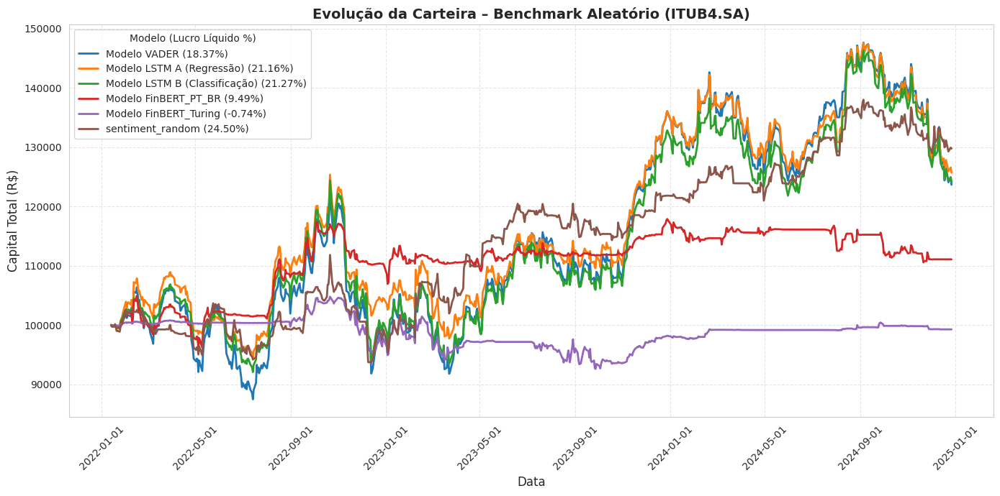

In [50]:
# === IMPORTAÇÕES ===
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
from collections import defaultdict

# === PARÂMETROS ===
ticker = 'ITUB4.SA'
modelos_sentimento = [
    'Modelo VADER',
    'Modelo LSTM A (Regressão)',
    'Modelo LSTM B (Classificação)',
    'Modelo FinBERT_PT_BR',
    'Modelo FinBERT_Turing',
    'sentiment_random'  # benchmark aleatório
]
capital_inicial = 100_000
taxa_b3 = 0.0003

# === PERÍODO ===
datas_validas = df_diario[df_diario['ticker'] == ticker]['date'].dropna()
inicio = pd.to_datetime(datas_validas.min()).strftime('%Y-%m-%d')
fim = pd.to_datetime(datas_validas.max()).strftime('%Y-%m-%d')
print(f"📅 Período: {inicio} a {fim}")

# === PREÇOS ===
df_price = yf.download(ticker, start=inicio, end=fim, progress=False)
if isinstance(df_price.columns, pd.MultiIndex):
    df_price.columns = ['_'.join(col).strip() if col[1] else col[0] for col in df_price.columns]
df_price = df_price.reset_index()
df_price['date'] = pd.to_datetime(df_price['Date']).dt.date
df_price['close'] = df_price[f'Close_{ticker}'] if f'Close_{ticker}' in df_price.columns else df_price['Close']

# === DIRETÓRIO ===
os.makedirs("data", exist_ok=True)

# === RESULTADOS ===
resultados = []
curvas = {}

for modelo_sent in modelos_sentimento:
    print(f"\n▶️ Simulando modelo: {modelo_sent}")

    if modelo_sent == 'sentiment_random':
        # Geração de sentimento aleatório com variabilidade autêntica
        np.random.seed(None)  # garante aleatoriedade diferente em cada execução
        ruido = np.random.normal(loc=0, scale=0.6, size=len(df_price))
        ruido = np.clip(ruido, -1, 1)
        df_sent = pd.DataFrame({
            'date': df_price['date'],
            'sentiment_random': ruido
        })
    else:
        df_sent = df_diario[df_diario['ticker'] == ticker][['date', modelo_sent]].dropna()
        if df_sent.empty:
            print(f"⚠️ Sem dados para {modelo_sent}. Pulando.")
            continue

    df_sent['date'] = pd.to_datetime(df_sent['date']).dt.date
    sentimento_dict = df_sent.set_index('date')[modelo_sent].to_dict()

    capital = capital_inicial
    posicao = 0
    preco_medio = 0.0
    decisoes = []
    operacoes = 0
    acertos = 0
    taxas_B3 = 0.0
    IR_pago = 0.0
    historico_valor = []

    vendas_mes = defaultdict(float)
    lucro_mes = defaultdict(float)
    prejuizo_acumulado = 0.0

    for _, row in df_price.iterrows():
        data = pd.to_datetime(row['date']).date()
        preco = row['close']
        sentimento = sentimento_dict.get(data, 0.0)

        acao = "MANTER"
        quantidade = 0
        taxa = 0.0

        if sentimento > 0:
            valor_para_compra = capital * sentimento
            quantidade = int(valor_para_compra / preco)
            if quantidade > 0:
                valor_op = quantidade * preco
                taxa = valor_op * taxa_b3
                custo_total = valor_op + taxa
                if capital >= custo_total:
                    preco_medio = ((preco_medio * posicao) + valor_op) / (posicao + quantidade) if posicao > 0 else preco
                    capital -= custo_total
                    posicao += quantidade
                    taxas_B3 += taxa
                    operacoes += 1
                    acao = f"COMPRA {quantidade}"

        elif sentimento < 0 and posicao > 0:
            quantidade = int(posicao * abs(sentimento))
            if quantidade > 0:
                valor_op = quantidade * preco
                taxa = valor_op * taxa_b3
                receita_liquida = valor_op - taxa
                capital += receita_liquida
                posicao -= quantidade
                taxas_B3 += taxa
                operacoes += 1
                acao = f"VENDA {quantidade}"

                lucro_real = (preco - preco_medio) * quantidade
                mes = data.strftime('%Y-%m')
                vendas_mes[mes] += valor_op

                if lucro_real > 0:
                    acertos += 1
                    lucro_mes[mes] += lucro_real
                else:
                    prejuizo_acumulado += abs(lucro_real)

        valor_total = capital + posicao * preco
        historico_valor.append(valor_total)

        decisoes.append({
            'date': data,
            'modelo': modelo_sent,
            'sentimento': sentimento,
            'close': preco,
            'acao': acao,
            'quantidade': quantidade,
            'posicao': posicao,
            'capital_em_dinheiro': capital,
            'capital_total_estimado': valor_total,
            'taxas_B3': taxas_B3
        })

    # === CÁLCULO DO IR ===
    for mes in lucro_mes:
        lucro = lucro_mes[mes] - prejuizo_acumulado
        if lucro <= 0:
            prejuizo_acumulado = abs(lucro)
            continue
        if vendas_mes[mes] > 20_000:
            IR_pago += lucro * 0.15
            prejuizo_acumulado = 0.0

    lucro_bruto = valor_total - capital_inicial
    lucro_liquido = lucro_bruto - IR_pago
    lucro_pct = (lucro_liquido / capital_inicial) * 100
    retorno_diario = pd.Series(historico_valor).pct_change().dropna()
    sharpe = retorno_diario.mean() / retorno_diario.std() * np.sqrt(252) if len(retorno_diario) > 1 else 0
    max_drawdown = (pd.Series(historico_valor).cummax() - pd.Series(historico_valor)).max()
    taxa_acerto = acertos / operacoes * 100 if operacoes > 0 else 0

    curvas[modelo_sent] = pd.DataFrame(decisoes)

    resultados.append({
        'modelo': modelo_sent,
        'valor_final': valor_total,
        'lucro_bruto': lucro_bruto,
        'IR_pago': IR_pago,
        'lucro_liquido': lucro_liquido,
        'lucro_pct': lucro_pct,
        'n_operacoes': operacoes,
        'taxa_acerto_pct': taxa_acerto,
        'sharpe_ratio': sharpe,
        'max_drawdown': max_drawdown,
        'taxas_B3': taxas_B3
    })

# === RESUMO FINAL ===
df_resultados = pd.DataFrame(resultados).sort_values(by='lucro_pct', ascending=False)
print("\n📊 COMPARATIVO COM BENCHMARK ALEATÓRIO:")
display(df_resultados)

# === PLOTAGEM ===
plt.figure(figsize=(14, 7))
for modelo, df in curvas.items():
    df['date'] = pd.to_datetime(df['date'])
    lucro = df_resultados[df_resultados['modelo'] == modelo]['lucro_pct'].values[0]
    plt.plot(df['date'], df['capital_total_estimado'], label=f"{modelo} ({lucro:.2f}%)")

plt.title(f"Evolução da Carteira – Benchmark Aleatório ({ticker})", fontsize=14, fontweight='bold')
plt.xlabel("Data")
plt.ylabel("Capital Total (R$)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.tight_layout()
plt.legend(title='Modelo (Lucro Líquido %)', fontsize=10)
plt.show()


<a id='5.2'></a>
## 5.2. Results for Individual Stocks

First running the strategy for google

📅 Período: 2022-01-12 a 2024-12-30

▶️ Modelo proporcional: Modelo VADER

▶️ Modelo proporcional: Modelo LSTM A (Regressão)

▶️ Modelo proporcional: Modelo LSTM B (Classificação)

▶️ Modelo proporcional: Modelo FinBERT_PT_BR

▶️ Modelo proporcional: Modelo FinBERT_Turing

▶️ Modelo proporcional: sentiment_random

📊 RESUMO FINAL COM APLICAÇÃO DE AVERSÃO À PERDA:


,modelo,valor_final,lucro_bruto,IR_pago,lucro_liquido,lucro_pct,n_operacoes,taxa_acerto_pct,sharpe_ratio,max_drawdown,taxas_B3
1,Modelo LSTM A (Regressão),117700.625028,17700.625028,2850.371557,14850.253471,14.850253,286,36.363636,0.837860,8144.190457,880.204760
2,Modelo LSTM B (Classificação),110375.464055,10375.464055,1298.974802,9076.489253,9.076489,331,29.909366,0.529408,10817.939656,662.306609
4,Modelo FinBERT_Turing,85315.968629,-14684.031371,0.000000,-14684.031371,-14.684031,303,17.821782,-0.200282,49025.239860,1594.957476
3,Modelo FinBERT_PT_BR,82071.191936,-17928.808064,0.000000,-17928.808064,-17.928808,222,18.918919,-0.510817,45809.752030,1572.146210
5,sentiment_random,74560.231961,-25439.768039,0.000000,-25439.768039,-25.439768,600,16.333333,-0.495732,39657.965321,6563.894072
0,Modelo VADER,73842.242702,-26157.757298,0.000000,-26157.757298,-26.157757,180,6.111111,-0.246448,47669.574517,462.255738


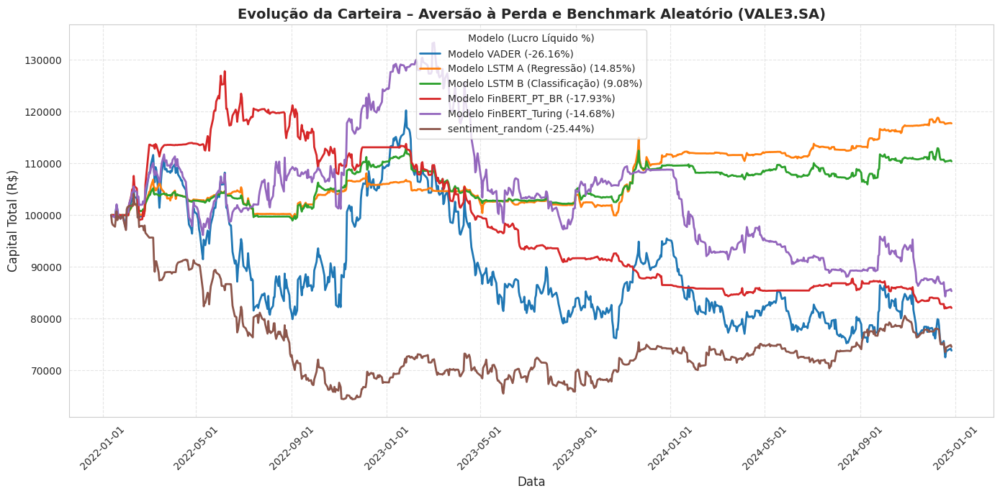

In [51]:
# === IMPORTAÇÕES ===
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
from collections import defaultdict

# === PARÂMETROS ===
ticker = 'VALE3.SA'
modelos_sentimento = [
    'Modelo VADER',
    'Modelo LSTM A (Regressão)',
    'Modelo LSTM B (Classificação)',
    'Modelo FinBERT_PT_BR',
    'Modelo FinBERT_Turing',
    'sentiment_random'  # benchmark aleatório
]
capital_inicial = 100_000
taxa_b3 = 0.0003  # 0,03%
loss_aversion_ratio = 2.25  # fator de aversão à perda

# === PERÍODO ===
datas_validas = df_diario[df_diario['ticker'] == ticker]['date'].dropna()
inicio = pd.to_datetime(datas_validas.min()).strftime('%Y-%m-%d')
fim = pd.to_datetime(datas_validas.max()).strftime('%Y-%m-%d')
print(f"📅 Período: {inicio} a {fim}")

# === PREÇOS ===
df_price = yf.download(ticker, start=inicio, end=fim, progress=False)
if isinstance(df_price.columns, pd.MultiIndex):
    df_price.columns = ['_'.join(col).strip() if col[1] else col[0] for col in df_price.columns]
df_price = df_price.reset_index()
df_price['date'] = pd.to_datetime(df_price['Date']).dt.date
col_close = f'Close_{ticker}' if f'Close_{ticker}' in df_price.columns else 'Close'
df_price['close'] = df_price[col_close]

# === DIRETÓRIO ===
os.makedirs("data", exist_ok=True)

# === RESULTADOS GERAIS ===
resultados = []
curvas = {}

for modelo_sent in modelos_sentimento:
    print(f"\n▶️ Modelo proporcional: {modelo_sent}")

    if modelo_sent == 'sentiment_random':
        df_sent = pd.DataFrame({
            'date': df_price['date'],
            'sentiment_random': np.random.uniform(-1, 1, size=len(df_price))
        })
    else:
        df_sent = df_diario[df_diario['ticker'] == ticker][['date', modelo_sent]].dropna()
        if df_sent.empty:
            print(f"⚠️ Sem dados para {modelo_sent}. Pulando.")
            continue

    df_sent['date'] = pd.to_datetime(df_sent['date']).dt.date
    sentimento_dict = df_sent.set_index('date')[modelo_sent].to_dict()

    capital = capital_inicial
    posicao = 0
    preco_medio = 0.0
    decisoes = []
    operacoes = 0
    acertos = 0
    taxas_B3 = 0.0
    IR_pago = 0.0
    historico_valor = []

    vendas_mes = defaultdict(float)
    lucro_mes = defaultdict(float)
    prejuizo_acumulado = 0.0

    for _, row in df_price.iterrows():
        data = pd.to_datetime(row['date']).date()
        preco = row['close']
        sentimento = sentimento_dict.get(data, 0.0)

        # Ajuste com aversão à perda
        peso = sentimento if sentimento >= 0 else sentimento * loss_aversion_ratio

        acao = "MANTER"
        quantidade = 0
        taxa = 0.0

        # --- COMPRA proporcional ---
        if peso > 0:
            valor_para_compra = capital * peso
            quantidade = int(valor_para_compra / preco)
            if quantidade > 0:
                valor_op = quantidade * preco
                taxa = valor_op * taxa_b3
                custo_total = valor_op + taxa
                if capital >= custo_total:
                    preco_medio = ((preco_medio * posicao) + valor_op) / (posicao + quantidade) if posicao > 0 else preco
                    capital -= custo_total
                    posicao += quantidade
                    taxas_B3 += taxa
                    operacoes += 1
                    acao = f"COMPRA {quantidade}"

        # --- VENDA proporcional ---
        elif peso < 0 and posicao > 0:
            quantidade = int(posicao * abs(peso))
            if quantidade > 0:
                valor_op = quantidade * preco
                taxa = valor_op * taxa_b3
                receita_liquida = valor_op - taxa
                capital += receita_liquida
                posicao -= quantidade
                taxas_B3 += taxa
                operacoes += 1
                acao = f"VENDA {quantidade}"

                lucro_real = (preco - preco_medio) * quantidade
                mes = data.strftime('%Y-%m')
                vendas_mes[mes] += valor_op

                if lucro_real > 0:
                    acertos += 1
                    lucro_mes[mes] += lucro_real
                else:
                    prejuizo_acumulado += abs(lucro_real)

        valor_total = capital + posicao * preco
        historico_valor.append(valor_total)

        decisoes.append({
            'date': data,
            'modelo': modelo_sent,
            'sentimento': sentimento,
            'close': preco,
            'acao': acao,
            'quantidade': quantidade,
            'posicao': posicao,
            'capital_em_dinheiro': capital,
            'capital_total_estimado': valor_total,
            'taxas_B3': taxas_B3
        })

    # === CÁLCULO DE IR ===
    for mes in lucro_mes:
        lucro = lucro_mes[mes] - prejuizo_acumulado
        if lucro <= 0:
            prejuizo_acumulado = abs(lucro)
            continue
        if vendas_mes[mes] > 20_000:
            IR_pago += lucro * 0.15
            prejuizo_acumulado = 0.0

    # === MÉTRICAS FINAIS ===
    lucro_bruto = valor_total - capital_inicial
    lucro_liquido = lucro_bruto - IR_pago
    lucro_pct = (lucro_liquido / capital_inicial) * 100
    retorno_diario = pd.Series(historico_valor).pct_change().dropna()
    sharpe = retorno_diario.mean() / retorno_diario.std() * np.sqrt(252) if len(retorno_diario) > 1 else 0
    max_drawdown = (pd.Series(historico_valor).cummax() - pd.Series(historico_valor)).max()
    taxa_acerto = acertos / operacoes * 100 if operacoes > 0 else 0

    curvas[modelo_sent] = pd.DataFrame(decisoes)

    resultados.append({
        'modelo': modelo_sent,
        'valor_final': valor_total,
        'lucro_bruto': lucro_bruto,
        'IR_pago': IR_pago,
        'lucro_liquido': lucro_liquido,
        'lucro_pct': lucro_pct,
        'n_operacoes': operacoes,
        'taxa_acerto_pct': taxa_acerto,
        'sharpe_ratio': sharpe,
        'max_drawdown': max_drawdown,
        'taxas_B3': taxas_B3
    })

# === RESUMO FINAL ===
df_resultados = pd.DataFrame(resultados).sort_values(by='lucro_pct', ascending=False)
print("\n📊 RESUMO FINAL COM APLICAÇÃO DE AVERSÃO À PERDA:")
display(df_resultados)

# === PLOTAGEM ===
plt.figure(figsize=(14, 7))
for modelo, df in curvas.items():
    df['date'] = pd.to_datetime(df['date'])
    lucro = df_resultados[df_resultados['modelo'] == modelo]['lucro_pct'].values[0]
    plt.plot(df['date'], df['capital_total_estimado'], label=f"{modelo} ({lucro:.2f}%)")

plt.title(f"Evolução da Carteira – Aversão à Perda e Benchmark Aleatório ({ticker})", fontsize=14, fontweight='bold')
plt.xlabel("Data")
plt.ylabel("Capital Total (R$)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.tight_layout()
plt.legend(title='Modelo (Lucro Líquido %)', fontsize=10)
plt.show()


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from collections import defaultdict

# === PARÂMETROS ===
tickers = ['VALE3.SA', 'PETR4.SA', 'ITUB4.SA', 'BBAS3.SA']
modelos_sent = [
    'sentiment_lex',
    'sentiment_LSTM',
    'sentiment_FinBERT_PT_BR',
    'sentiment_FinBERT_Turing',
    'sentiment_Multilingual_Sentiment',
    'sentiment_random'
]
capital_inicial = 100_000
taxa_b3 = 0.0003
start = '2025-01-01'
end   = '2025-05-04'

# Estruturas para armazenar curvas
curvas_hold  = {}
curvas_trade = {}

for ticker in tickers:
    # 1. Obtenção de preços
    df_price = yf.download(ticker, start=start, end=end, progress=False).reset_index()
    df_price['date']  = pd.to_datetime(df_price['Date']).dt.date
    # normalização de coluna de fechamento
    close_col = f'Close_{ticker}'
    df_price['close'] = (df_price[close_col] if close_col in df_price else df_price['Close'])

    # 2. Cálculo buy-and-hold
    preco0 = df_price.loc[0, 'close']
    n_acoes = int(capital_inicial / preco0)
    sobra    = capital_inicial - n_acoes * preco0
    df_hold = df_price[['date']].copy()
    df_hold['capital_hold'] = n_acoes * df_price['close'] + sobra
    curvas_hold[ticker] = df_hold

    # 3. Simulação de trading
    # (pressupõe existência de df_diario com sentimentos para todos os tickers)
    df_sent_all = df_diario[df_diario['ticker']==ticker]
    capital = capital_inicial
    posicao = 0
    preco_medio = 0.0
    historico = []
    # geração de sentimento aleatório
    for modelo in modelos_sent:
        if modelo=='sentiment_random':
            ruido = np.random.normal(0,0.6, size=len(df_price))
            ruido = np.clip(ruido, -1, 1)
            df_sent = pd.DataFrame({'date':df_price['date'],'sentiment_random':ruido})
        else:
            df_tmp = df_sent_all[['date',modelo]].dropna()
            df_sent = df_tmp.copy()
        sentimento_dict = df_sent.set_index(pd.to_datetime(df_sent['date']).dt.date)[modelo].to_dict()
        capital = capital_inicial; posicao=0; preco_medio=0.0; taxas_B3=0.0
        historico = []
        for row in df_price.itertuples():
            d = row.date; p = row.close
            s = sentimento_dict.get(d, 0.0)
            # compra
            if s>0:
                v = capital * s
                q = int(v/p)
                if q>0:
                    op = q*p; tx = op*taxa_b3
                    if capital>=op+tx:
                        preco_medio = ((preco_medio*posicao)+op)/(posicao+q) if posicao>0 else p
                        capital -= op+tx
                        posicao += q
                        taxas_B3 += tx
            # venda
            elif s<0 and posicao>0:
                q = int(posicao * abs(s))
                if q>0:
                    op = q*p; tx = op*taxa_b3
                    capital += op-tx
                    posicao -= q
                    taxas_B3 += tx
            total = capital + posicao*p
            historico.append({'date':d, 'capital': total})
        curvas_trade.setdefault(ticker, pd.DataFrame(historico))

# 4. Plotagem comparativa em subplots
n = len(tickers)
fig, axes = plt.subplots(n, 1, figsize=(12, 4*n), sharex=True)
for ax, ticker in zip(axes, tickers):
    df_h = curvas_hold[ticker]
    df_t = curvas_trade[ticker]
    df_h['date'] = pd.to_datetime(df_h['date'])
    df_t['date'] = pd.to_datetime(df_t['date'])
    ax.plot(df_h['date'], df_h['capital_hold'],
            '--', color='gray', label='Buy-and-Hold')
    ax.plot(df_t['date'], df_t['capital'],
            linewidth=1.5, label='Trading')
    ax.set_title(f'{ticker}', fontweight='bold')
    ax.grid(linestyle=':', alpha=0.6)
    ax.legend()
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    for label in ax.get_xticklabels():
        label.set_rotation(45)
plt.xlabel('Data')
plt.ylabel('Capital Total (R$)')
plt.tight_layout()
plt.show()
